This is the implementation of a license plate detection project. In this notebook we aim to illustrate detail all part that we have mentioned in the presentation.


In [11]:
import os
import cv2
import easyocr
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from os import listdir
from ultralytics import YOLO

# 1. Data set



* We have collected manually 280 images of vehicles from many types, angles and distance. One image contains only one license plate. 
* Size: 640x640 pixels
* Type: jpg file

# Display the collected data

Training Images


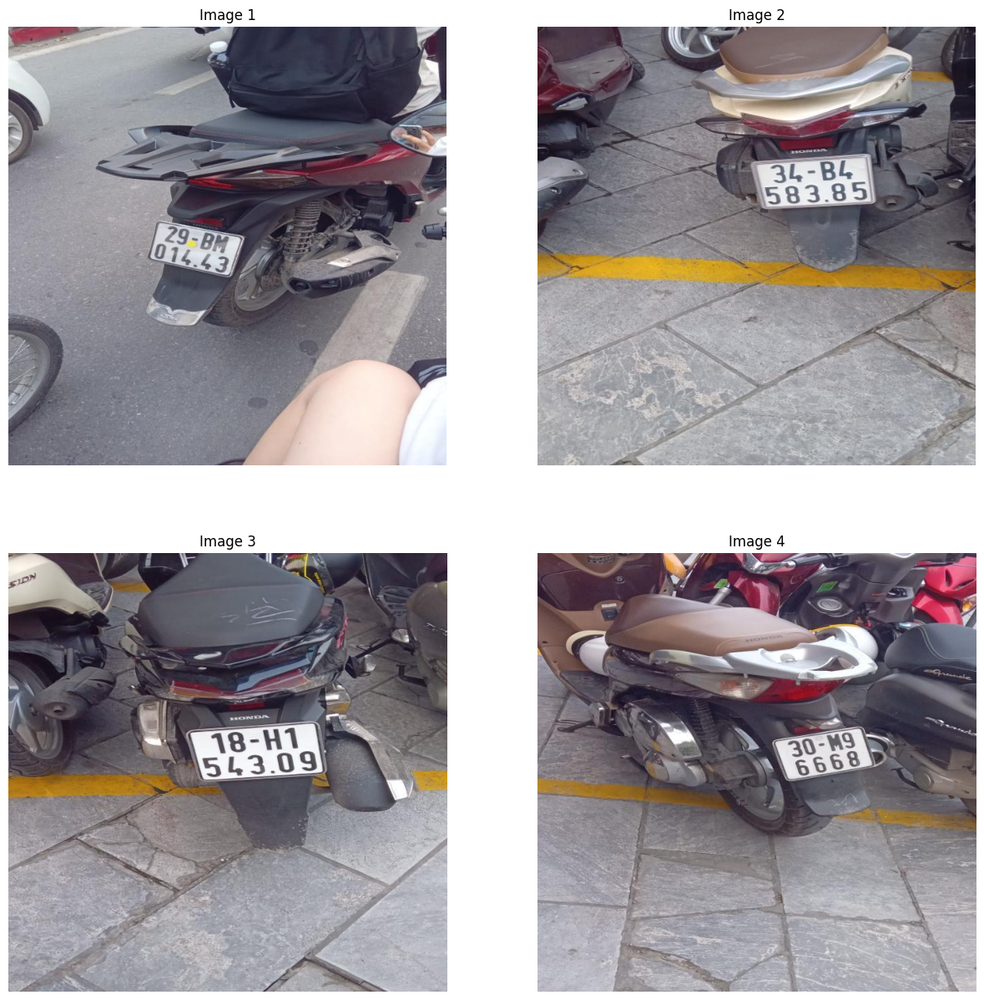

In [13]:
train_img1 = cv2.imread("../LicensePlateDetection-main/data/train/images/img-1-_jpg.rf.58de3a25bdad5d3c6db7eaf155539b4d.jpg")
train_img2 = cv2.imread("../LicensePlateDetection-main/data/train/images/img-2-_jpg.rf.3a6e792dcee65966b9b642e170d8e665.jpg")
train_img3 = cv2.imread("../LicensePlateDetection-main/data/train/images/img-3-_jpg.rf.255e69580c55a289c7c844bbc6dbc0c2.jpg")
train_img4 = cv2.imread("../LicensePlateDetection-main/data/train/images/img-4-_jpg.rf.32f80f982d49e6e663a5e91bf59cf195.jpg")

fig = plt.figure(figsize = (15,15))
rows = 2
columns = 2


print("Training Images")

fig.add_subplot(rows, columns, 1)
# get b,g,r
b,g,r = cv2.split(train_img1)       
train_img1 = cv2.merge([r,g,b])
plt.imshow(train_img1)
plt.axis("off")
plt.title("Image 1")

fig.add_subplot(rows, columns, 2)
b,g,r = cv2.split(train_img2)      
train_img2 = cv2.merge([r,g,b])
plt.imshow(train_img2)
plt.axis("off")
plt.title("Image 2")

fig.add_subplot(rows, columns, 3)
b,g,r = cv2.split(train_img3)      
train_img3 = cv2.merge([r,g,b])
plt.imshow(train_img3)
plt.axis("off")
plt.title("Image 3")

fig.add_subplot(rows, columns, 4)
b,g,r = cv2.split(train_img4)      
train_img4 = cv2.merge([r,g,b])
plt.imshow(train_img4)
plt.axis("off")
plt.title("Image 4")

plt.show()

# fig.add_subplot(rows, columns, 2)
# plt.imshow(test_img)
# plt.axis("off")
# plt.title("Test Image")




# 2. Preprocessing Data

We using **Roboflow**, a tool developed to use for label the dataset, since the dataset must be labeled in a correct format to be trained by Yolov8. Here is an example of a label for an image.

In [14]:
f = open("../LicensePlateDetection-main/data/train/labels/img-1-_jpg.rf.58de3a25bdad5d3c6db7eaf155539b4d.txt", "r")
print("Example of the image label")
print(f.read())
f.close()
#from left to right: class, x_center, y_center, width, height

Example of the image label
0 0.428125 0.50625 0.221875 0.13125


# 3. Bulding Dataset

* Spliting data: 70% training, 20% validation, 10% testing
* Organize the folders in to correct format, with a big data folder and subfolders inside.




# 4. Implementing

Import necessary library


# Phase 1: Object Detection

**Workflow** 

Step 1: Training the model with YoloV8 and 100 epochs.

* Epoch = one complete pass of the training dataset through the algorithm


* The numbers of epochs recommended from ultralytics is 300 epochs for 1500 images. Due to the limit of time and cpu, we train our data with 100 and still get an accepted result.

Step 2: Model evaluation: evaluate base on Precision, Recall and mAPs

Step 3: Testing with the test set 





# Training the model

In [3]:
model = YOLO("yolov8n.pt")

results = model.train(data=os.path.join("/home/vannguyen/Downloads/LicensePlateDetection-main/data", "data.yaml"), epochs = 100)

Ultralytics 8.3.130 🚀 Python-3.8.5 torch-2.4.1+cu121 CPU (11th Gen Intel Core(TM) i5-11300H 3.10GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/vannguyen/Downloads/LicensePlateDetection-main/data/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patien

train: Scanning /home/vannguyen/Downloads/LicensePlateDetection-main/data/train/labels.cache... 442 images, 2 backgrounds, 0 corrupt: 100%|██████████| 442/442 [00:00<?, ?it/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2960.1±836.0 MB/s, size: 50.7 KB)



val: Scanning /home/vannguyen/Downloads/LicensePlateDetection-main/data/valid/labels.cache... 55 images, 0 backgrounds, 0 corrupt: 100%|██████████| 55/55 [00:00<?, ?it/s]

Plotting labels to runs/detect/train2/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G     0.7109      2.225     0.9766         11        640: 100%|██████████| 28/28 [01:32<00:00,  3.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]

                   all         55         55          1      0.463      0.989      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G     0.6905      1.346     0.9284         14        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.09s/it]

                   all         55         55          1      0.126      0.645      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G     0.7727      1.232       0.96         16        640: 100%|██████████| 28/28 [01:31<00:00,  3.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.09s/it]

                   all         55         55      0.645      0.327       0.46       0.36

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      4/100         0G     0.7352       1.18     0.9745         15        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.26s/it]

                   all         55         55      0.778      0.436      0.633      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      5/100         0G     0.7022     0.9675     0.9427         19        640: 100%|██████████| 28/28 [01:29<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.994      0.945      0.992      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G     0.7306     0.8877      0.932         18        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.03s/it]

                   all         55         55      0.978          1      0.995      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G     0.7445     0.8105      0.947         15        640: 100%|██████████| 28/28 [01:28<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all         55         55      0.963      0.982      0.993       0.83

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      8/100         0G     0.6773     0.7551     0.9468         17        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55          1          1      0.995      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G     0.6465      0.704     0.9265         17        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.08s/it]

                   all         55         55      0.929      0.982       0.99      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G     0.6362     0.6575     0.9167         22        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.00s/it]

                   all         55         55      0.761      0.964      0.919      0.762

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     11/100         0G     0.6157     0.6375     0.9417         20        640: 100%|██████████| 28/28 [01:29<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.942      0.982      0.986      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G     0.6308     0.6103     0.9259         18        640: 100%|██████████| 28/28 [01:29<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55      0.964          1      0.983      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G     0.6562     0.5849      0.925         23        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  2.00s/it]

                   all         55         55      0.998          1      0.995       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G     0.5549     0.5103     0.8968         19        640: 100%|██████████| 28/28 [01:31<00:00,  3.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55      0.978          1      0.994      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G     0.5304     0.4885     0.8885         12        640: 100%|██████████| 28/28 [01:30<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.998          1      0.995      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G     0.5261     0.4854     0.8918         22        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.999          1      0.995      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     17/100         0G     0.5431     0.4813     0.8902         24        640: 100%|██████████| 28/28 [01:28<00:00,  3.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.997          1      0.995      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     18/100         0G     0.5142     0.4679     0.8941         20        640: 100%|██████████| 28/28 [01:29<00:00,  3.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.5299     0.4777        0.9         11        640: 100%|██████████| 28/28 [01:29<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.996          1      0.995       0.87

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     20/100         0G     0.5339      0.469     0.8988         18        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all         55         55      0.994      0.982      0.995      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G     0.5258     0.4567     0.9059         13        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all         55         55          1      0.999      0.995      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     22/100         0G     0.5366     0.4503     0.8926         15        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.94s/it]

                   all         55         55      0.996          1      0.995      0.896

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     23/100         0G     0.5213     0.4504     0.8921         21        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.999          1      0.995      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     24/100         0G      0.524     0.4446     0.8765         12        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.998          1      0.995      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     25/100         0G     0.5126     0.4331     0.8852         19        640: 100%|██████████| 28/28 [01:29<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.03s/it]

                   all         55         55      0.998          1      0.995      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G     0.5077     0.4253     0.8811         13        640: 100%|██████████| 28/28 [01:29<00:00,  3.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55      0.999          1      0.995      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G     0.4692     0.3884     0.8722         14        640: 100%|██████████| 28/28 [01:28<00:00,  3.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.10s/it]

                   all         55         55          1          1      0.995      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G     0.4731     0.3952     0.8718         15        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.998          1      0.995       0.92

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     29/100         0G     0.4719     0.4024      0.875         13        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.913

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     30/100         0G     0.4868     0.4053     0.8861         20        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.996          1      0.995      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G     0.4593     0.3869     0.8677         20        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.99s/it]

                   all         55         55      0.994          1      0.995      0.927

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     32/100         0G     0.4327     0.3764     0.8667         12        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.11s/it]

                   all         55         55      0.999          1      0.995      0.925

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     33/100         0G     0.4395     0.3724     0.8834         13        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.08s/it]

                   all         55         55      0.998          1      0.995       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G     0.4443      0.376     0.8611         22        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.994          1      0.995      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G     0.4429      0.381     0.8699         14        640: 100%|██████████| 28/28 [01:31<00:00,  3.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.06s/it]

                   all         55         55      0.999          1      0.995      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G     0.4615     0.3743     0.8781         24        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.999          1      0.995      0.926

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     37/100         0G     0.4416     0.3771     0.8673         21        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all         55         55      0.999          1      0.995      0.919

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     38/100         0G     0.4296     0.3661     0.8687         11        640: 100%|██████████| 28/28 [01:31<00:00,  3.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995      0.938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G     0.4403     0.3682     0.8748         21        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55      0.997          1      0.995      0.952

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     40/100         0G     0.4285       0.35     0.8614         12        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.99s/it]

                   all         55         55      0.997          1      0.995      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.4367      0.355     0.8617         22        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  2.00s/it]

                   all         55         55      0.998          1      0.995      0.936

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     42/100         0G     0.4219     0.3404     0.8658         22        640: 100%|██████████| 28/28 [01:29<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.94s/it]

                   all         55         55      0.999          1      0.995      0.922

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     43/100         0G      0.427     0.3279     0.8647         17        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.999          1      0.995      0.939

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     44/100         0G     0.4238     0.3495     0.8531         14        640: 100%|██████████| 28/28 [01:32<00:00,  3.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.00s/it]

                   all         55         55      0.999          1      0.995      0.935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.4297     0.3403     0.8493         13        640: 100%|██████████| 28/28 [01:30<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55      0.999          1      0.995      0.929

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     46/100         0G     0.4096     0.3356      0.858         19        640: 100%|██████████| 28/28 [01:31<00:00,  3.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.06s/it]

                   all         55         55      0.999          1      0.995      0.953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.3877     0.3211     0.8551         22        640: 100%|██████████| 28/28 [01:31<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995      0.958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G      0.406     0.3321     0.8546         17        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995      0.945



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.3974     0.3248       0.85         14        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.998          1      0.995      0.951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.3925     0.3174     0.8567         11        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55      0.998          1      0.995      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.3951      0.328     0.8668         16        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  2.00s/it]

                   all         55         55      0.998          1      0.995      0.952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.3992     0.3165     0.8606         13        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.03s/it]

                   all         55         55      0.999          1      0.995      0.948

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     53/100         0G     0.3973     0.3217     0.8536         12        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all         55         55      0.999          1      0.995      0.941



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.3733     0.3116     0.8415         13        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.07s/it]

                   all         55         55      0.999          1      0.995       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G     0.3551     0.3091     0.8479         13        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.999          1      0.995      0.962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G     0.3619     0.2908     0.8412         18        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.998          1      0.995      0.959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G      0.369     0.2998     0.8524         21        640: 100%|██████████| 28/28 [01:31<00:00,  3.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.00s/it]

                   all         55         55      0.999          1      0.995      0.964



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G      0.396     0.3005     0.8592         11        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G     0.4156      0.327     0.8532         11        640: 100%|██████████| 28/28 [01:30<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.99s/it]

                   all         55         55      0.999          1      0.995      0.956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G     0.3849     0.3008     0.8539         15        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.99s/it]

                   all         55         55      0.999          1      0.995      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     61/100         0G     0.3615     0.2898     0.8448         21        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.998          1      0.995      0.956

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     62/100         0G     0.3535     0.2911     0.8279         19        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     63/100         0G     0.3745     0.2907     0.8492         16        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995       0.95



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G     0.3825     0.3001     0.8457         25        640: 100%|██████████| 28/28 [01:33<00:00,  3.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.999          1      0.995      0.958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.3723     0.3066     0.8562         13        640: 100%|██████████| 28/28 [01:29<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.999          1      0.995      0.974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G     0.3439     0.2795     0.8371         16        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995       0.97



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.3614     0.2783     0.8391         19        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.998          1      0.995      0.956

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     68/100         0G     0.3575     0.2839     0.8459         15        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.999          1      0.995      0.959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G     0.3488     0.2866     0.8447         17        640: 100%|██████████| 28/28 [01:31<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]

                   all         55         55      0.999          1      0.995      0.971

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     70/100         0G      0.344     0.2807     0.8382         23        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.08s/it]

                   all         55         55      0.999          1      0.995      0.975



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.3358     0.2757      0.835         12        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.976



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.3212     0.2659     0.8358         15        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.93s/it]

                   all         55         55      0.999          1      0.995      0.972

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     73/100         0G     0.3173     0.2619     0.8352         23        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.999          1      0.995      0.964

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     74/100         0G     0.3339     0.2739     0.8435         16        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.3382     0.2678     0.8482         10        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     76/100         0G     0.3049     0.2525     0.8258         19        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.999          1      0.995      0.967

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     77/100         0G      0.327     0.2746     0.8384         17        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.999          1      0.995      0.967



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.3139     0.2603     0.8267         14        640: 100%|██████████| 28/28 [01:30<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.3178     0.2525     0.8416         20        640: 100%|██████████| 28/28 [01:32<00:00,  3.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.94s/it]

                   all         55         55      0.999          1      0.995      0.973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G     0.3129     0.2539     0.8375         26        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.94s/it]

                   all         55         55      0.999          1      0.995      0.972



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.3229     0.2574     0.8299         18        640: 100%|██████████| 28/28 [01:31<00:00,  3.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995      0.969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.3202     0.2581     0.8289         16        640: 100%|██████████| 28/28 [01:33<00:00,  3.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.999          1      0.995      0.975



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G     0.2994     0.2475     0.8345         19        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all         55         55      0.999          1      0.995      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     84/100         0G     0.2976     0.2415     0.8367         13        640: 100%|██████████| 28/28 [01:31<00:00,  3.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.999          1      0.995      0.964



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G     0.3029     0.2432     0.8293         18        640: 100%|██████████| 28/28 [01:31<00:00,  3.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.01s/it]

                   all         55         55      0.999          1      0.995      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     86/100         0G     0.3044     0.2465     0.8345         17        640: 100%|██████████| 28/28 [01:31<00:00,  3.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.2878      0.236      0.838         18        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.11s/it]

                   all         55         55      0.999          1      0.995       0.97



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G     0.3004     0.2448      0.837         17        640: 100%|██████████| 28/28 [01:32<00:00,  3.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.96s/it]

                   all         55         55      0.999          1      0.995      0.969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.2814     0.2354     0.8372         17        640: 100%|██████████| 28/28 [01:32<00:00,  3.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  2.00s/it]

                   all         55         55      0.999          1      0.995      0.978



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G     0.2796      0.246     0.8189         16        640: 100%|██████████| 28/28 [01:32<00:00,  3.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.98s/it]

                   all         55         55      0.999          1      0.995      0.972


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G     0.2231     0.1917     0.7838         10        640: 100%|██████████| 28/28 [01:32<00:00,  3.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.999          1      0.995      0.966

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     92/100         0G     0.2265     0.1902     0.7849         10        640: 100%|██████████| 28/28 [01:30<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.07s/it]

                   all         55         55      0.999          1      0.995      0.962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     93/100         0G     0.2242     0.1919     0.7857         10        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.99s/it]

                   all         55         55      0.999          1      0.995      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     94/100         0G     0.2234     0.1859     0.7808         10        640: 100%|██████████| 28/28 [01:30<00:00,  3.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.09s/it]

                   all         55         55      0.999          1      0.995      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     95/100         0G     0.2173     0.1834      0.783          9        640: 100%|██████████| 28/28 [01:31<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.999          1      0.995      0.971



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G       0.22     0.1834     0.7811         10        640: 100%|██████████| 28/28 [01:30<00:00,  3.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         55         55      0.999          1      0.995      0.974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G     0.2157     0.1825     0.7865         10        640: 100%|██████████| 28/28 [01:29<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.02s/it]

                   all         55         55      0.999          1      0.995      0.978



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G      0.212     0.1829      0.766         10        640: 100%|██████████| 28/28 [01:29<00:00,  3.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.05s/it]

                   all         55         55      0.999          1      0.995      0.976



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.2031     0.1756     0.7852         10        640: 100%|██████████| 28/28 [01:30<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.05s/it]

                   all         55         55      0.999          1      0.995      0.972

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



    100/100         0G     0.2016     0.1764     0.7769         10        640: 100%|██████████| 28/28 [01:30<00:00,  3.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.05s/it]

                   all         55         55      0.999          1      0.995      0.973



100 epochs completed in 2.634 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.130 🚀 Python-3.8.5 torch-2.4.1+cu121 CPU (11th Gen Intel Core(TM) i5-11300H 3.10GHz)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.89s/it]


                   all         55         55      0.999          1      0.995      0.978
Speed: 1.1ms preprocess, 60.6ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/train2


# Model evaluation

* Result

In [4]:
model = YOLO(r'C:\Users\Van\Downloads\LicensePlate\runs\detect\train\weights\best.pt')
model_result = model.val(data=r'C:\Users\Van\Downloads\LicensePlate\data\data.yaml')


Ultralytics YOLOv8.2.2  Python-3.10.0 torch-2.3.0+cpu CPU (11th Gen Intel Core(TM) i5-11300H 3.10GHz)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\Users\Van\Downloads\LicensePlate\data\valid\labels.cache... 55 images, 0 backgrounds, 0 corrupt: 100%|██████████| 55/55 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.60s/it]


                   all         55         55      0.999          1      0.995      0.983
Speed: 1.7ms preprocess, 102.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs\detect\val


* **Precision**: ratio of correctly classified as license plate over the numbers of license plate

Precision = TP/(TP + FP)

where:

TP - True Positive: numbers of license plate image have been properly classify

FP - False Positive: numbers of image classified as license plate although they are not

* **Recall**: ratio of correctly classified as license plate (TP) over total numbers of actual license plate. **Recall can tell the ability of the model to identify all instances of objects in the image**.

Recall = TP/(TP+FN)

where:

FN - False Negative: numbers of license plate missclassified although they are license plate


* **mAP50**: Mean average precision calculated at an intersection over union (IoU) threshold of 0.50. It's a measure of the model's accuracy considering only the "easy" detections.


* **mAP50-95**: The average of the mean average precision calculated at varying IoU thresholds, ranging from 0.50 to 0.95. It gives a comprehensive view of the model's performance across different levels of detection difficulty.




# Testing with the test set

In [5]:
def predict_license(best_point, path):
    model.predict(path, save=True, save_txt=True, save_conf=True, imgsz=320)
    print(model.metrics)


if __name__=='__main__':
    predict_license(best_point=r'/home/vannguyen/Downloads/LicensePlateDetection-main/runs/detect/train2/weights/best.pt', path=r'/home/vannguyen/Downloads/LicensePlateDetection-main/data/test/images')
    


image 1/55 /home/vannguyen/Downloads/LicensePlateDetection-main/data/test/images/img-101-_jpg.rf.073ca6f3b103a92a03312c02ace8ffe6.jpg: 320x320 1 license, 71.6ms
image 2/55 /home/vannguyen/Downloads/LicensePlateDetection-main/data/test/images/img-128-_jpg.rf.58f48c2966cd3c92cf544307e0db8b01.jpg: 320x320 1 license, 37.5ms
image 3/55 /home/vannguyen/Downloads/LicensePlateDetection-main/data/test/images/img-134-_jpg.rf.e13234c3a8c0aa9ce6993646d1c9e5d7.jpg: 320x320 1 license, 37.7ms
image 4/55 /home/vannguyen/Downloads/LicensePlateDetection-main/data/test/images/img-145-_jpg.rf.4a598a2ec06aa534ff17e1a3a97f70a1.jpg: 320x320 1 license, 33.1ms
image 5/55 /home/vannguyen/Downloads/LicensePlateDetection-main/data/test/images/img-152-_jpg.rf.36f61b74c6548e827f92d60fa93842c7.jpg: 320x320 1 license, 40.4ms
image 6/55 /home/vannguyen/Downloads/LicensePlateDetection-main/data/test/images/img-154-_jpg.rf.dd1c4b4962f2ad52e1ab1bd04d1c40e3.jpg: 320x320 1 license, 36.5ms
image 7/55 /home/vannguyen/Downlo

# Phase 2: OCR

**Work flow**

Step 1: Using image processing techniques to enhance the quality

Step 2: Using OCR technique to recognize the characters on the license plate

Step 3: Evaluating


# Extract license plate from input image

In [24]:
PROJECT_PATH = "/runs/detect"
PROJECT_NAME = "/inference"

def extract_plate(img):
	plate_img = img
	license_plate_detector = YOLO(r'/home/vannguyen/Downloads/LicensePlateDetection-main/runs/detect/train2/weights/best.pt')
	result = license_plate_detector(plate_img, save=True, save_crop=True, project=PROJECT_PATH, name=PROJECT_NAME, exist_ok=True)
	return result

In [7]:
image_folder = f"/home/vannguyen/Downloads/LicensePlateDetection-main/data/valid/images"
file_list = os.listdir(image_folder)

for file_name in file_list:
    # Construct the full file path
    file_path = os.path.join(image_folder, file_name)
    image = cv2.imread(file_path)
    plate = extract_plate(file_path)   


image 1/1 /home/vannguyen/Downloads/LicensePlateDetection-main/data/valid/images/img-180-_jpg.rf.728d6d554fcab4fcbf034fbe9ebbfcd0.jpg: 640x640 1 license, 97.1ms
Speed: 1.2ms preprocess, 97.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/inference

image 1/1 /home/vannguyen/Downloads/LicensePlateDetection-main/data/valid/images/img-216-_jpg.rf.75caebed52ab75a99348d577ca000e9b.jpg: 640x640 1 license, 52.4ms
Speed: 1.2ms preprocess, 52.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/inference

image 1/1 /home/vannguyen/Downloads/LicensePlateDetection-main/data/valid/images/img-395-_jpg.rf.bac731f876b74b9f8de6f6ae6f7694bf.jpg: 640x640 1 license, 76.6ms
Speed: 1.6ms preprocess, 76.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/inference

image 1/1 /home/vannguyen/Downloads/LicensePlateDetection-main/data/valid/images/img-246-_jpg.rf.7e8cfa3e

# Image Processing and EasyOCR

* An example of a crop image

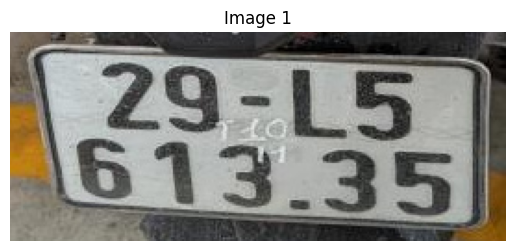

In [64]:
#plot image 
img1 = cv2.imread("runs/detect/inference/crops/license/img-106-_jpg.rf.jpg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
plt.imshow(img1)
plt.axis("off")
plt.title("Image 1")
plt.show()



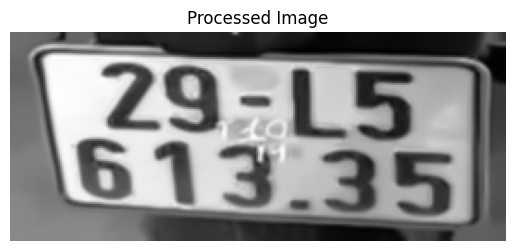

In [60]:
#plot image
img1 = cv2.imread("runs/detect/inference/crops/license/img-106-_jpg.rf.jpg")
# Convert to RGB for display (if needed)
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

# Convert to grayscale for histogram equalization
gray = cv2.cvtColor(img1_rgb, cv2.COLOR_RGB2GRAY)

# Improve contrast using histogram equalization
equalized = cv2.equalizeHist(gray)

# Remove blur
blurred = cv2.GaussianBlur(equalized, (3, 3), 0)

# Remove noise
denoised = cv2.fastNlMeansDenoising(blurred, None, 12, 7, 21)

# Display the final image
plt.imshow(denoised, cmap='gray')
plt.axis("off")
plt.title("Processed Image")
plt.show()


In [35]:
import jiwer

Using CPU. Note: This module is much faster with a GPU.


License plate number: [894- 146.26]


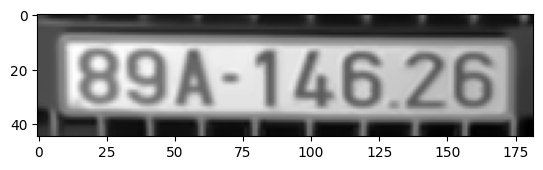

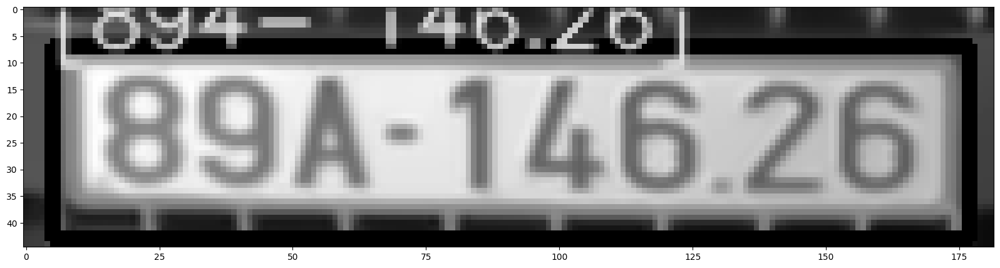

Using CPU. Note: This module is much faster with a GPU.


License plate number: 23-N1 062.42
Character Error Rate: 0.08
Accuracy: 0.92


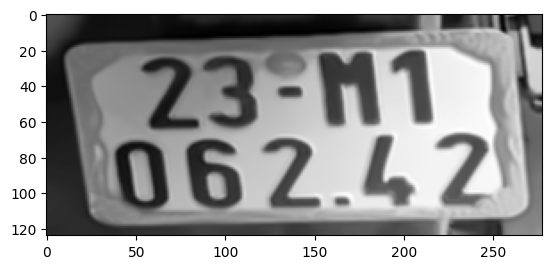

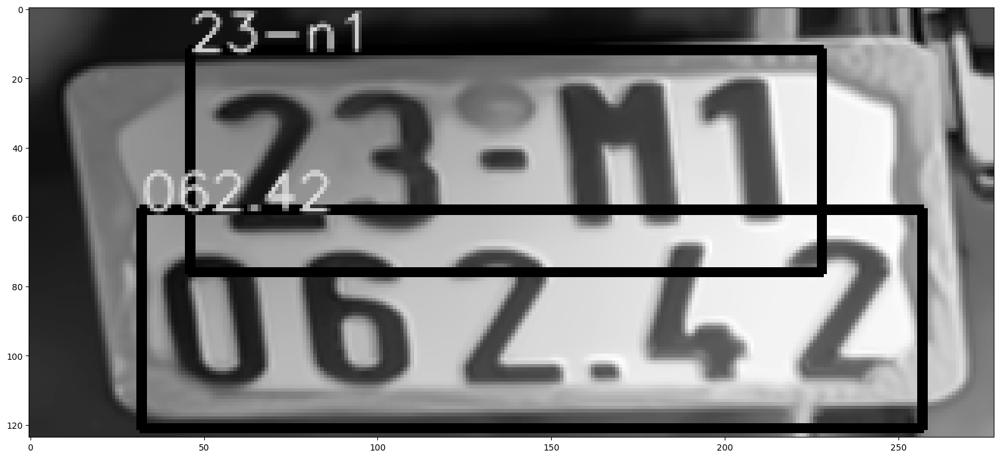

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29A 015.19


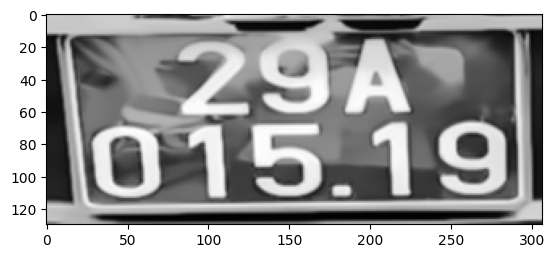

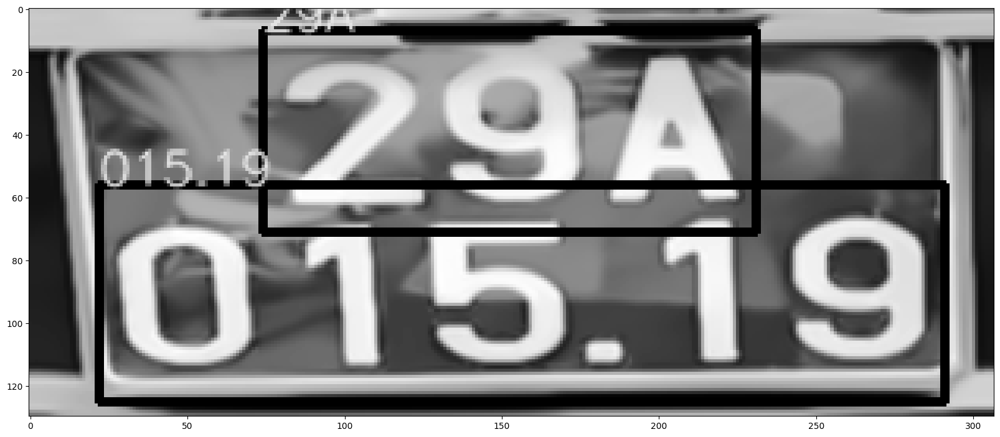

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0K 15262


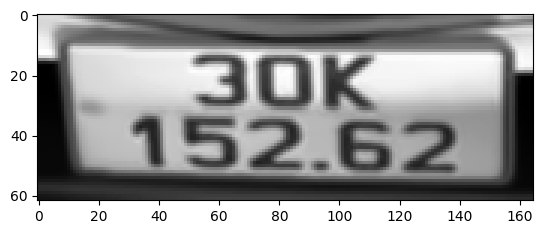

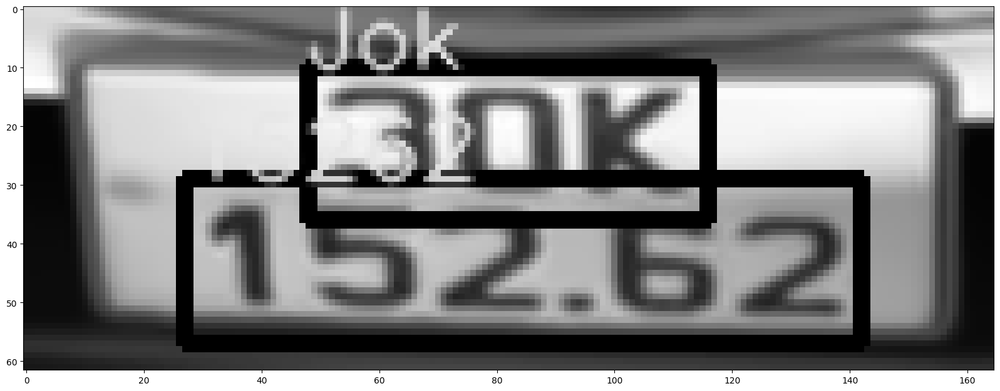

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30-FZ 3499


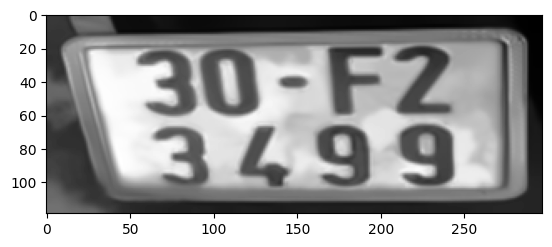

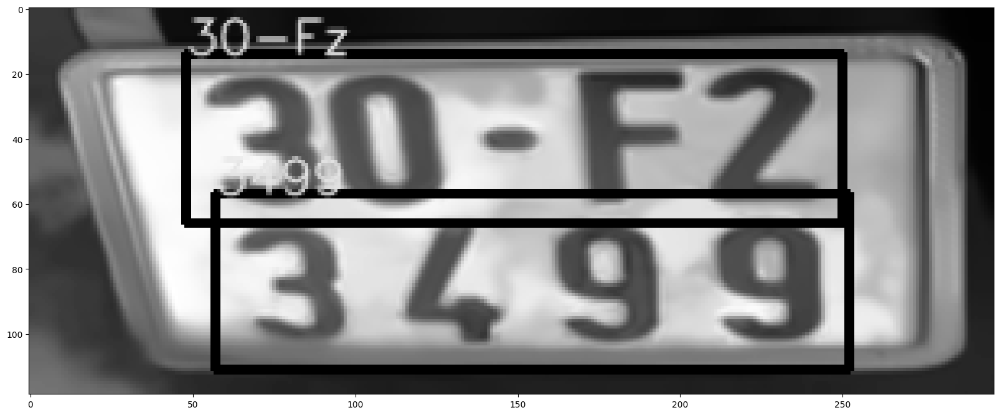

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0K 046.69


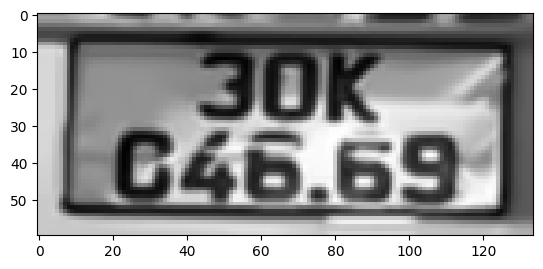

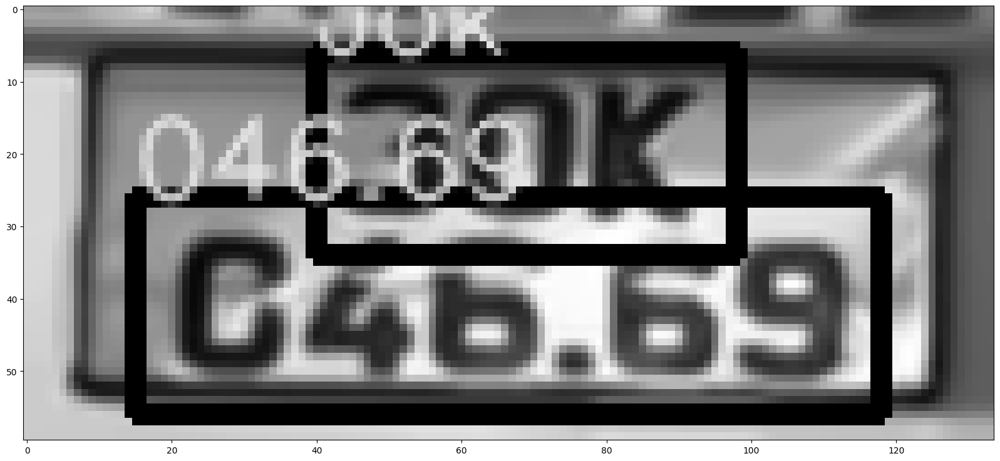

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 24354


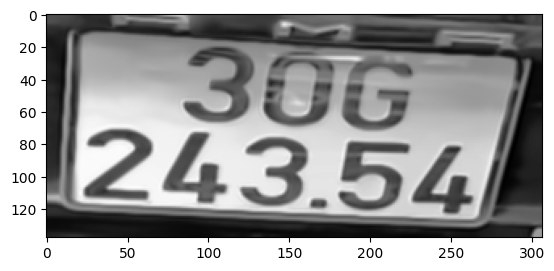

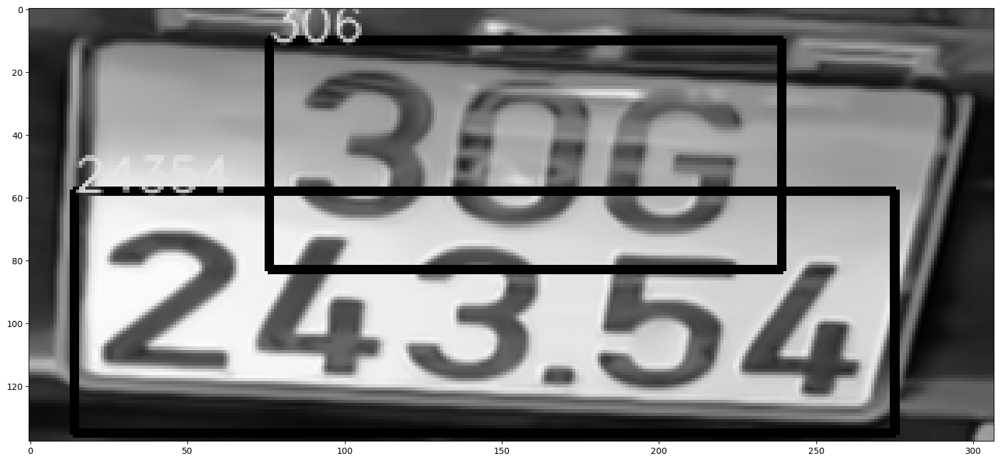

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30K-006.06
Character Error Rate: 0.00
Accuracy: 1.00


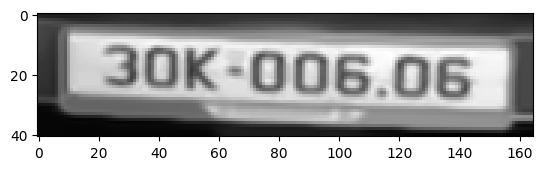

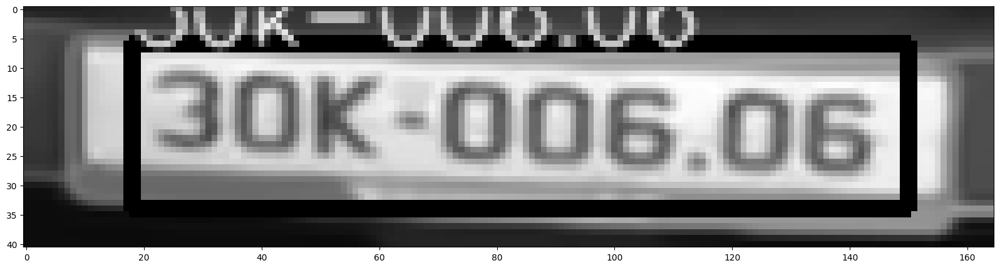

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F.722.28
Character Error Rate: 0.20
Accuracy: 0.80


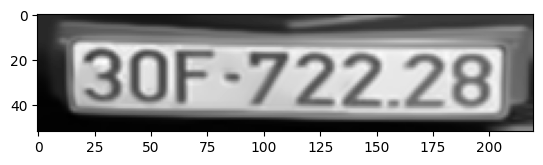

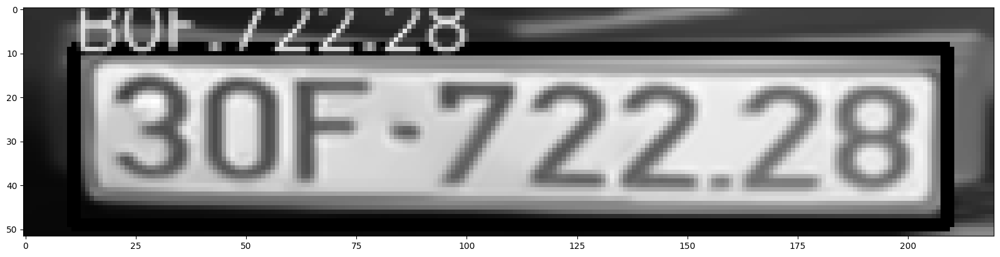

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30G 997,34
Character Error Rate: 0.20
Accuracy: 0.80


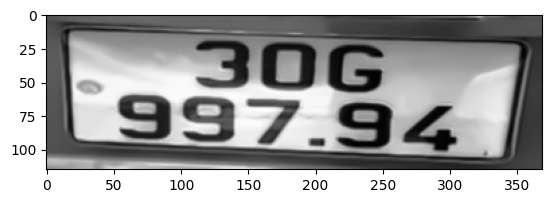

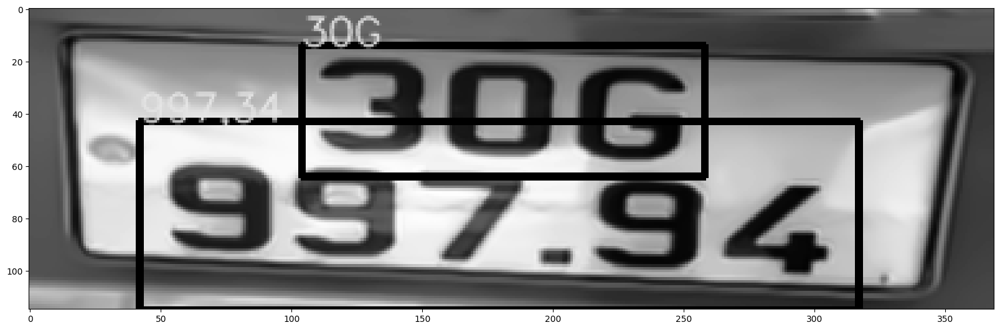

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 997,34


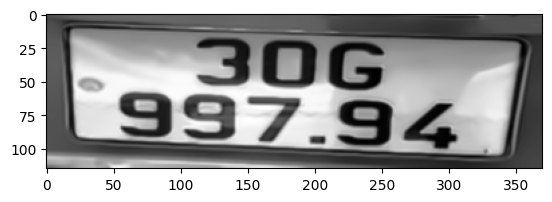

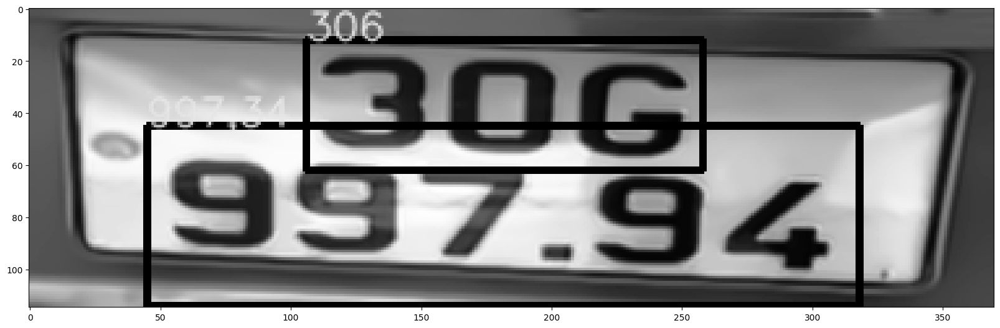

Using CPU. Note: This module is much faster with a GPU.


License plate number: B06: 100.64


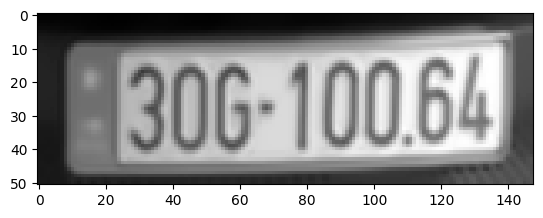

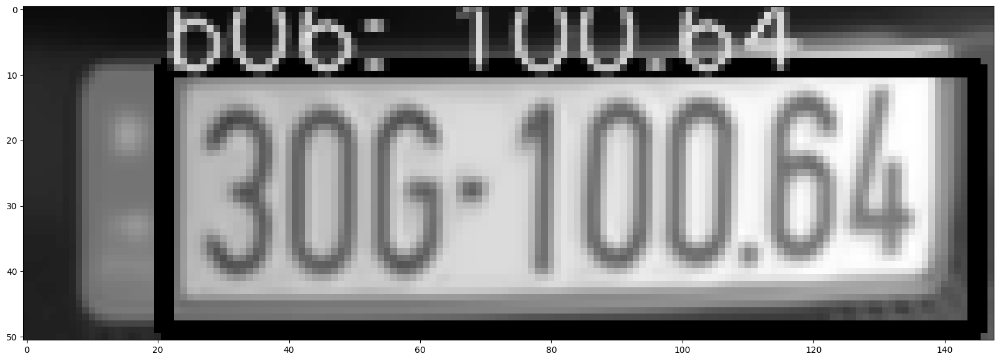

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-S6 036  1Z
Character Error Rate: 0.25
Accuracy: 0.75


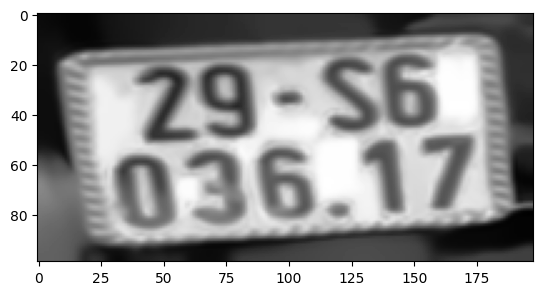

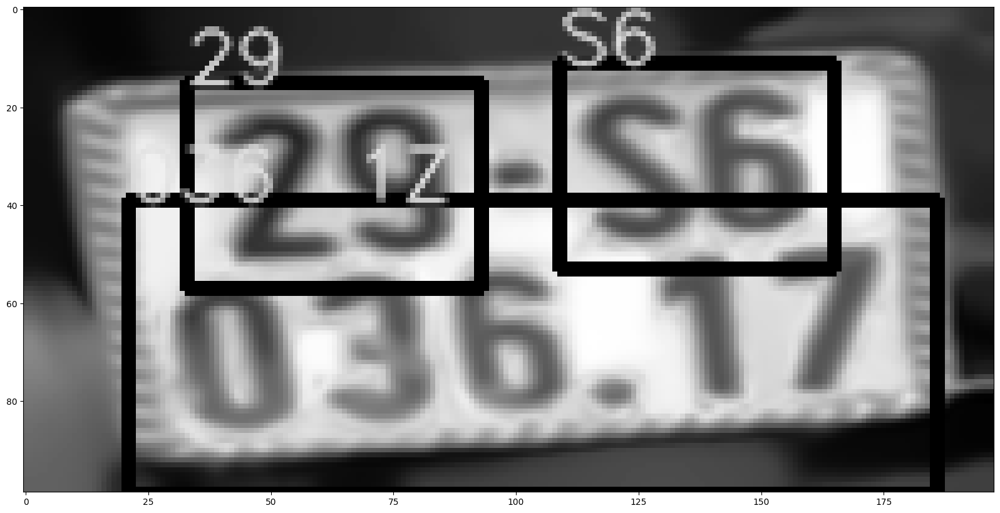

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-EZ 627.23
Character Error Rate: 0.08
Accuracy: 0.92


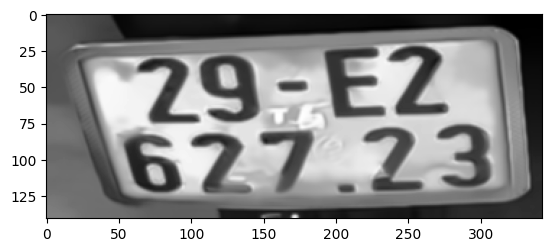

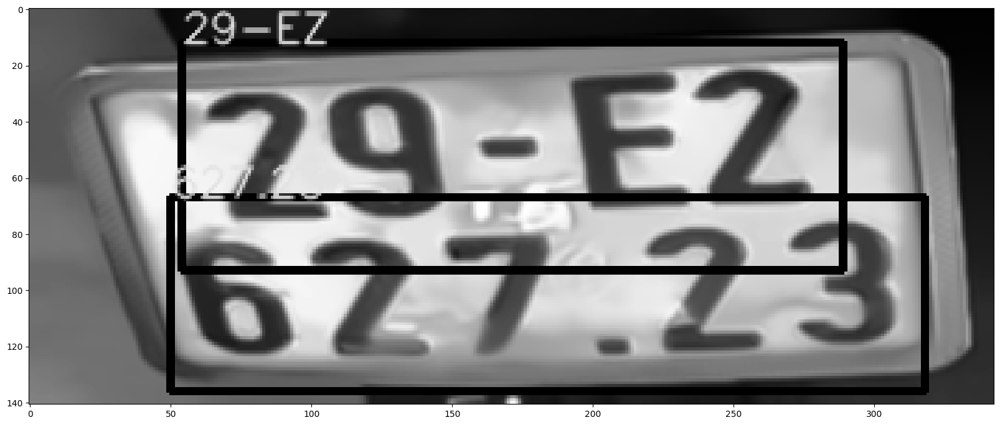

Using CPU. Note: This module is much faster with a GPU.


License plate number: 34-BL 387,04


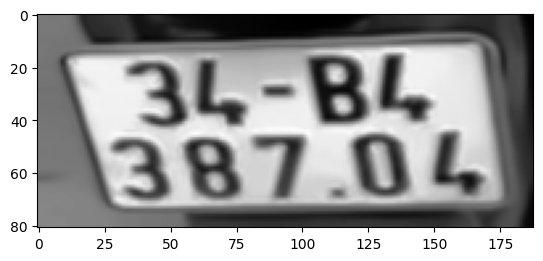

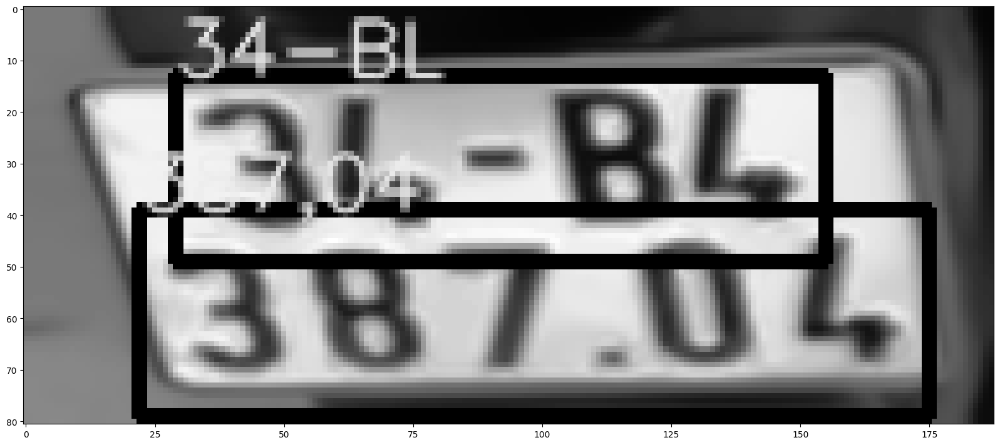

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0K 04.69
Character Error Rate: 0.20
Accuracy: 0.80


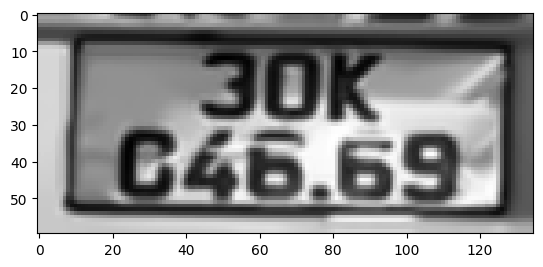

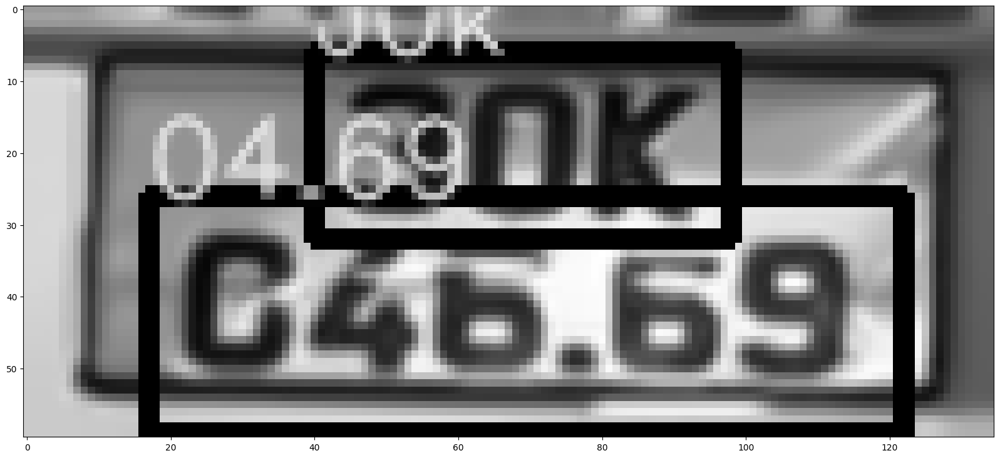

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0H 692.30


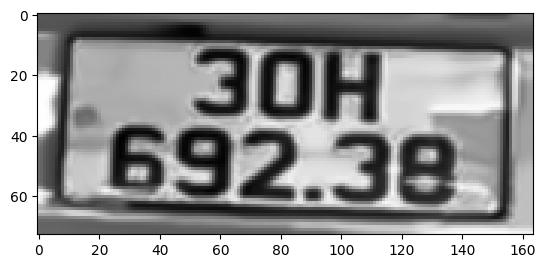

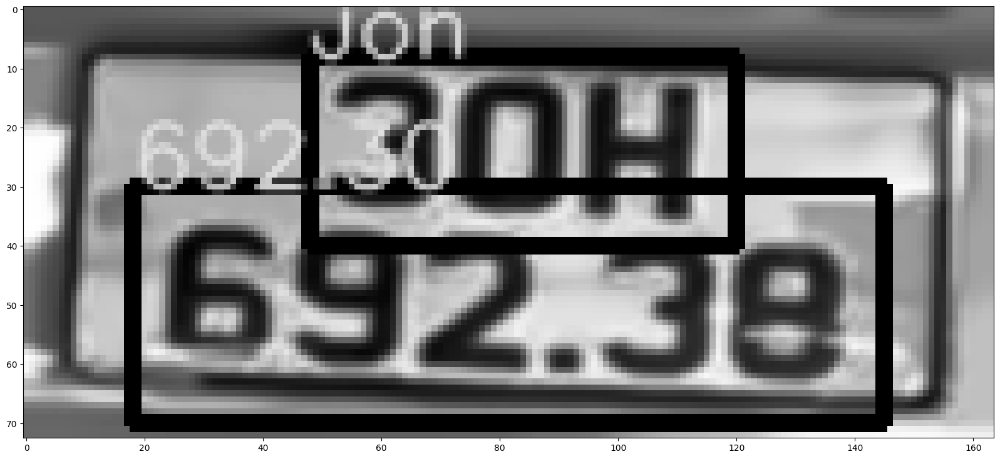

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0E-465.222
Character Error Rate: 0.30
Accuracy: 0.70


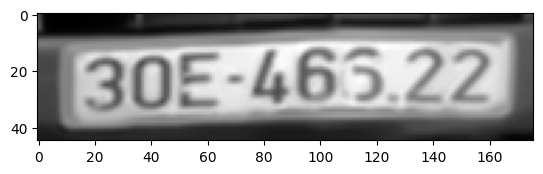

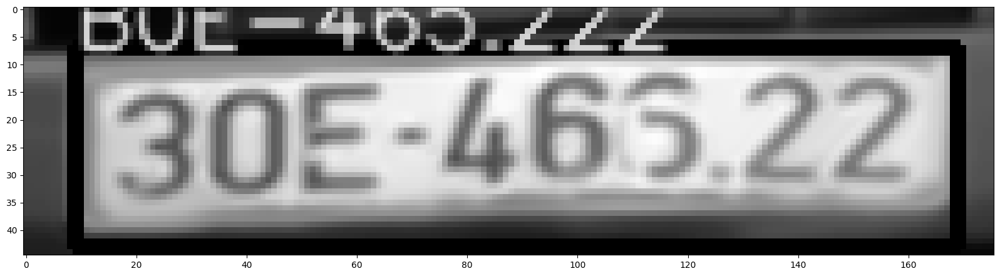

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 505.41
Character Error Rate: 0.10
Accuracy: 0.90


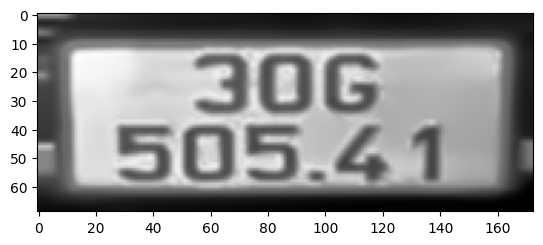

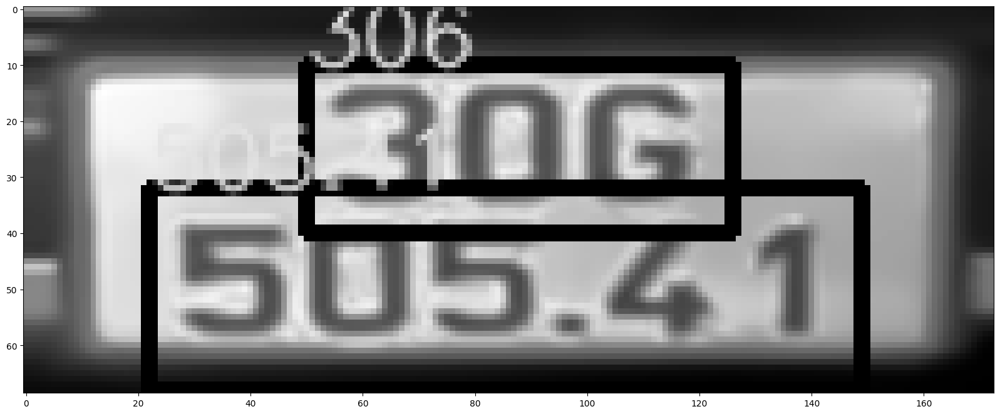

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-AB 027 70
Character Error Rate: 0.08
Accuracy: 0.92


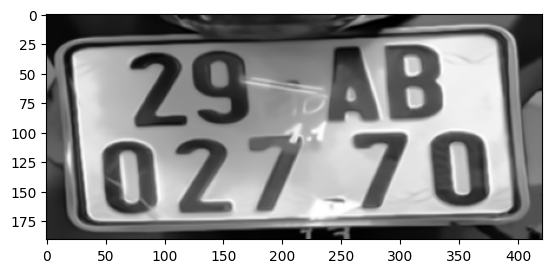

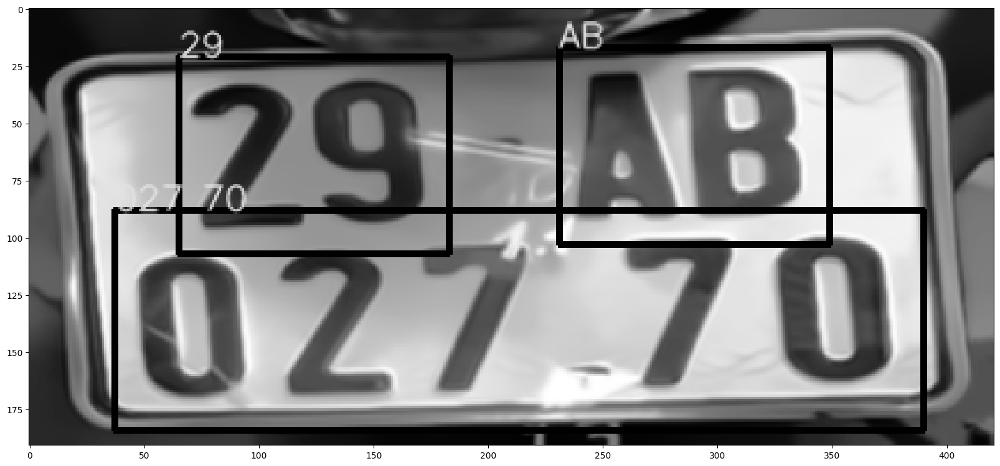

Using CPU. Note: This module is much faster with a GPU.


License plate number: 14-21 314.24


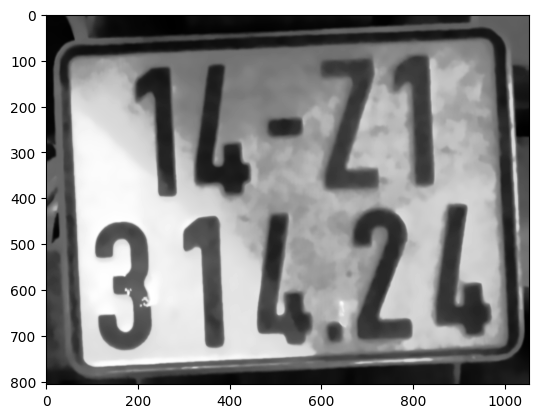

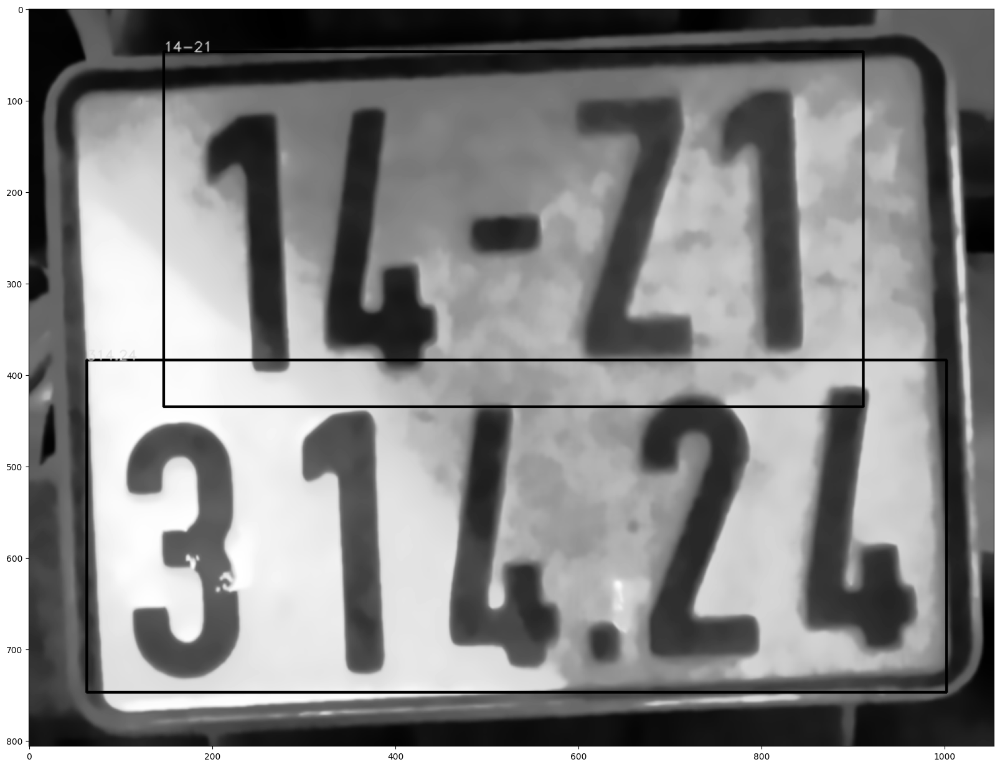

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0.478.75
Character Error Rate: 0.30
Accuracy: 0.70


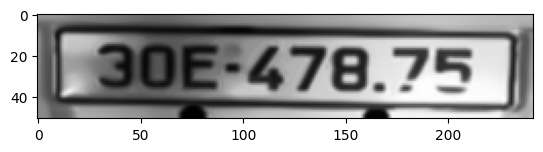

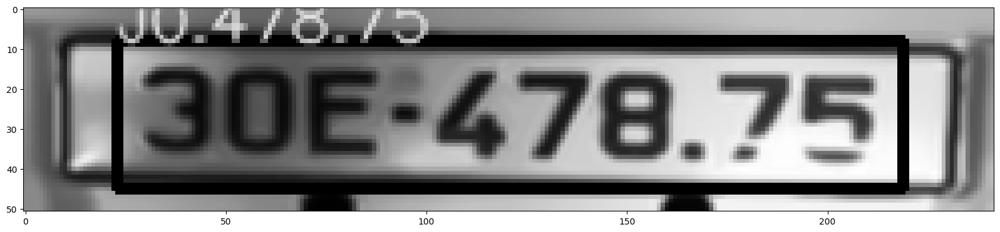

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F-057.38


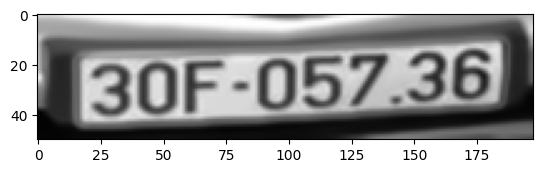

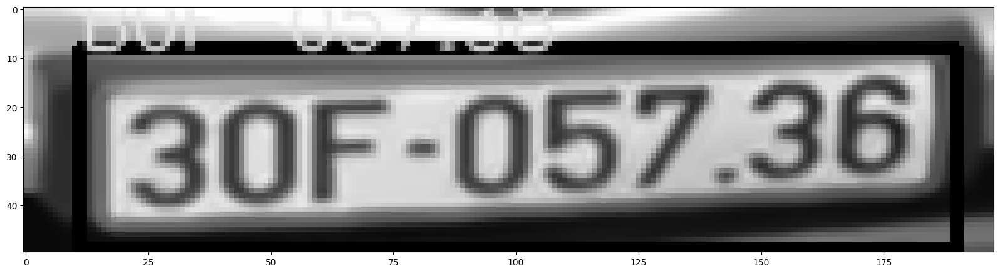

Using CPU. Note: This module is much faster with a GPU.


License plate number: Z0K-006.06


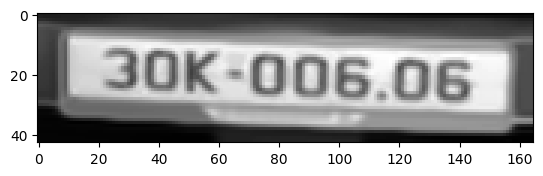

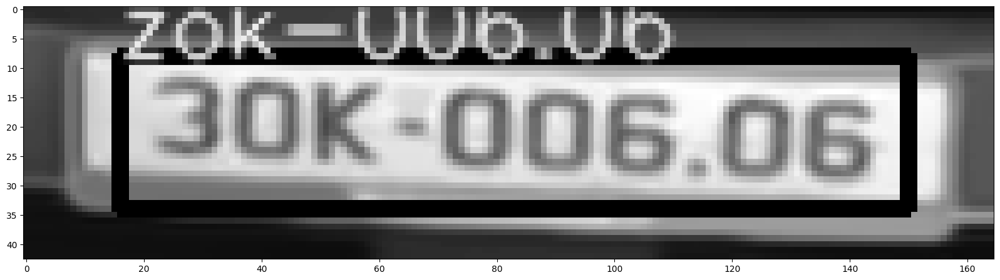

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-S6 036.1Z


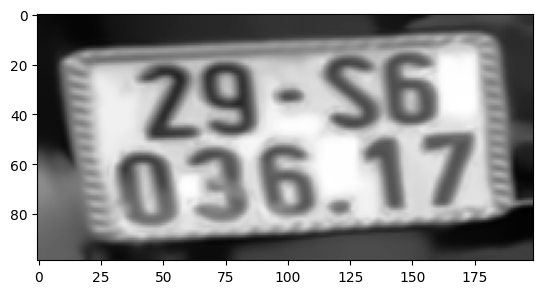

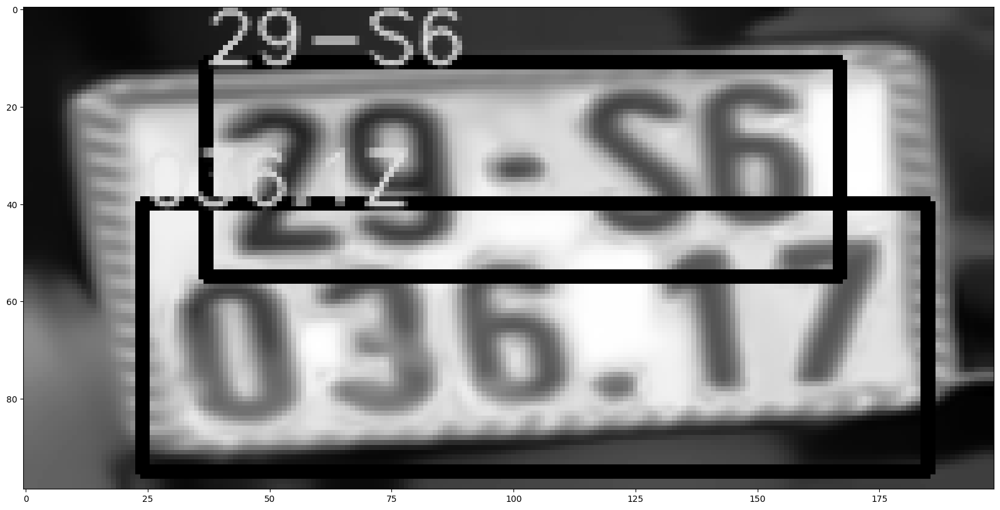

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0E.465.22


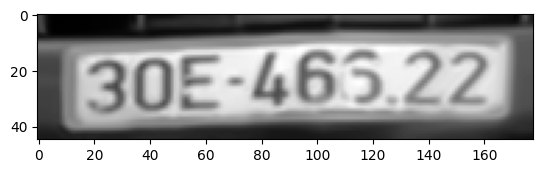

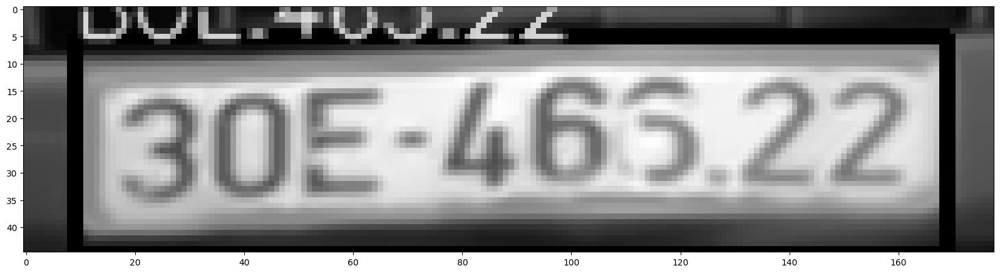

Using CPU. Note: This module is much faster with a GPU.


License plate number: 14-21 314.24


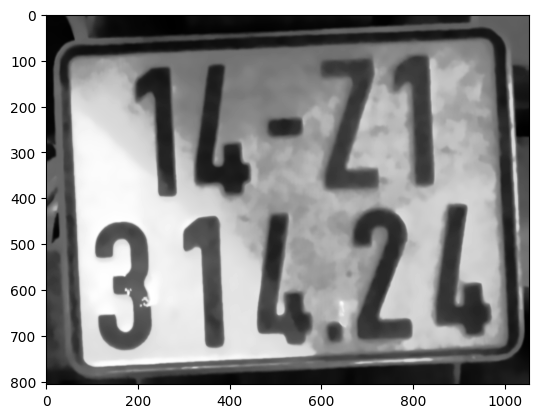

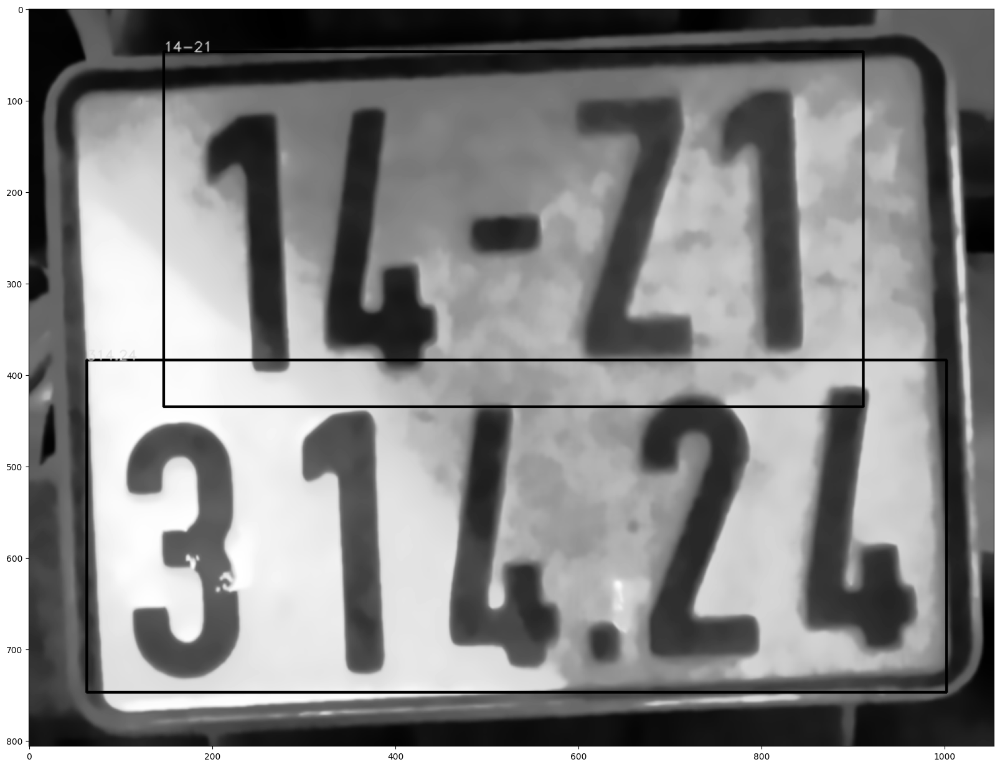

Using CPU. Note: This module is much faster with a GPU.


License plate number: 304 475.05


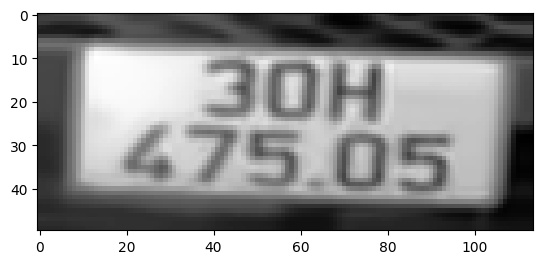

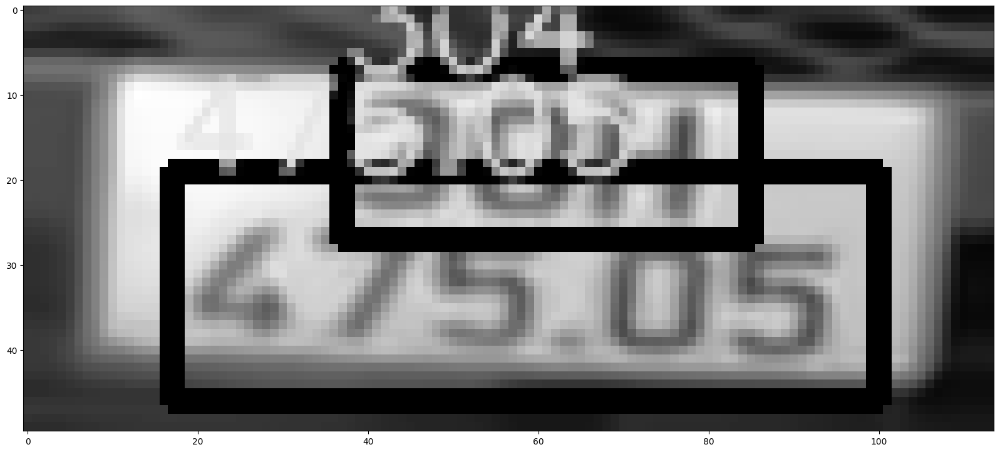

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0K 48B.16
Character Error Rate: 0.20
Accuracy: 0.80


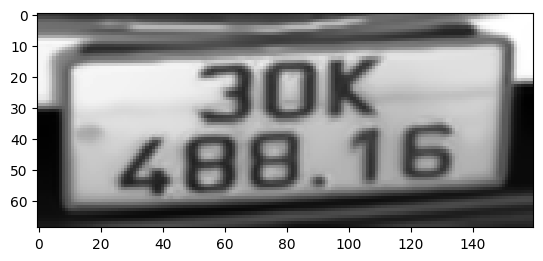

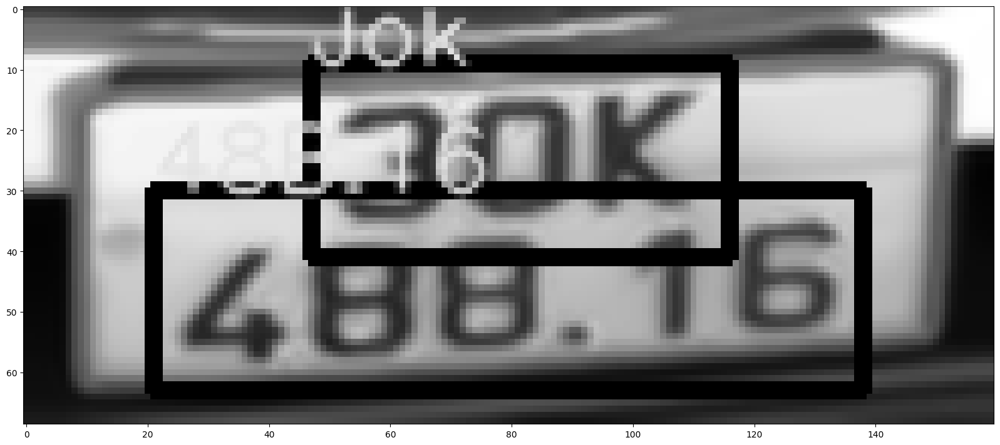

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30H.301.46


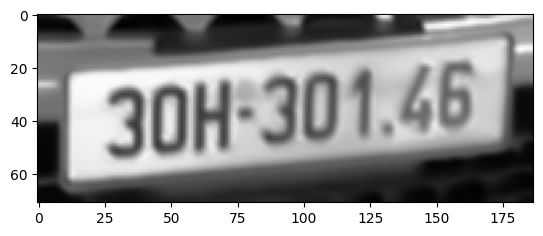

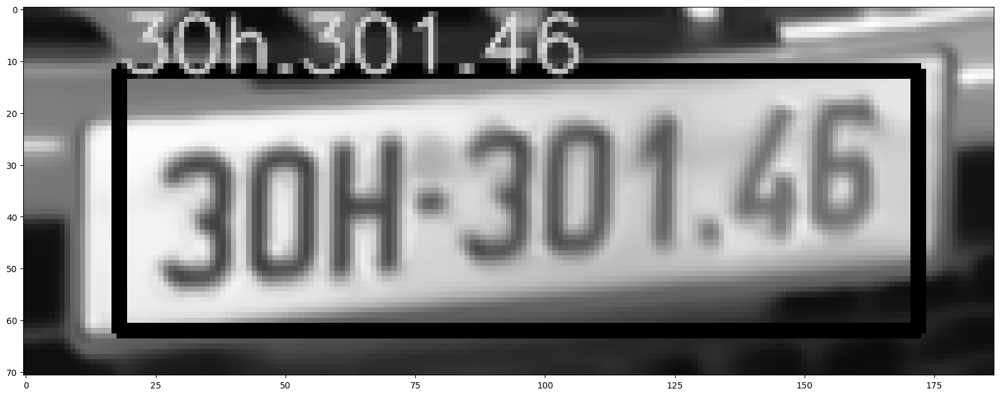

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0.478.75


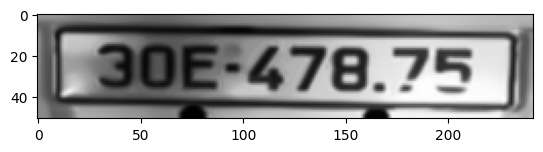

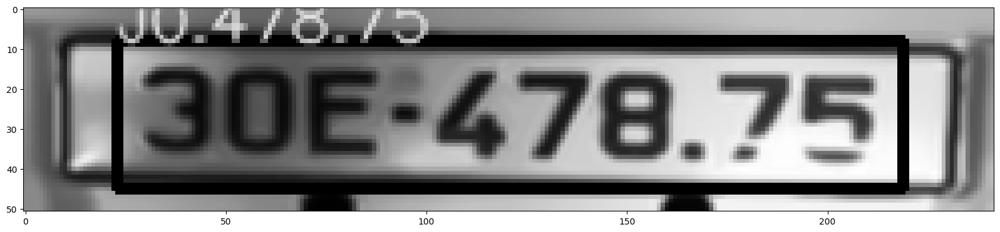

Using CPU. Note: This module is much faster with a GPU.


License plate number: (305.84 29-81


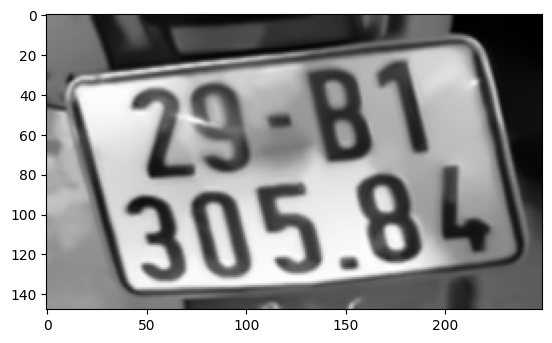

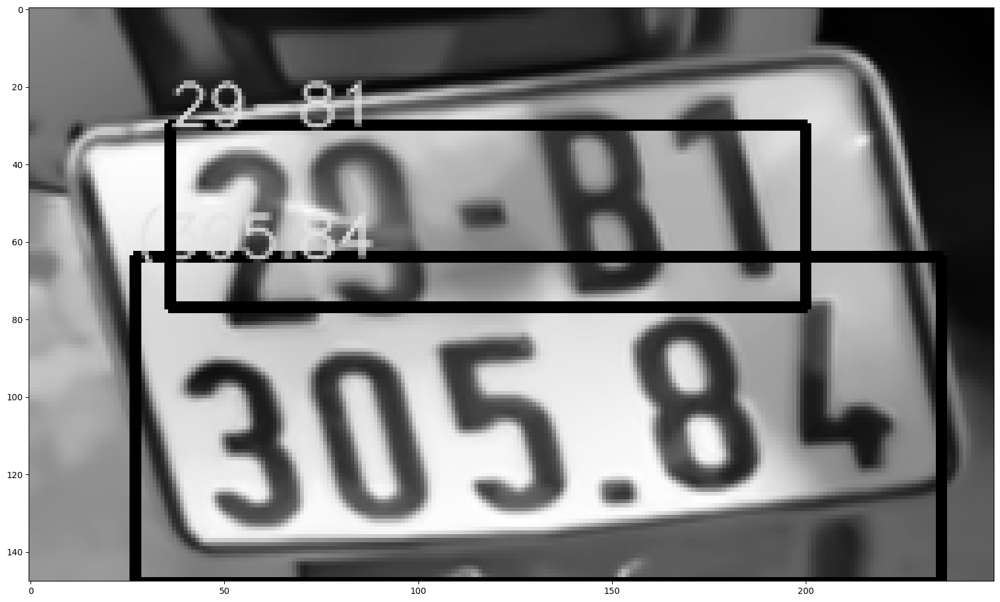

Using CPU. Note: This module is much faster with a GPU.


License plate number: 88A20235


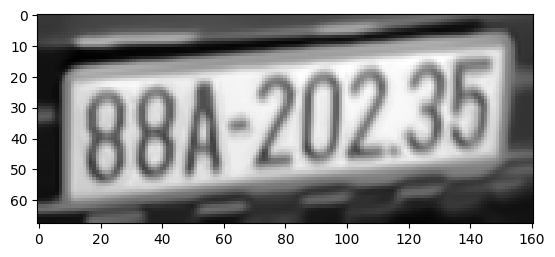

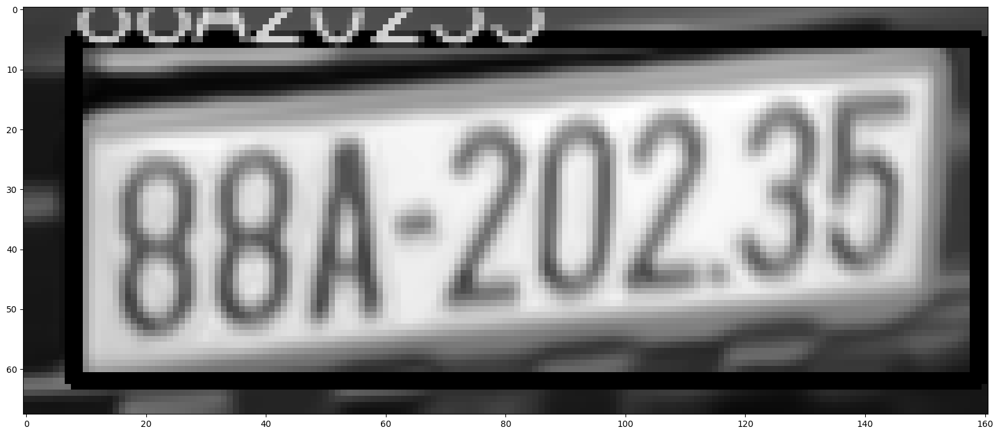

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-AB 020 01


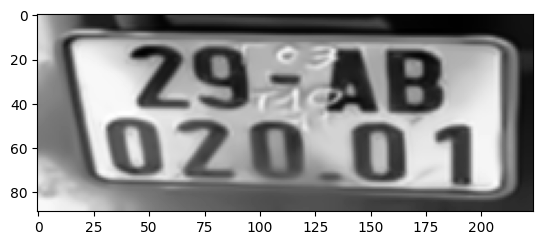

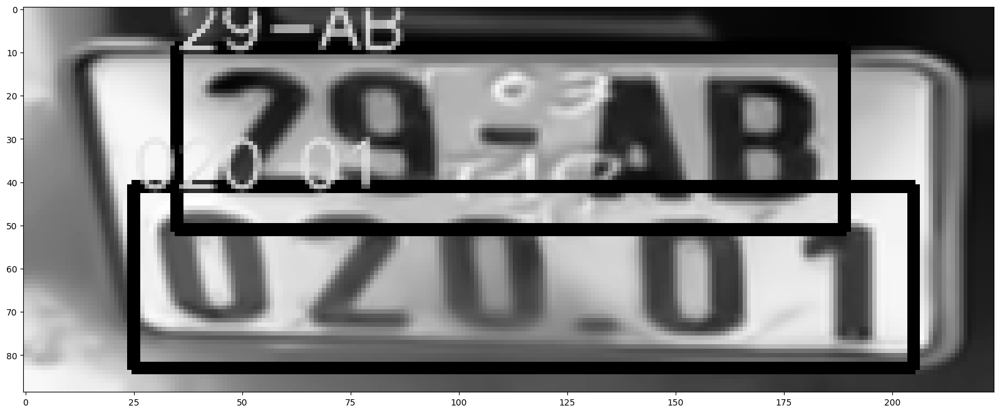

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30G-665.22
Character Error Rate: 0.00
Accuracy: 1.00


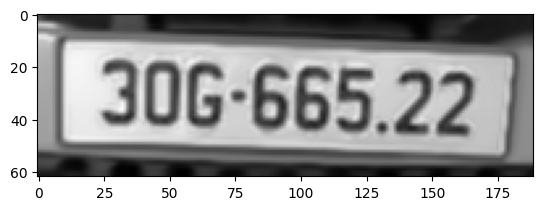

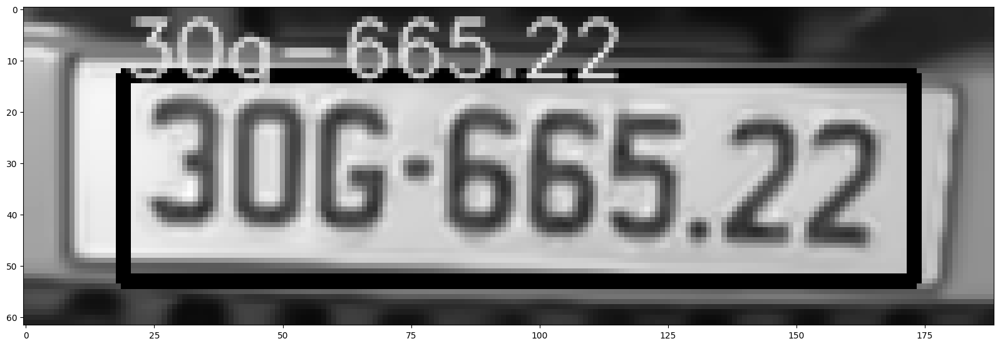

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 12936


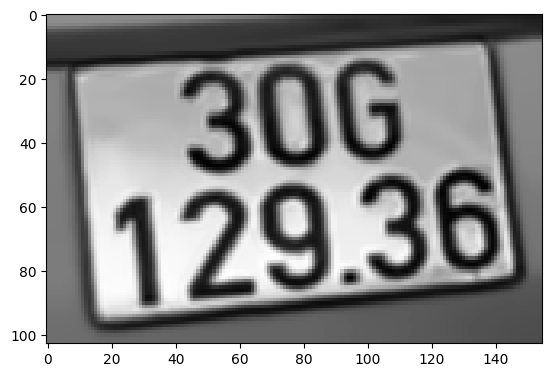

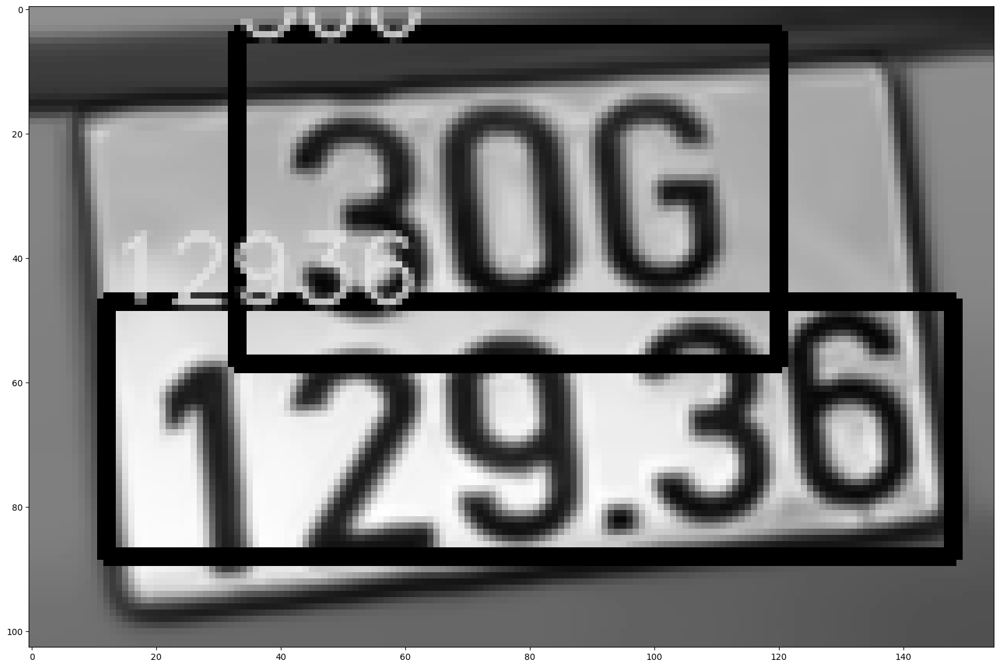

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-L5_ 382,57
Character Error Rate: 0.17
Accuracy: 0.83


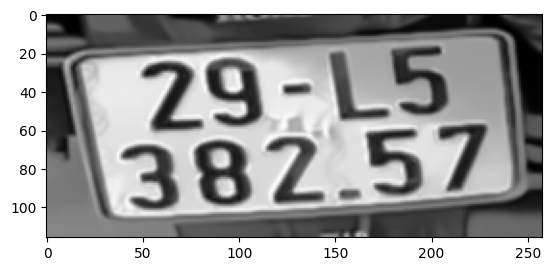

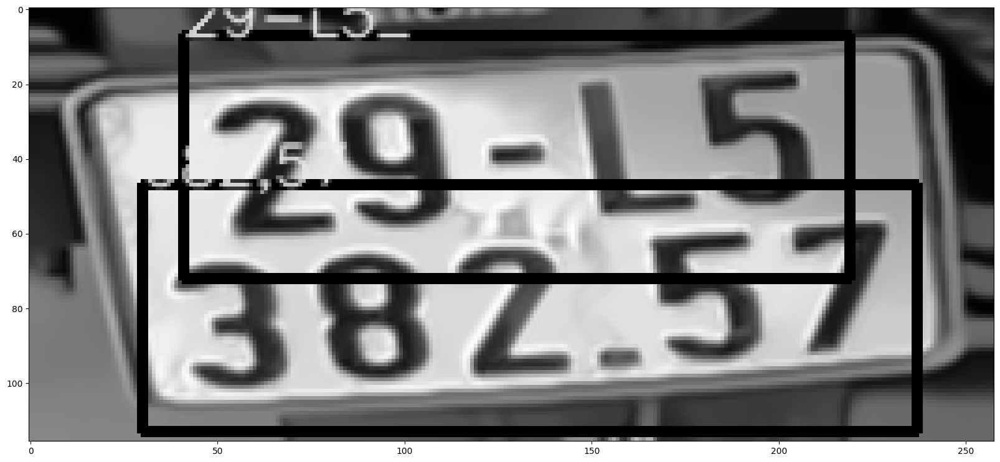

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-L5_ 382.57


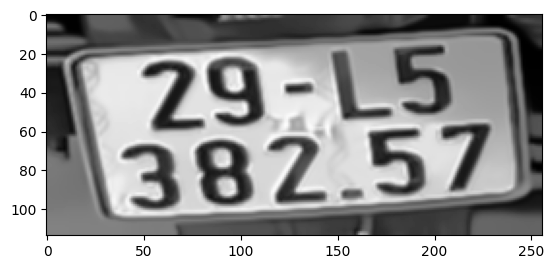

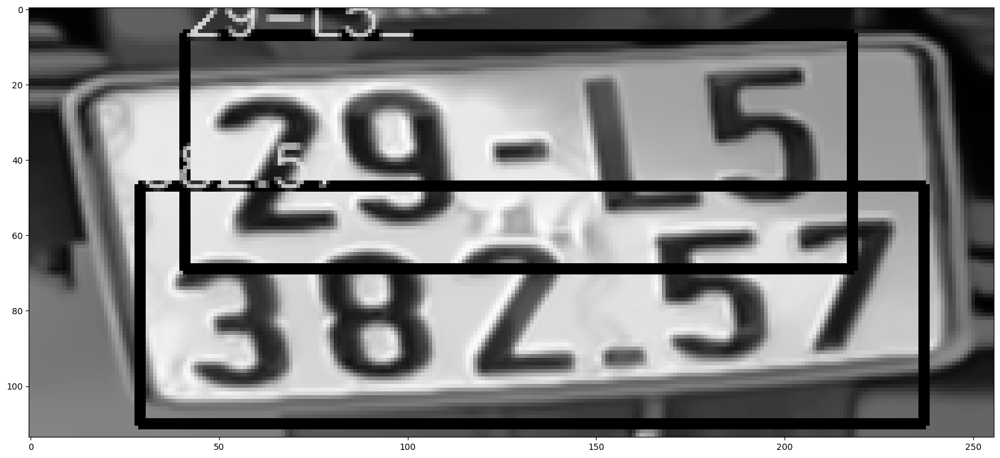

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F-369.35]


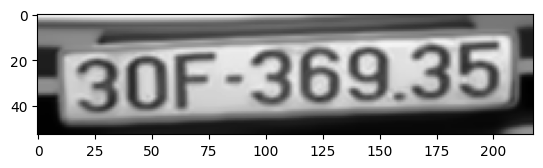

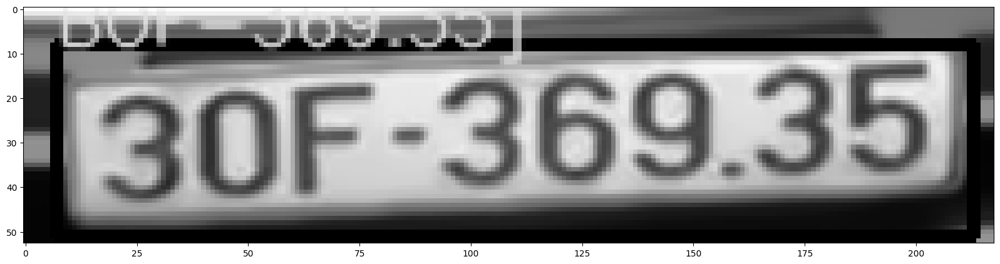

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30K.20922
Character Error Rate: 0.20
Accuracy: 0.80


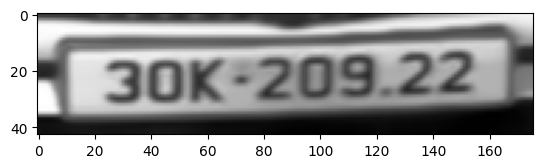

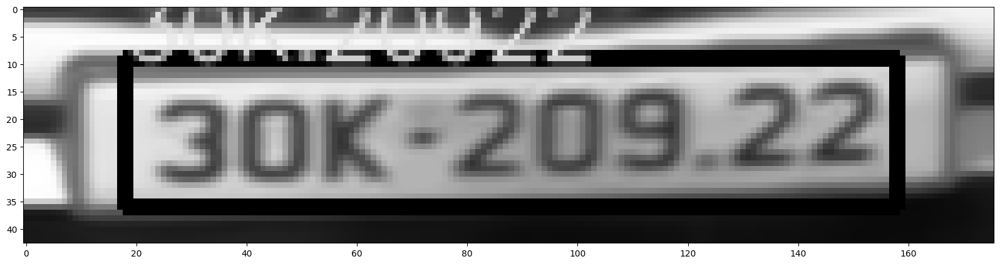

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0A 981.30
Character Error Rate: 0.20
Accuracy: 0.80


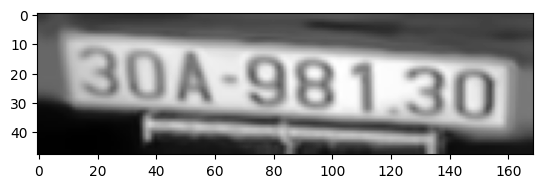

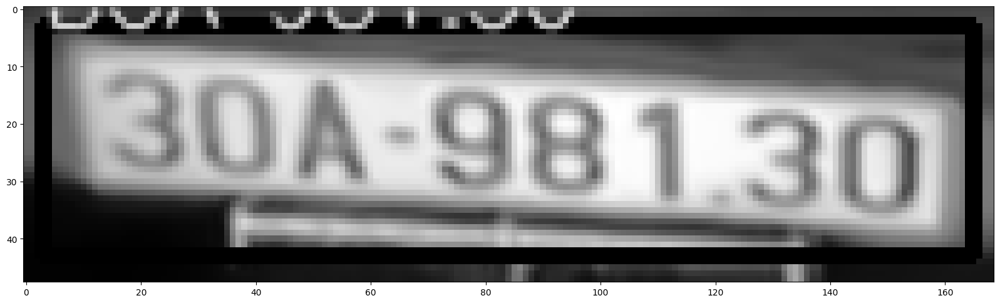

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30K.20922


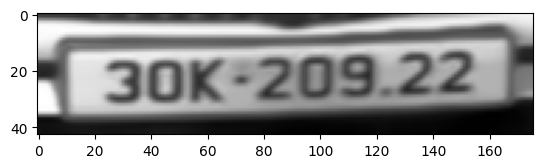

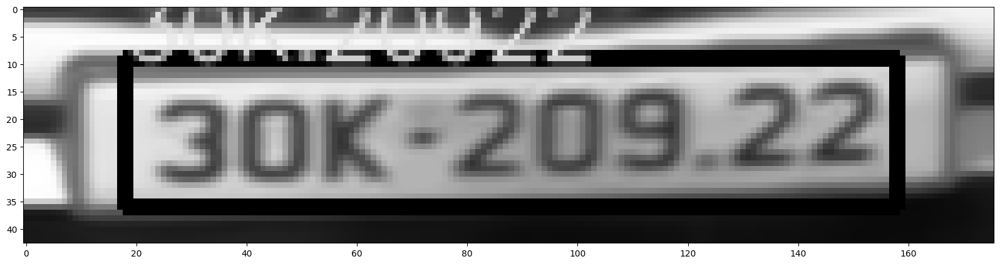

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F-057.36]
Character Error Rate: 0.20
Accuracy: 0.80


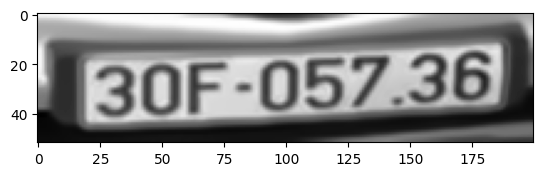

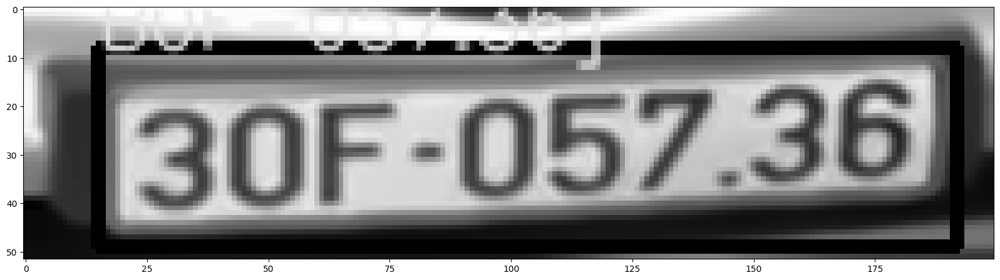

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29178302


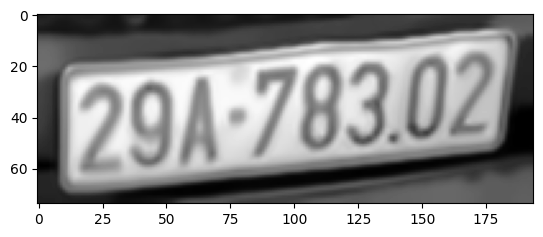

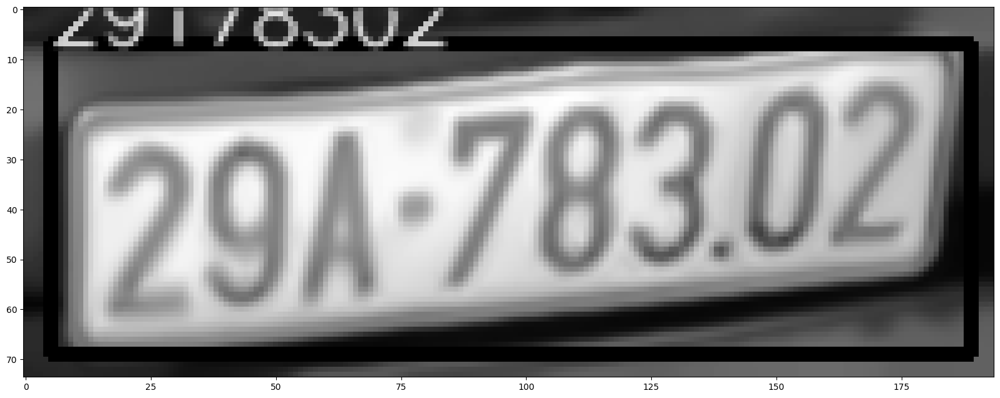

Using CPU. Note: This module is much faster with a GPU.


License plate number: 23-N1 062.42


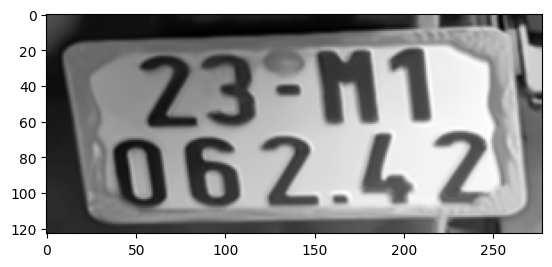

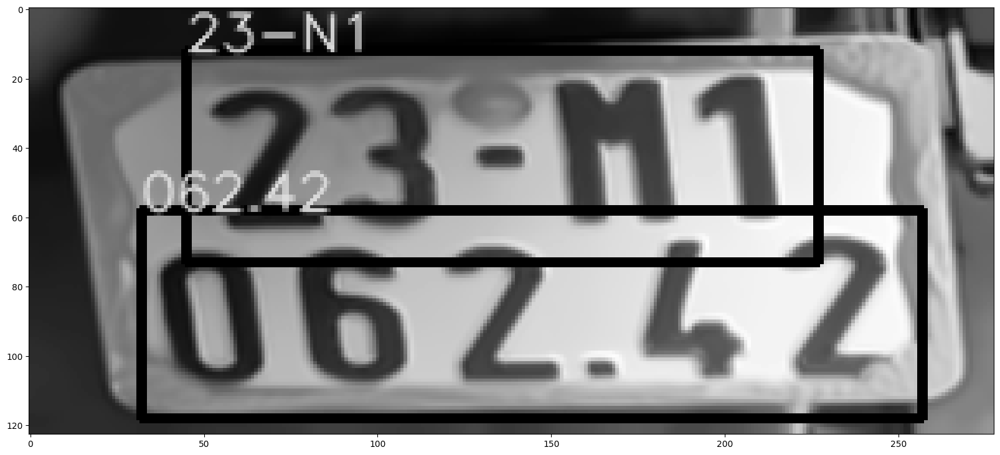

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-L5 61335
Character Error Rate: 0.08
Accuracy: 0.92


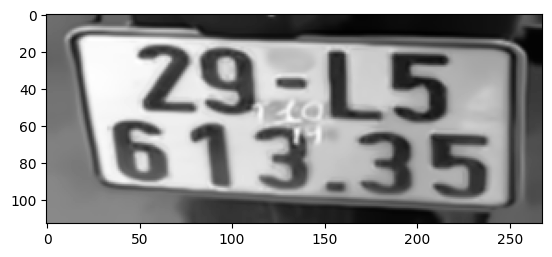

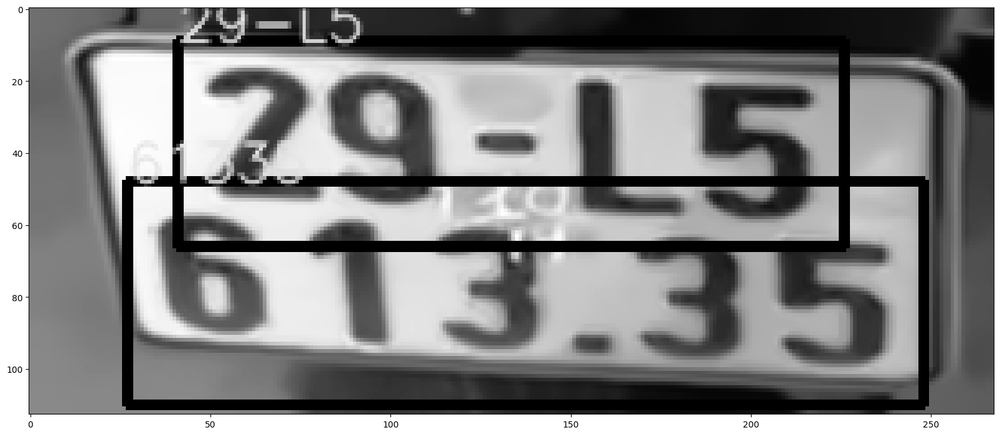

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30F 42856 
Character Error Rate: 0.10
Accuracy: 0.90


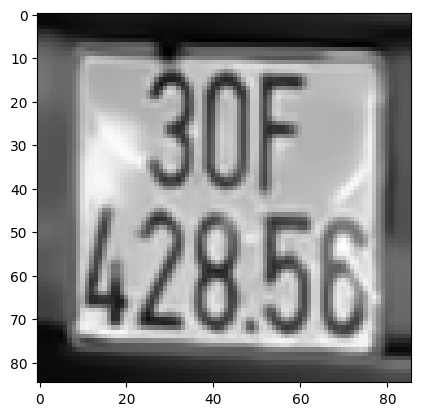

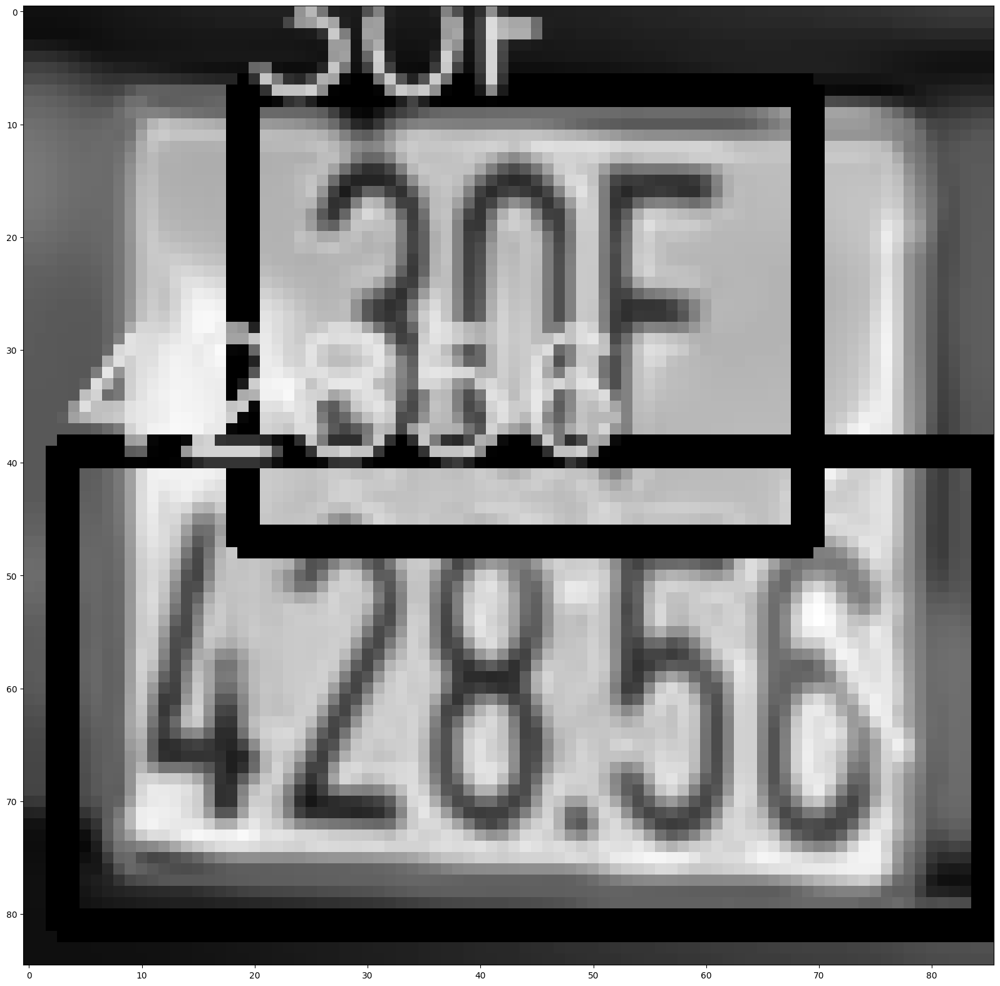

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0H. 301.,46
Character Error Rate: 0.40
Accuracy: 0.60


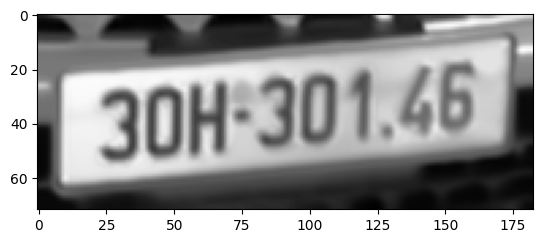

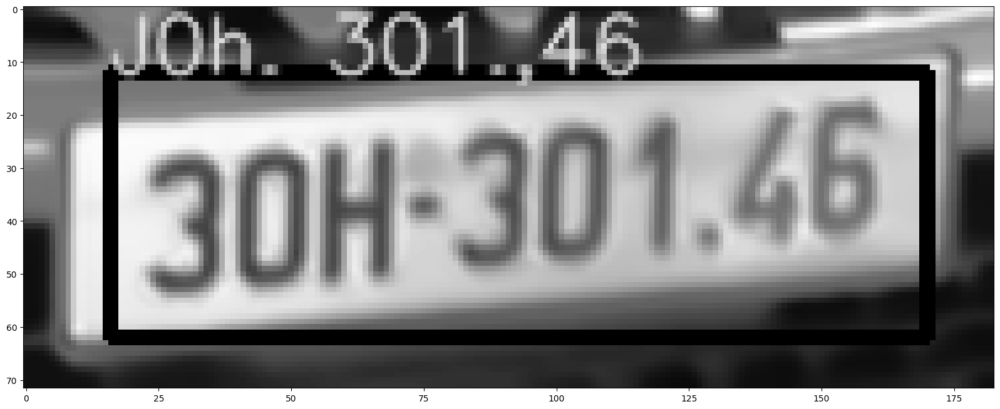

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30-FT 631.59


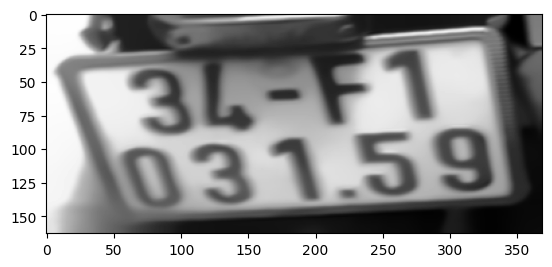

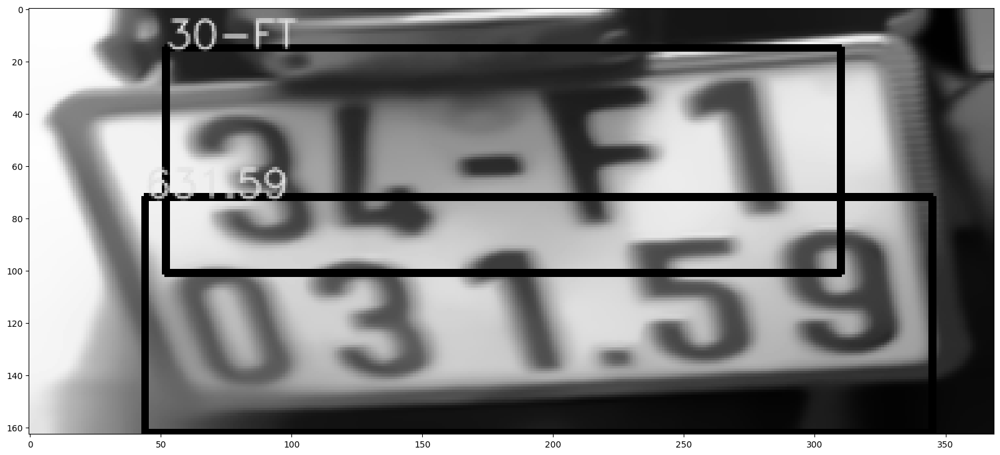

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0A 981 30


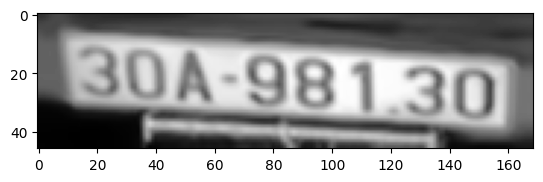

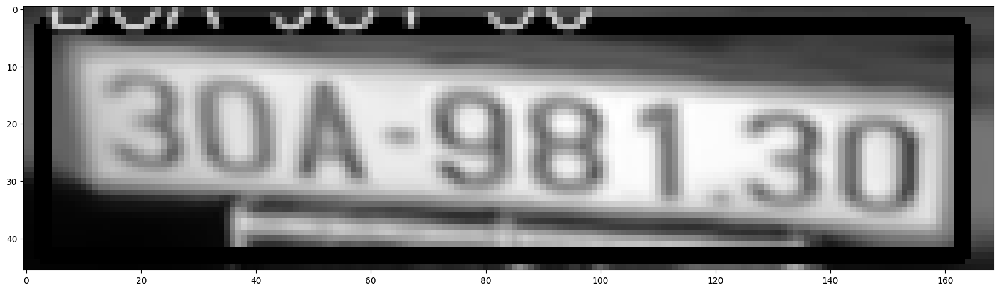

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0K L88.16


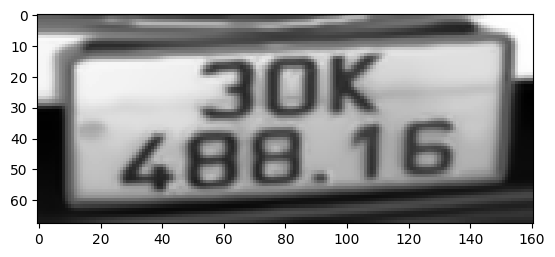

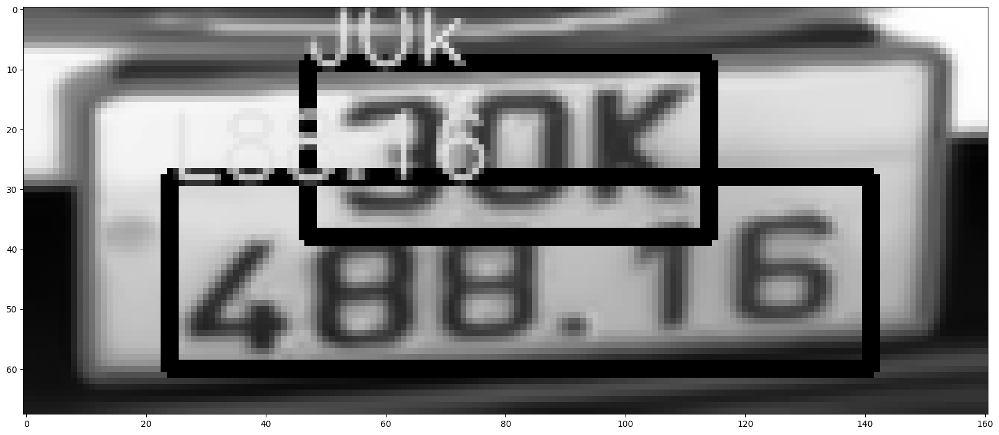

Using CPU. Note: This module is much faster with a GPU.


License plate number: B30F-987.25]


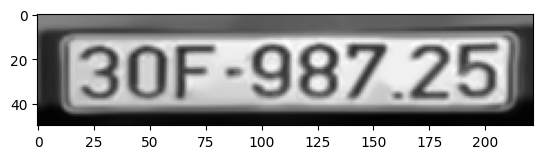

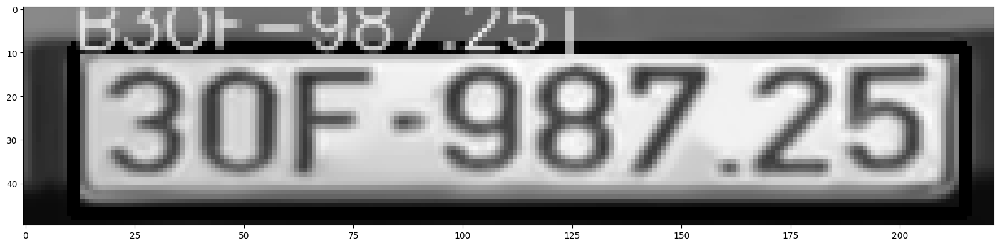

Using CPU. Note: This module is much faster with a GPU.


License plate number: [894-146.26]
Character Error Rate: 0.30
Accuracy: 0.70


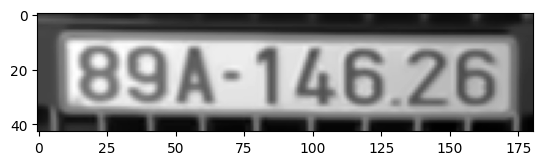

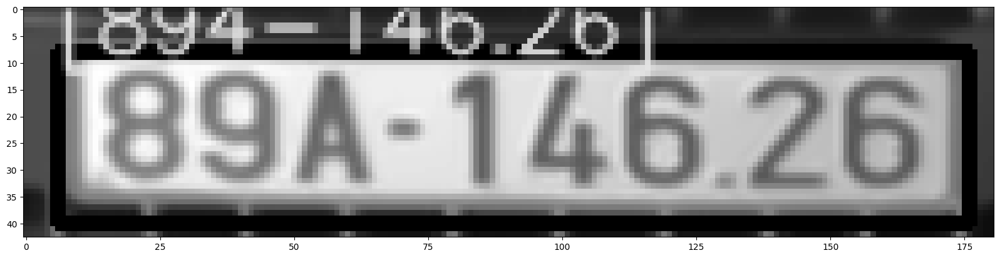

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 125.82
Character Error Rate: 0.10
Accuracy: 0.90


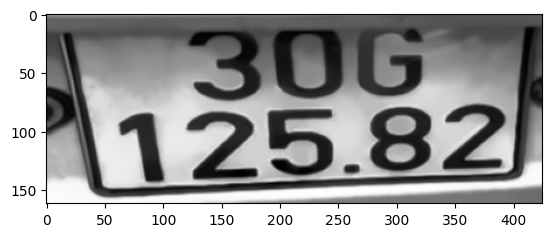

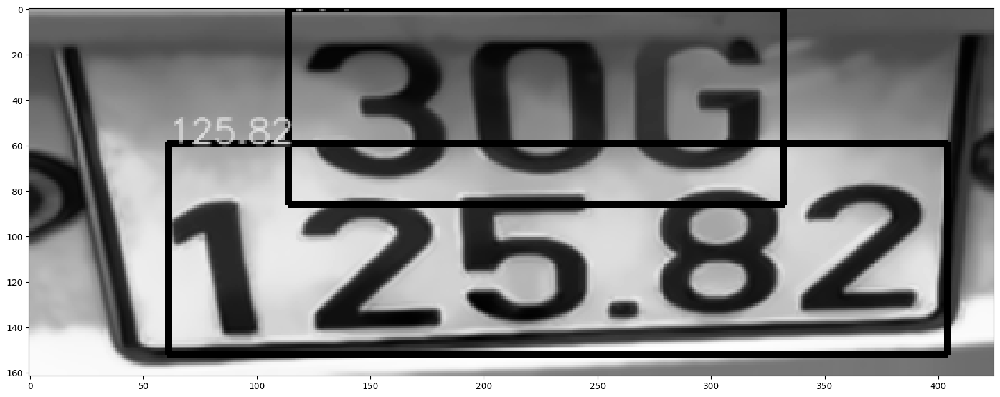

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30A 098.83


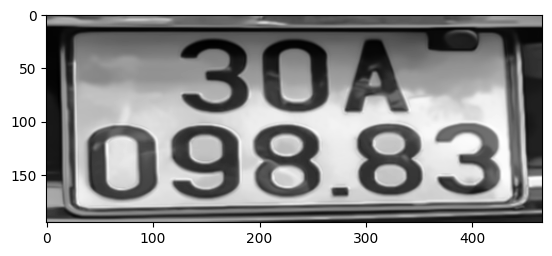

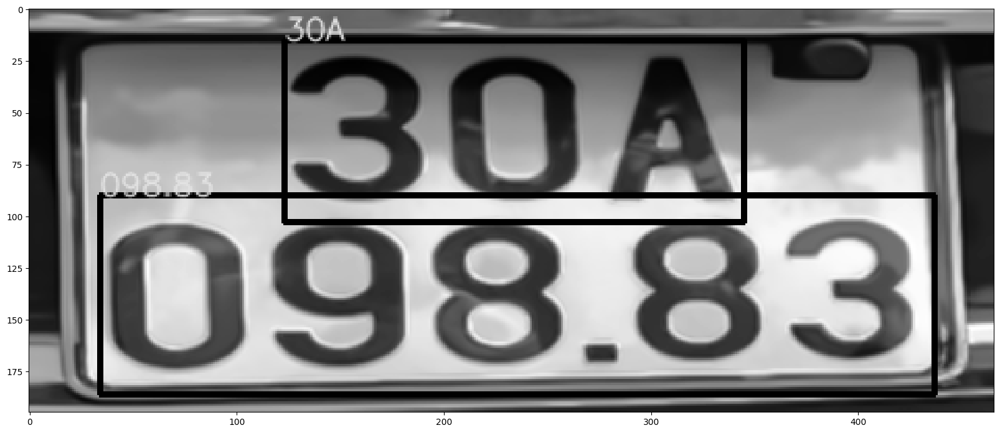

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 24354
Character Error Rate: 0.20
Accuracy: 0.80


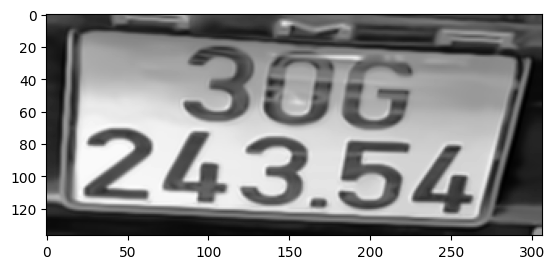

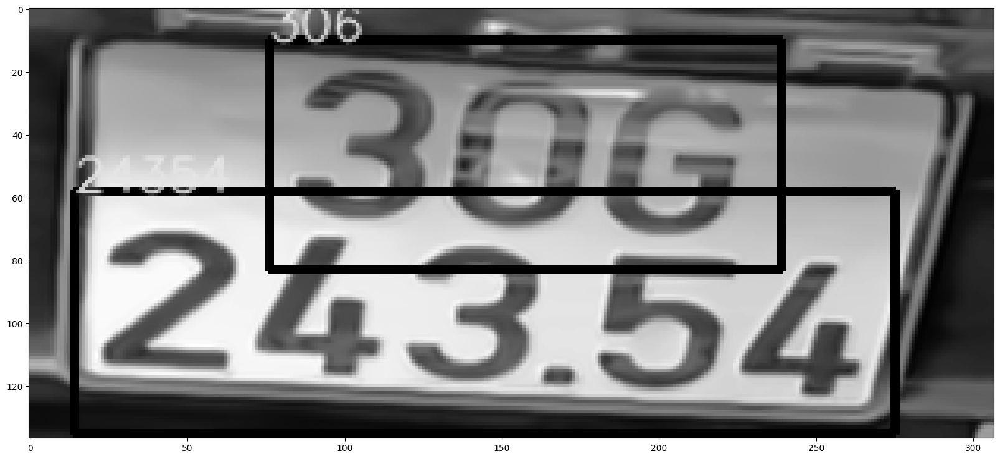

Using CPU. Note: This module is much faster with a GPU.


License plate number: 3UA 52385


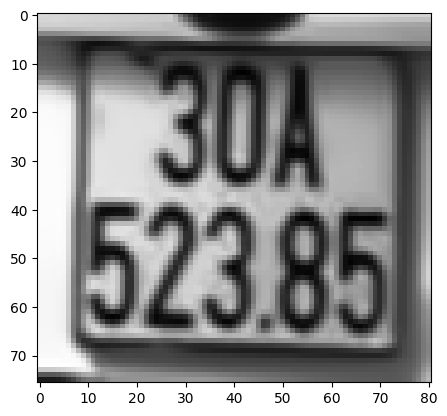

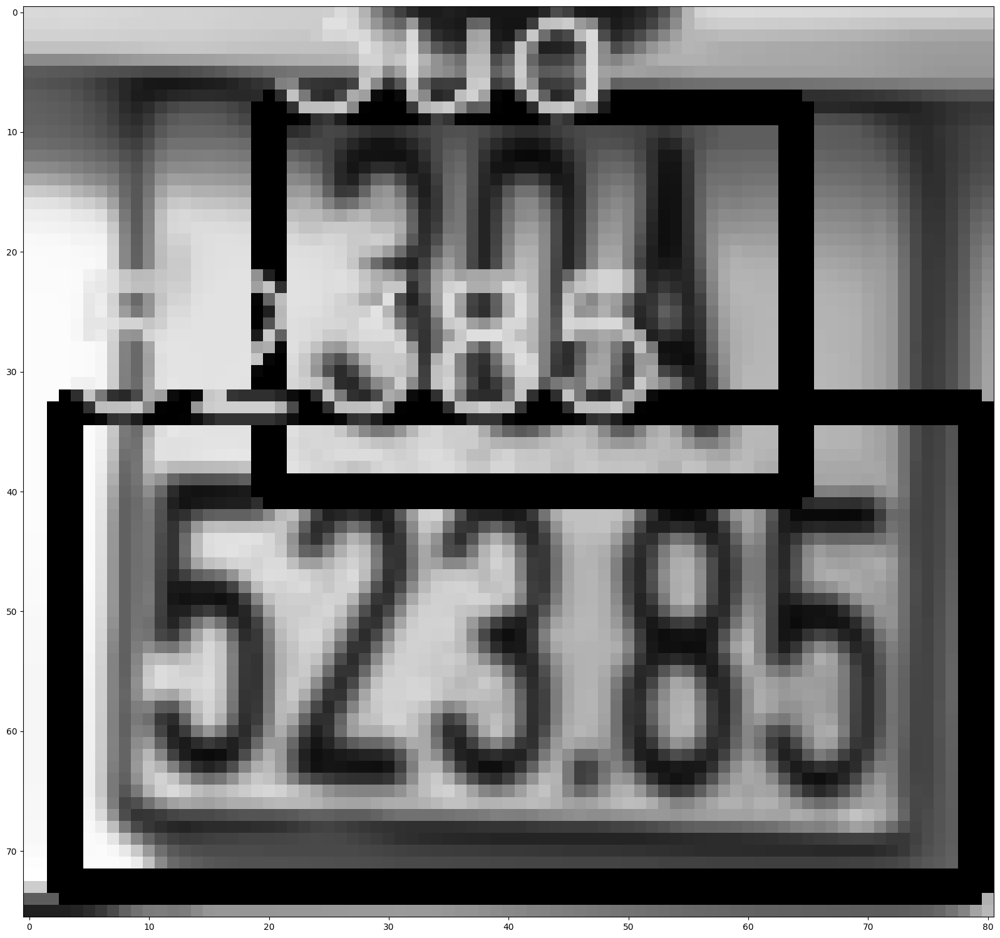

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0H-791.774
Character Error Rate: 0.20
Accuracy: 0.80


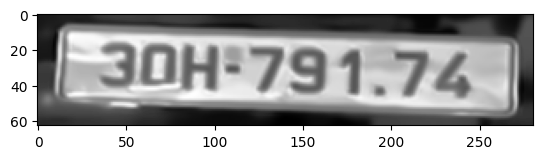

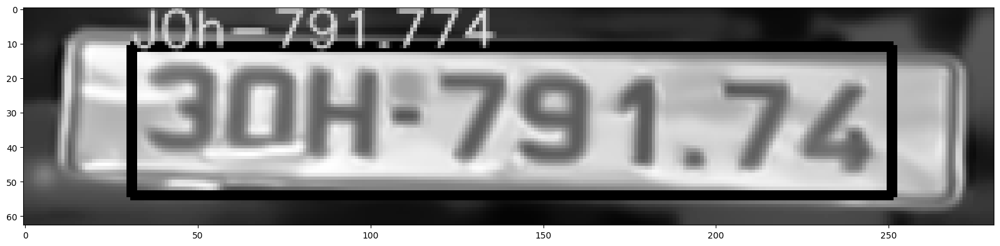

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-EZ 673.90
Character Error Rate: 0.08
Accuracy: 0.92


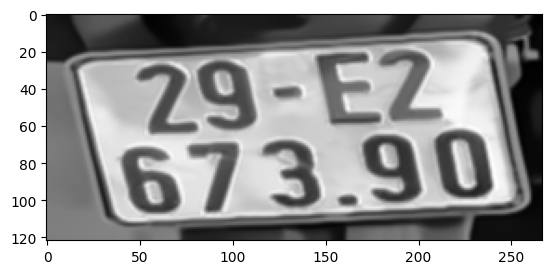

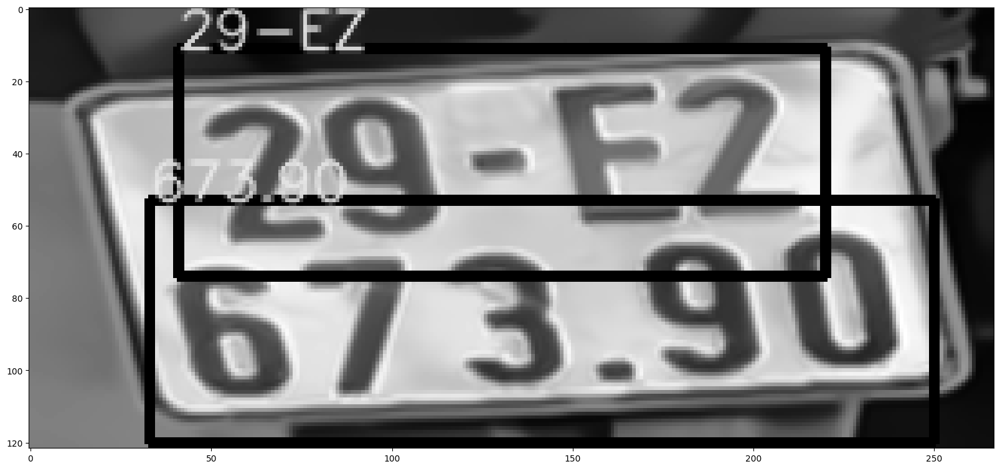

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30A 098.83
Character Error Rate: 0.00
Accuracy: 1.00


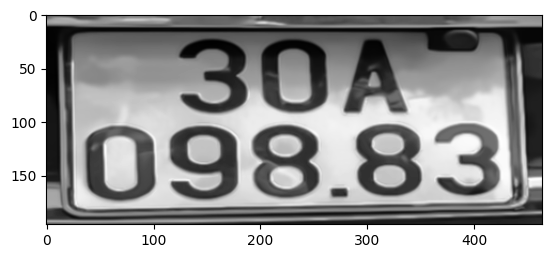

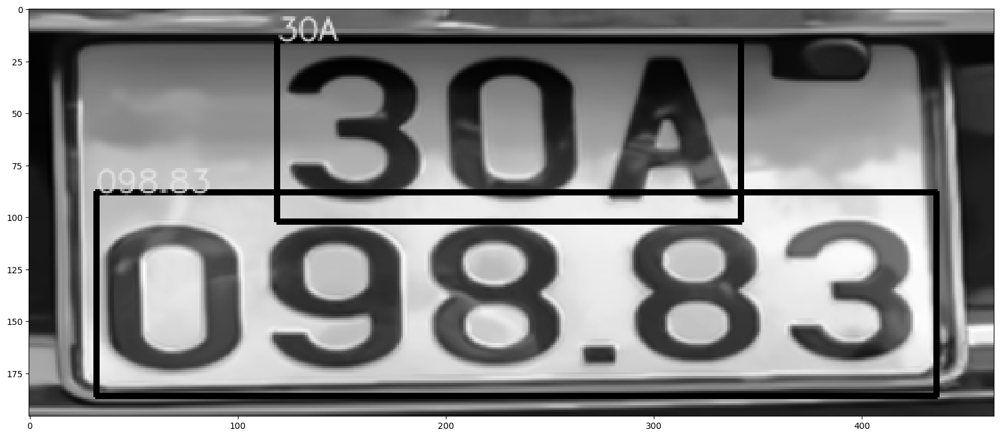

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0K 15262
Character Error Rate: 0.20
Accuracy: 0.80


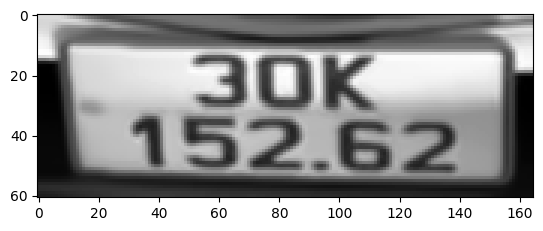

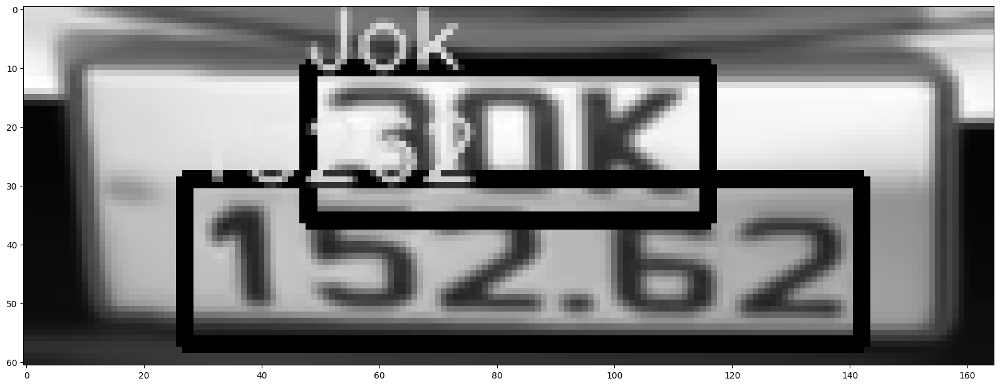

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-L5 61335


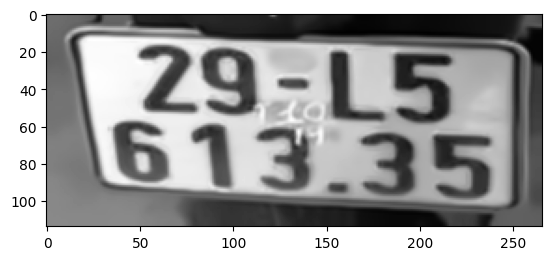

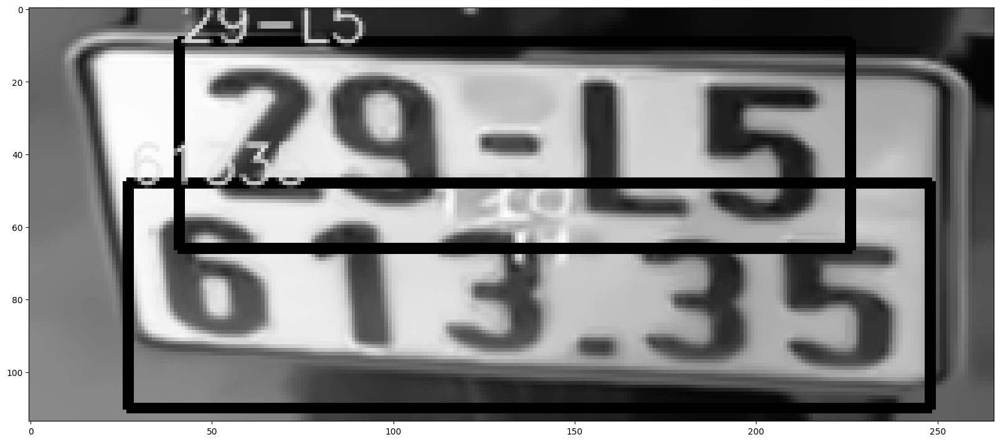

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306-IE 276.71


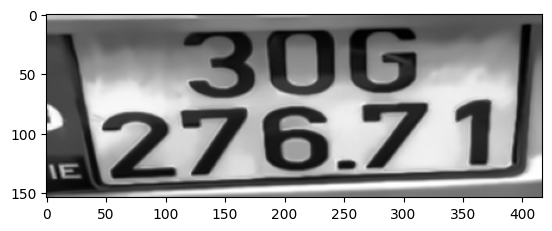

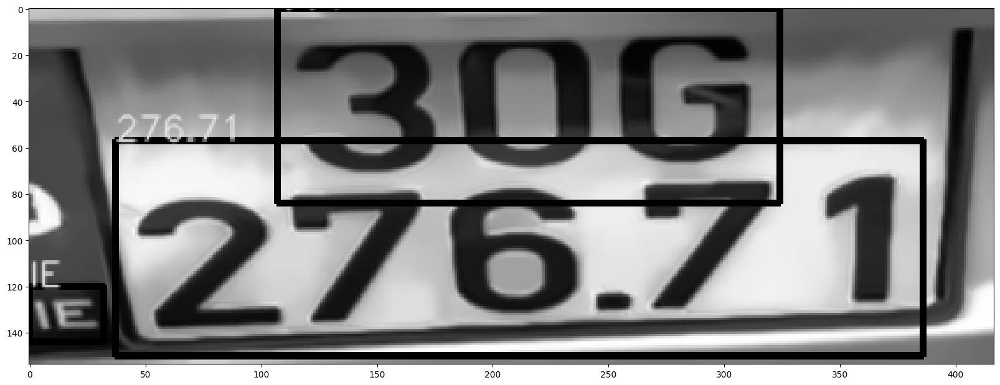

Using CPU. Note: This module is much faster with a GPU.


License plate number: 20439486


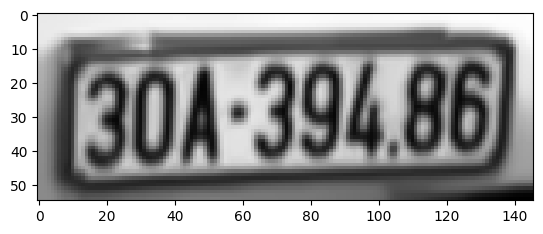

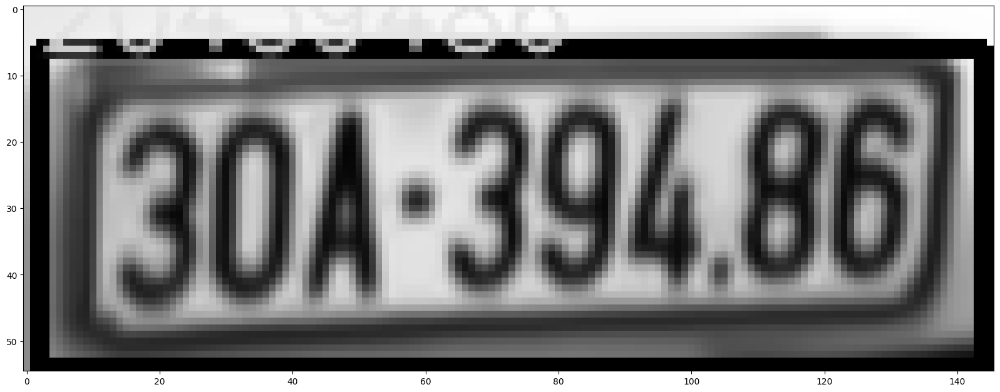

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30F 28118-


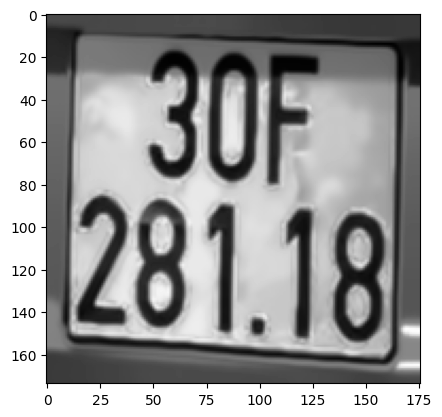

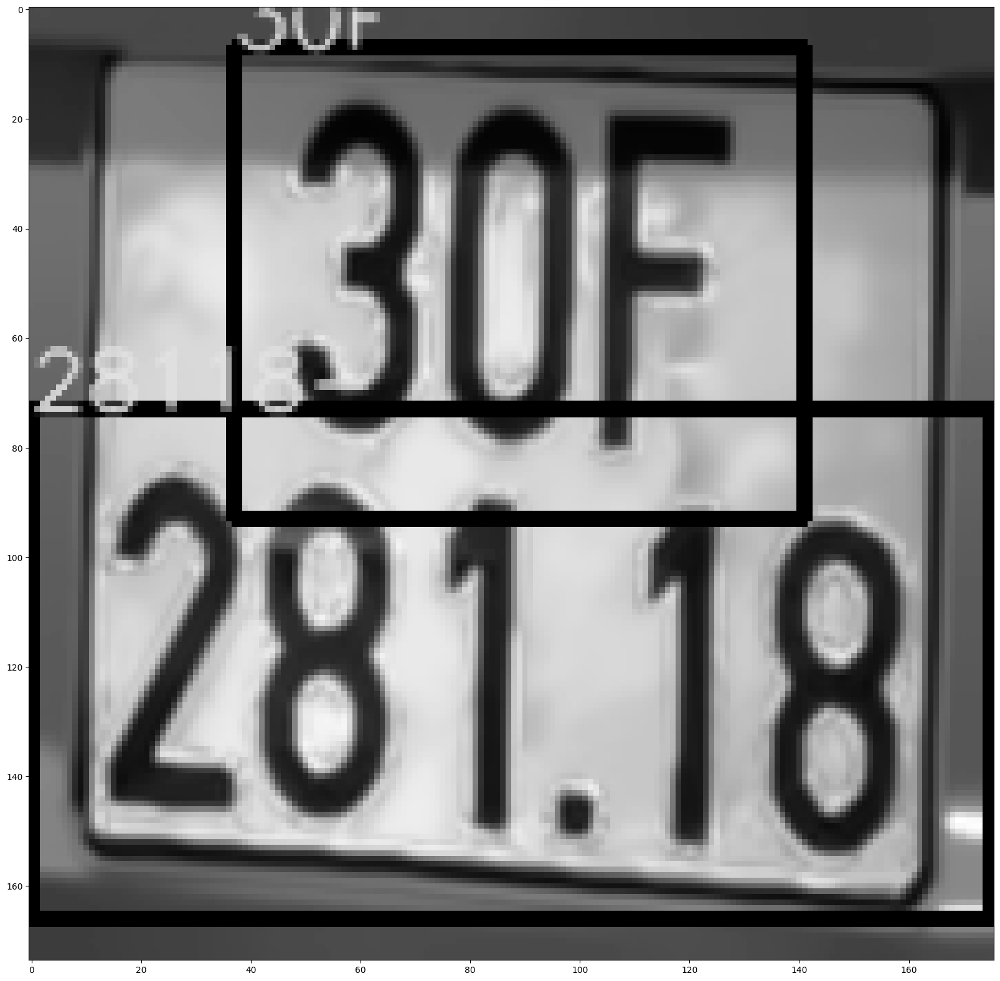

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-BZ 107.74


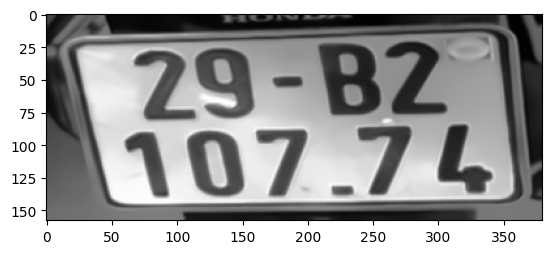

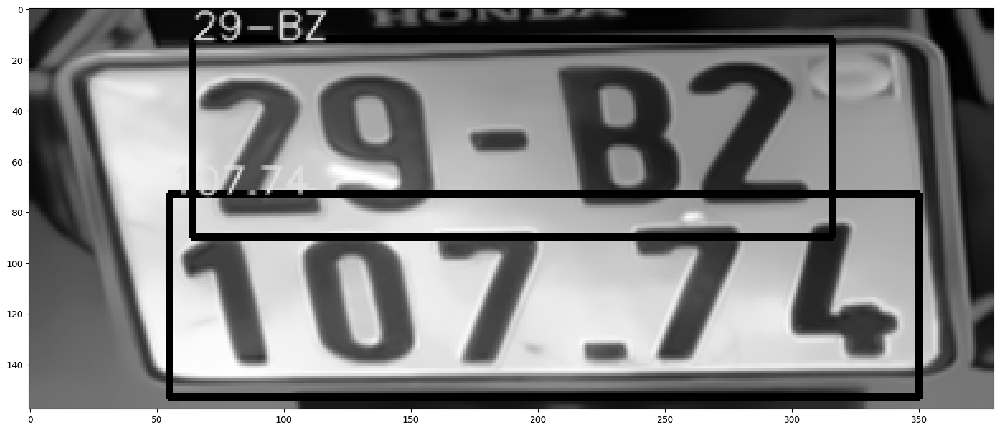

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30H 692.30
Character Error Rate: 0.10
Accuracy: 0.90


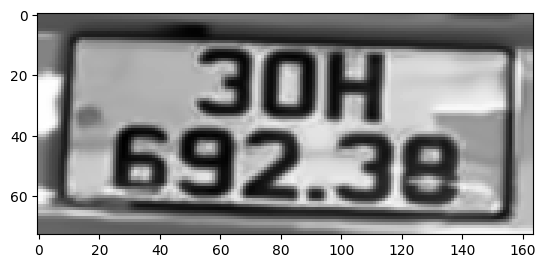

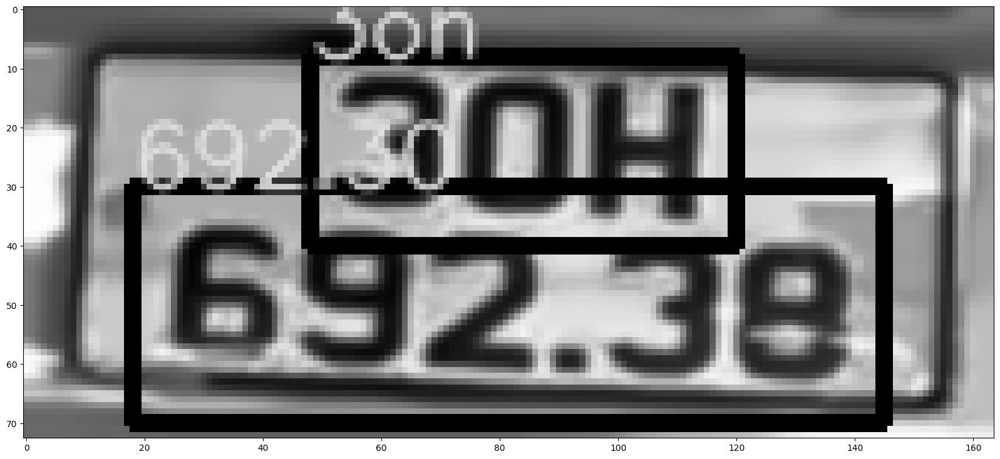

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F:930,02
Character Error Rate: 0.30
Accuracy: 0.70


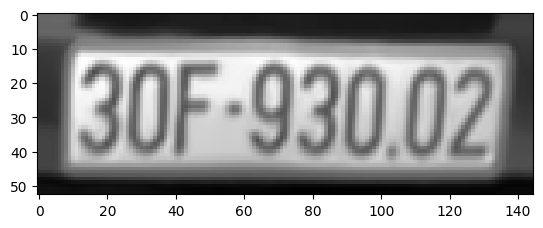

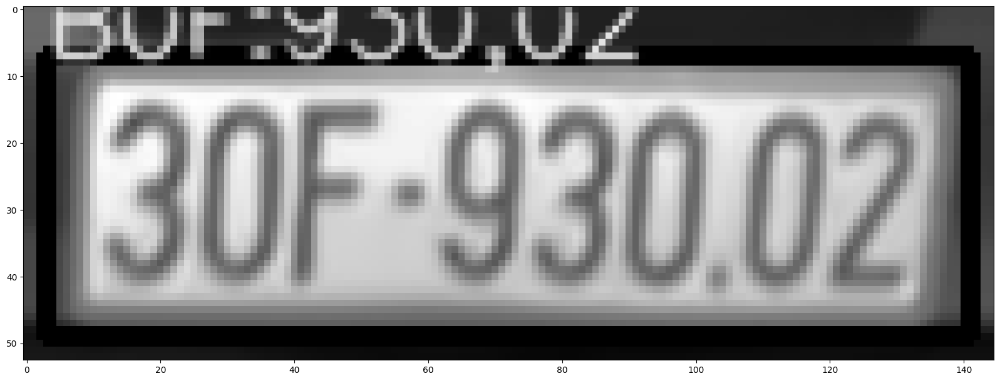

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30A 52385
Character Error Rate: 0.10
Accuracy: 0.90


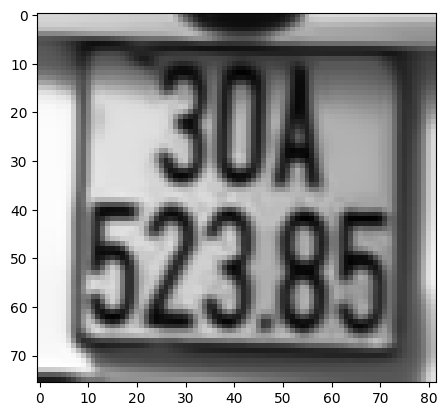

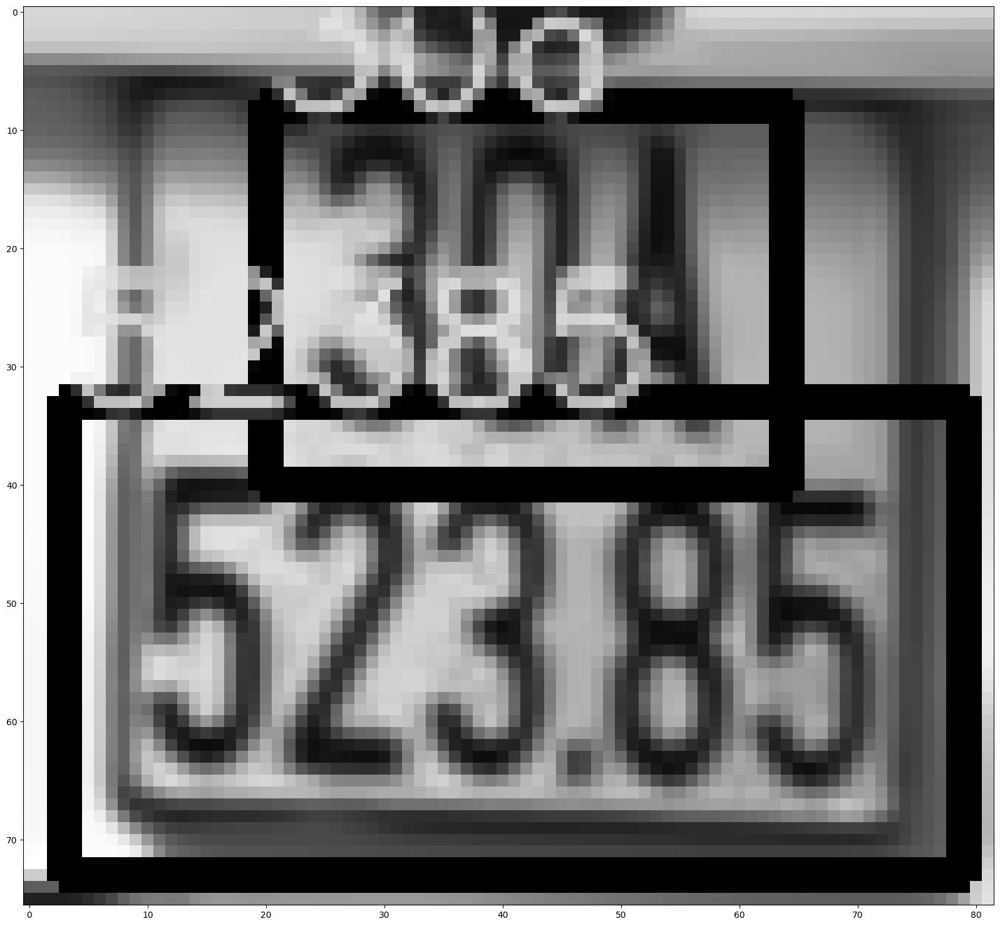

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-EZ 627.23


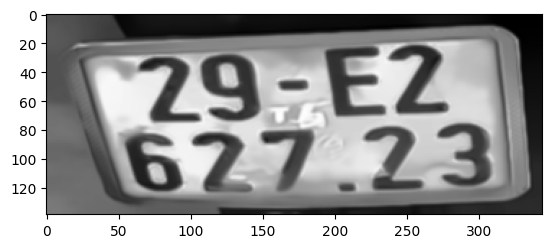

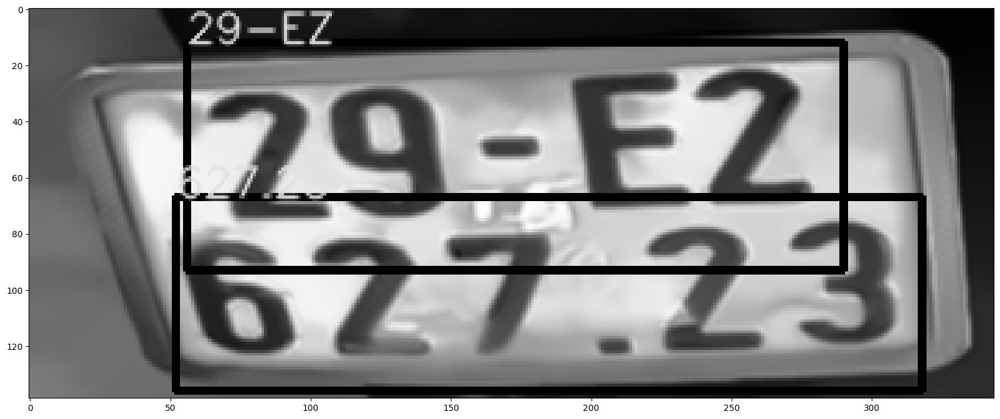

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 12936
Character Error Rate: 0.20
Accuracy: 0.80


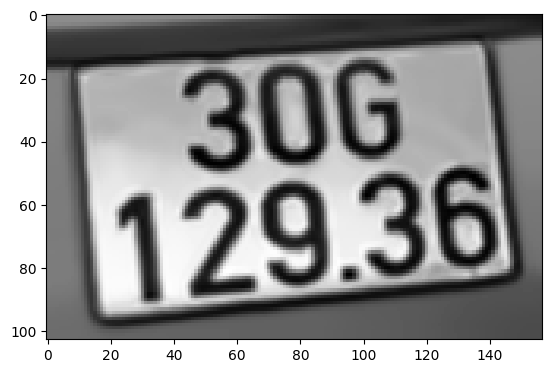

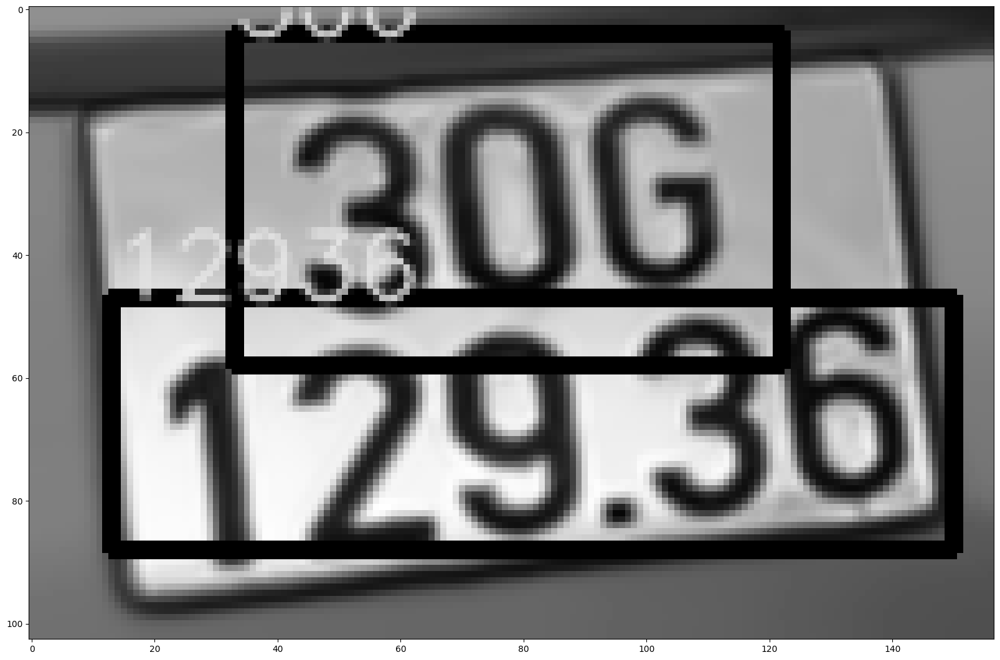

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306-665.22


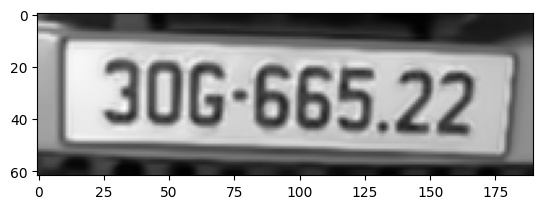

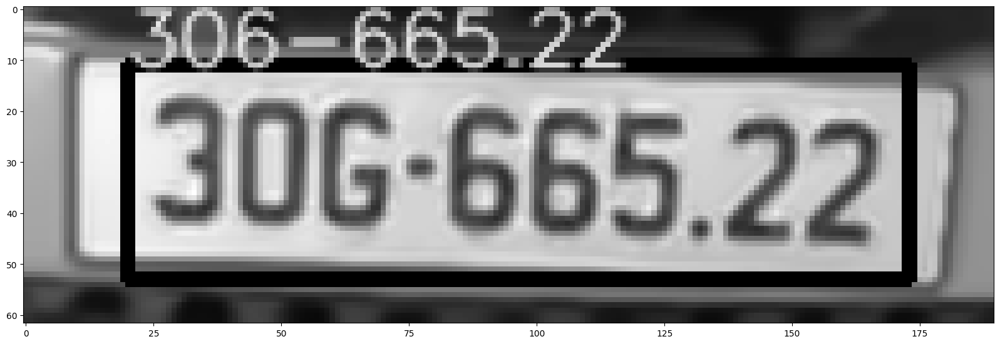

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30-FZ 3499
Character Error Rate: 0.10
Accuracy: 0.90


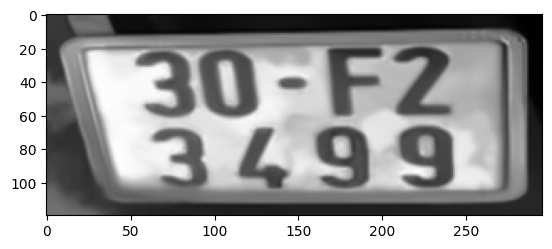

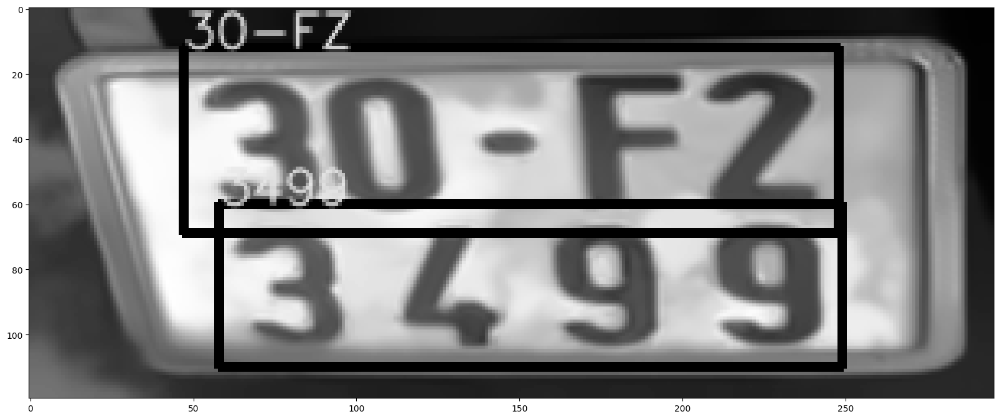

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 125.82


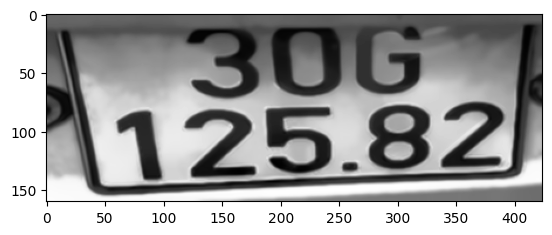

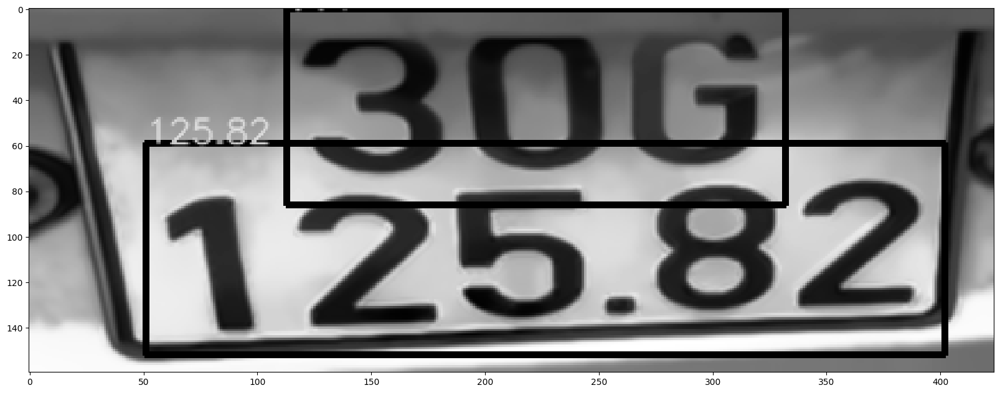

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0H.791.72


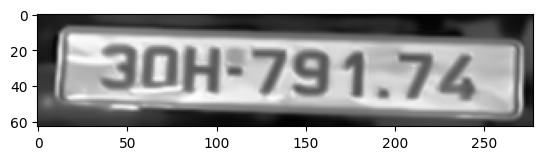

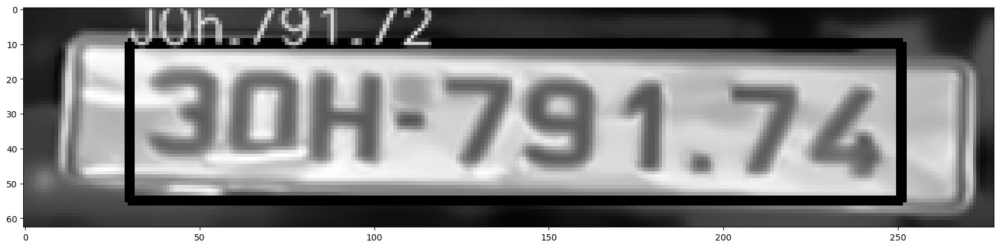

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 791.83
Character Error Rate: 0.10
Accuracy: 0.90


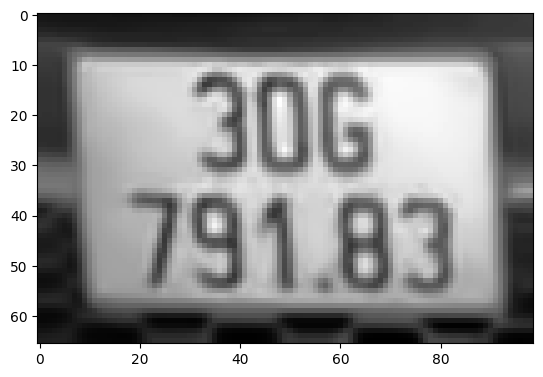

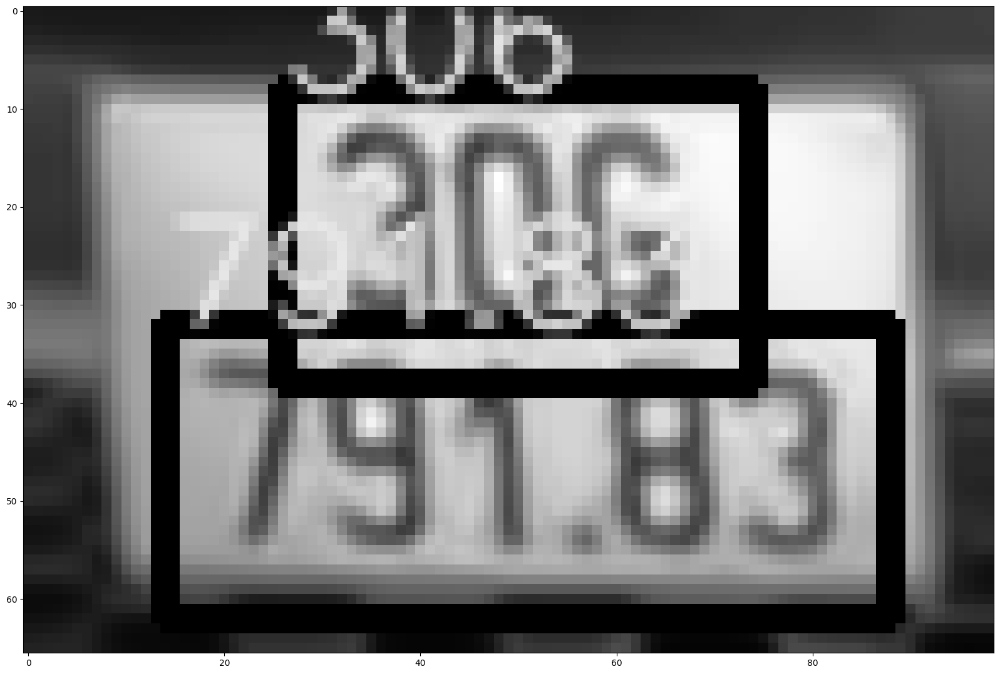

Using CPU. Note: This module is much faster with a GPU.


License plate number: E91707 72


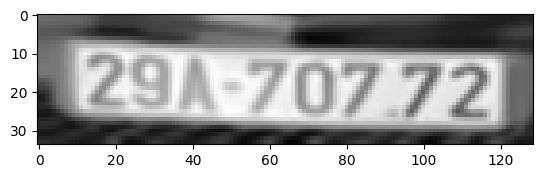

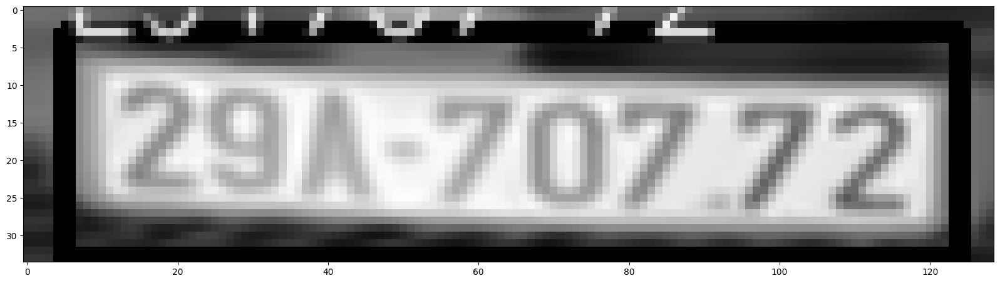

Using CPU. Note: This module is much faster with a GPU.


License plate number: 304 475.05
Character Error Rate: 0.10
Accuracy: 0.90


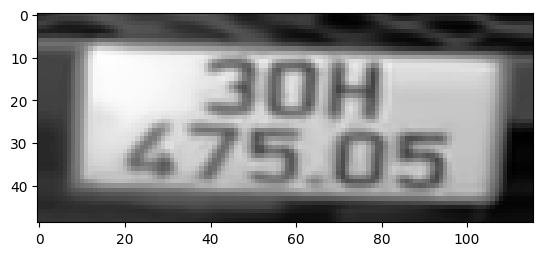

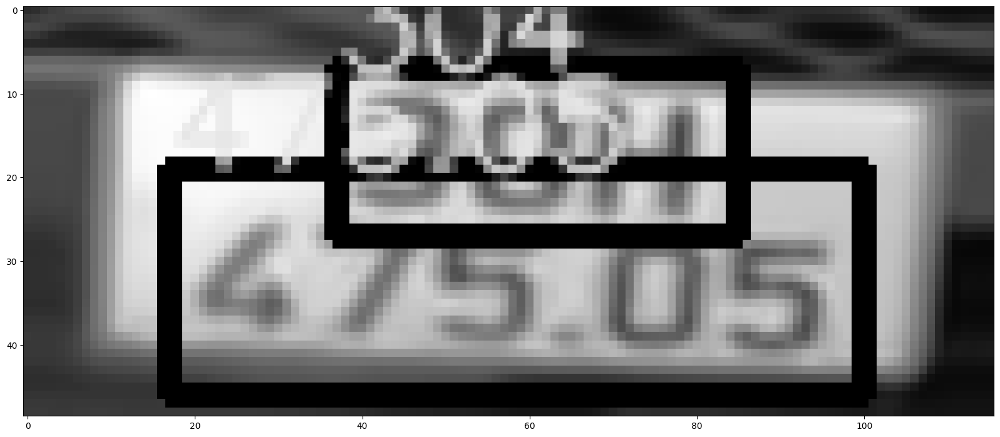

Using CPU. Note: This module is much faster with a GPU.


License plate number: 34-BL 387 0L
Character Error Rate: 0.25
Accuracy: 0.75


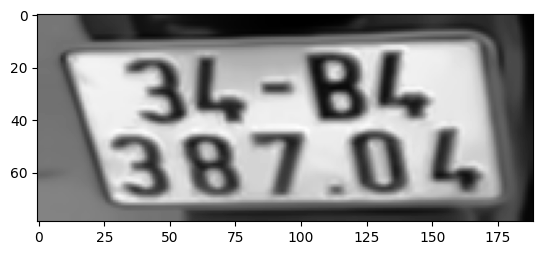

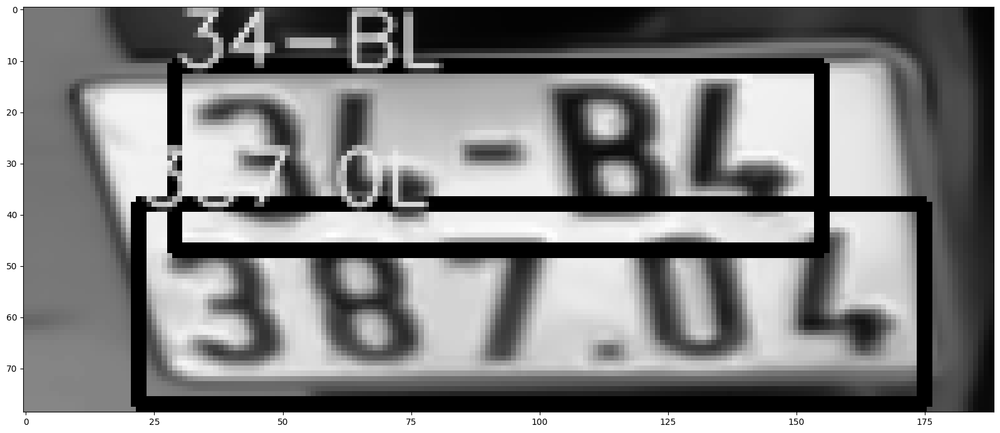

Using CPU. Note: This module is much faster with a GPU.


License plate number: 297ET 642.28


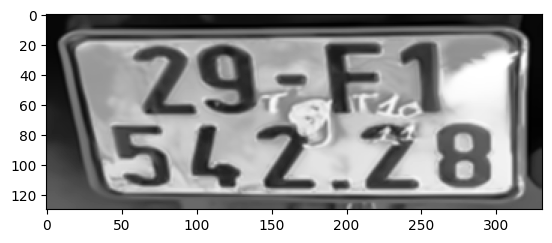

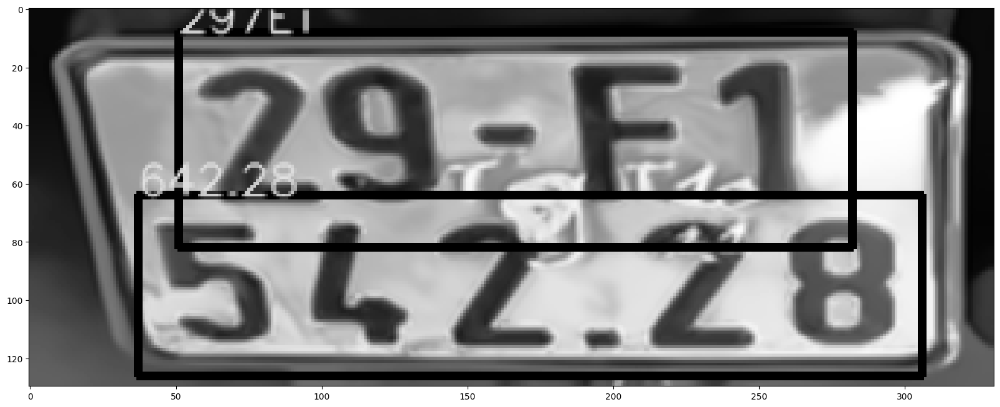

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-AB 020 01
Character Error Rate: 0.08
Accuracy: 0.92


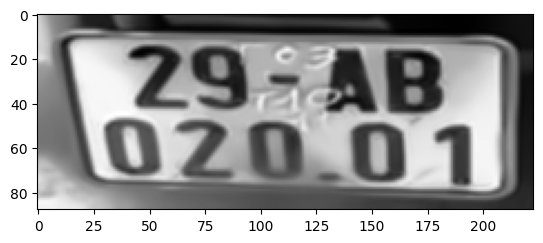

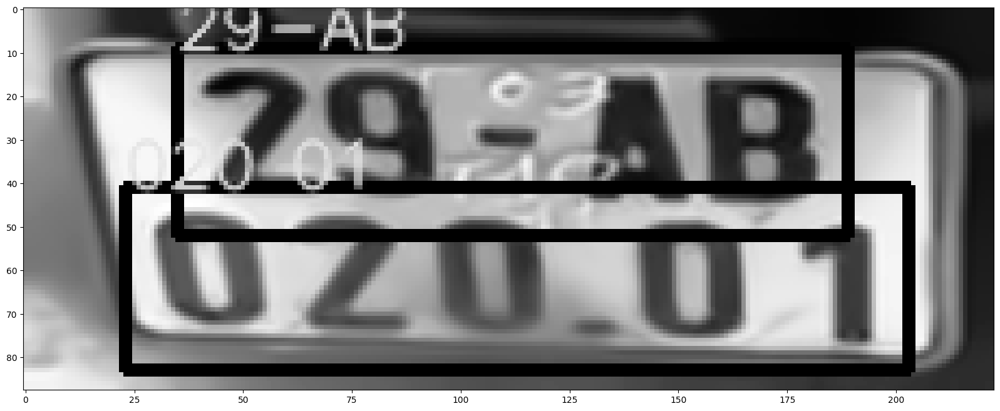

Using CPU. Note: This module is much faster with a GPU.


License plate number: 14-21 314.24


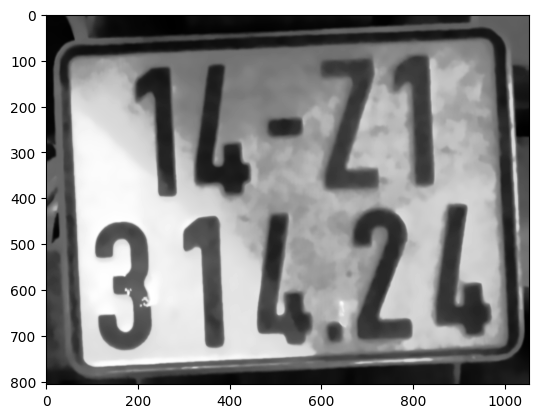

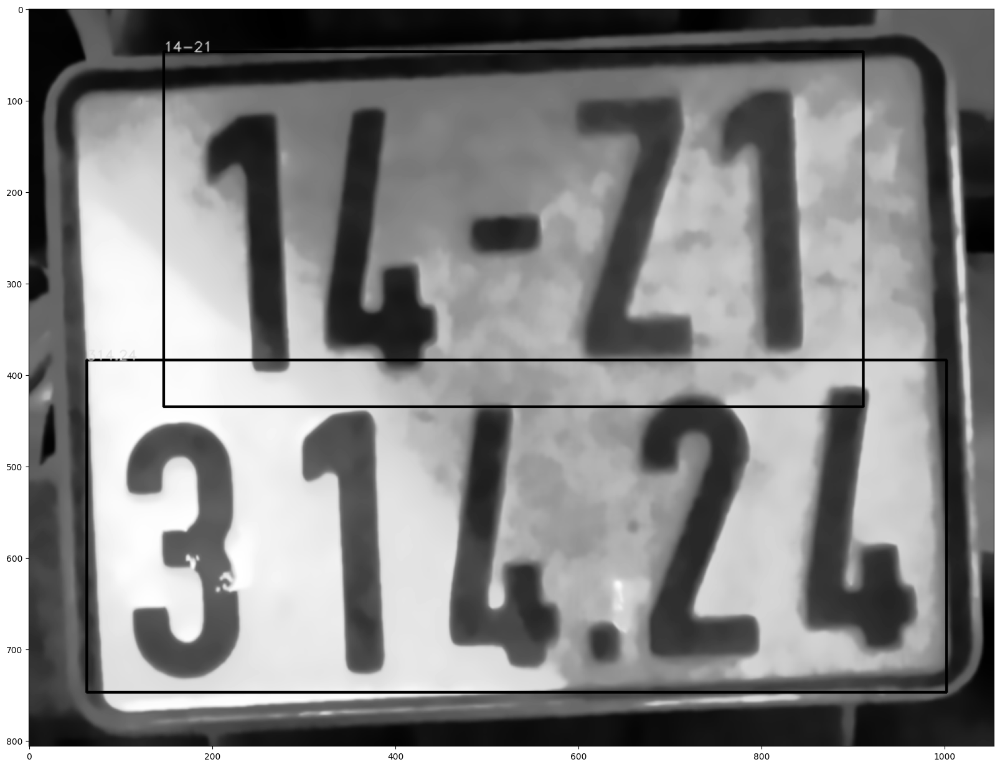

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F-369.35
Character Error Rate: 0.10
Accuracy: 0.90


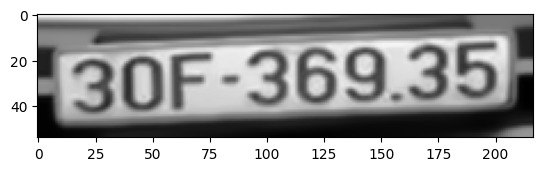

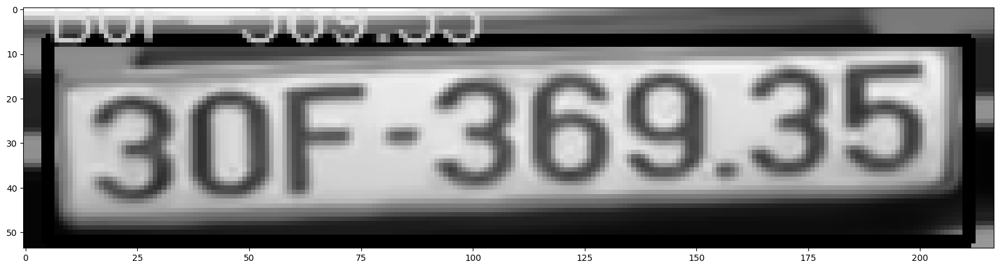

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-AB 027 70


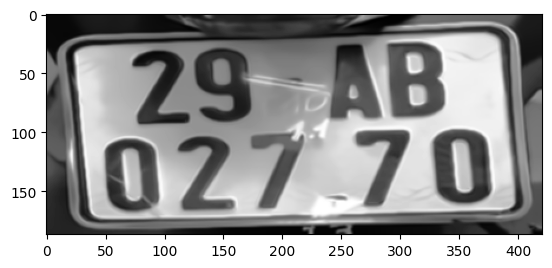

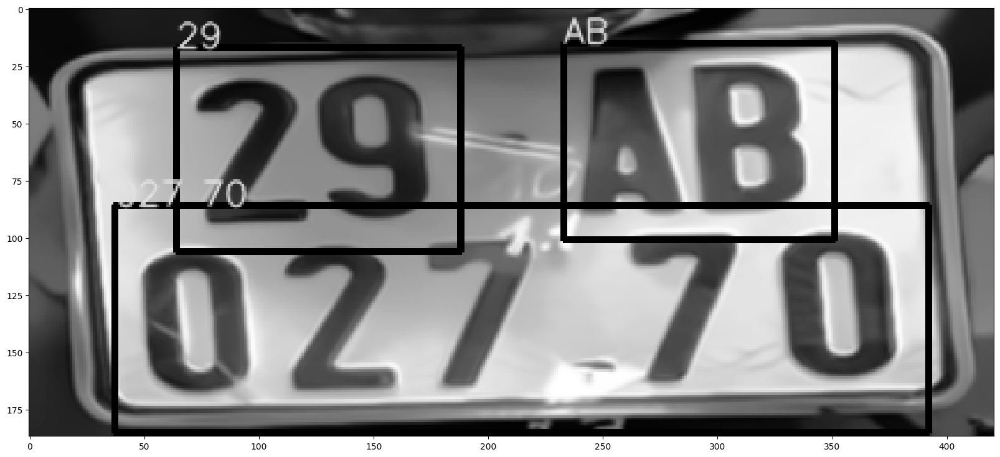

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F:930,02


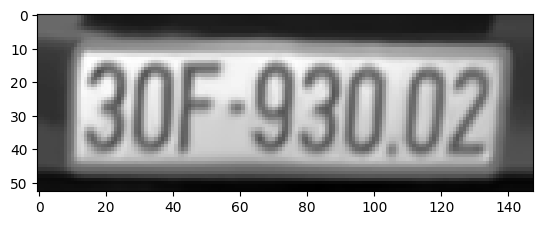

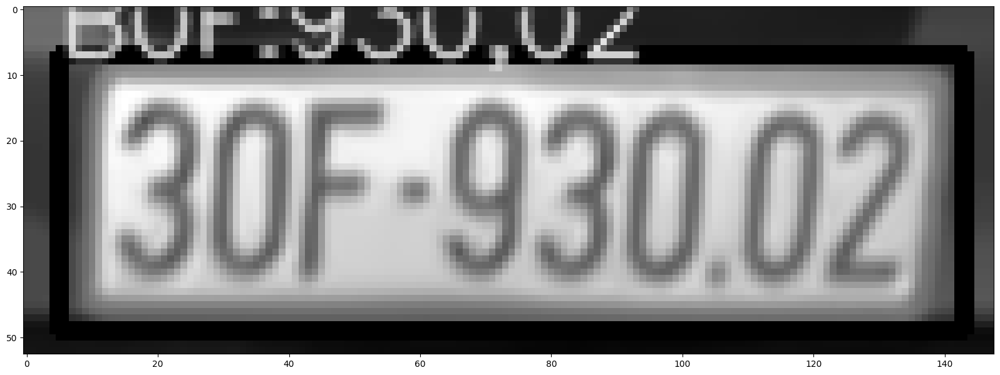

Using CPU. Note: This module is much faster with a GPU.


License plate number: 20439486
Character Error Rate: 0.40
Accuracy: 0.60


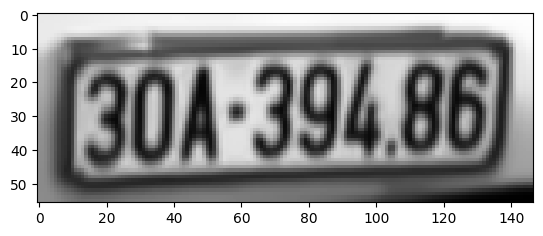

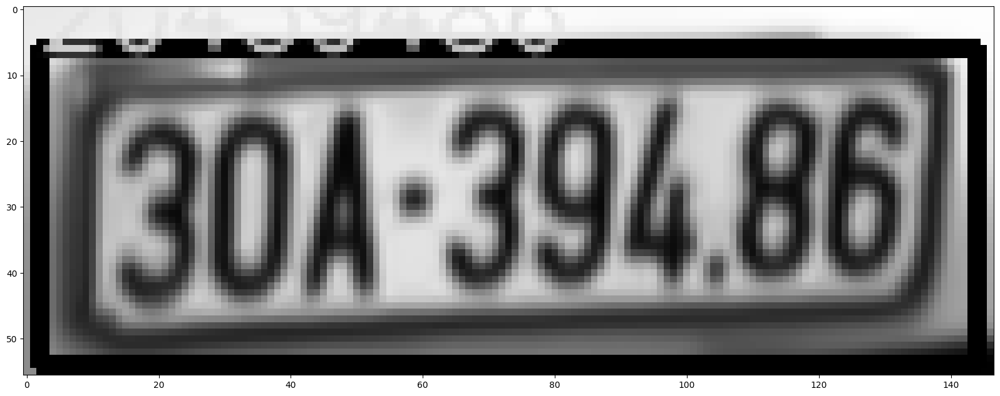

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 505.41


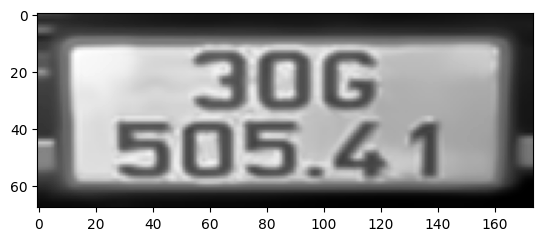

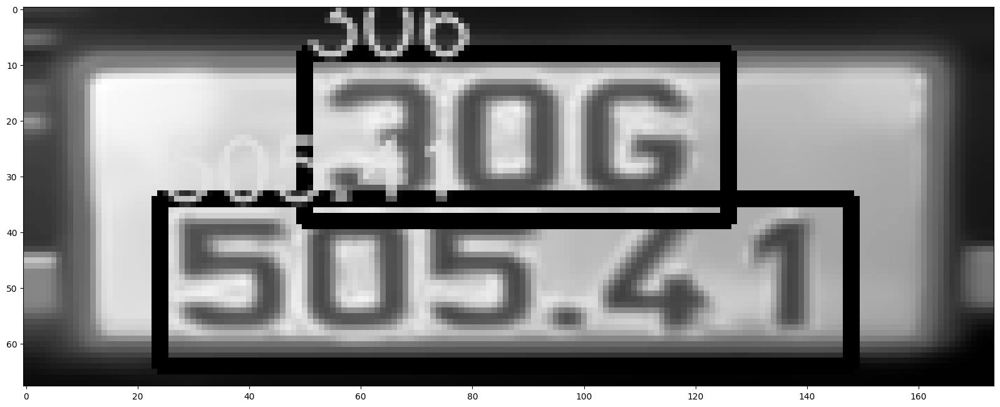

Using CPU. Note: This module is much faster with a GPU.


License plate number: J0H 071.07


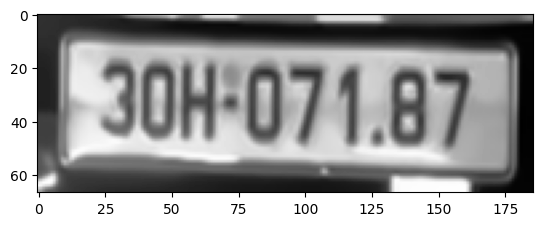

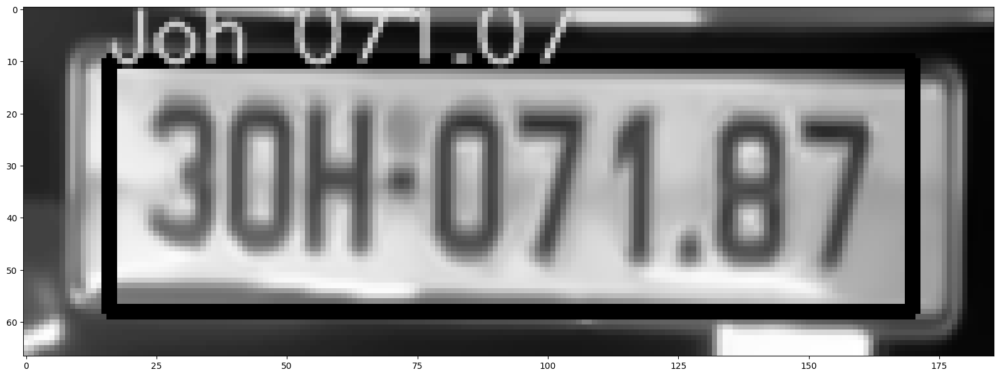

Using CPU. Note: This module is much faster with a GPU.


License plate number: 291 26717 
Character Error Rate: 0.30
Accuracy: 0.70


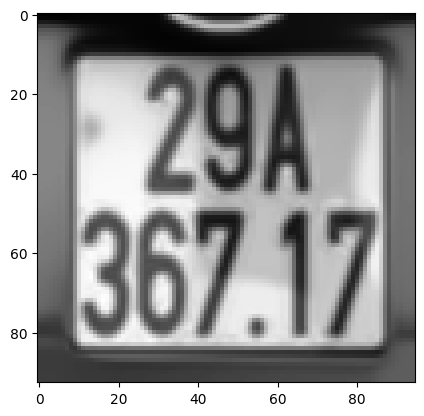

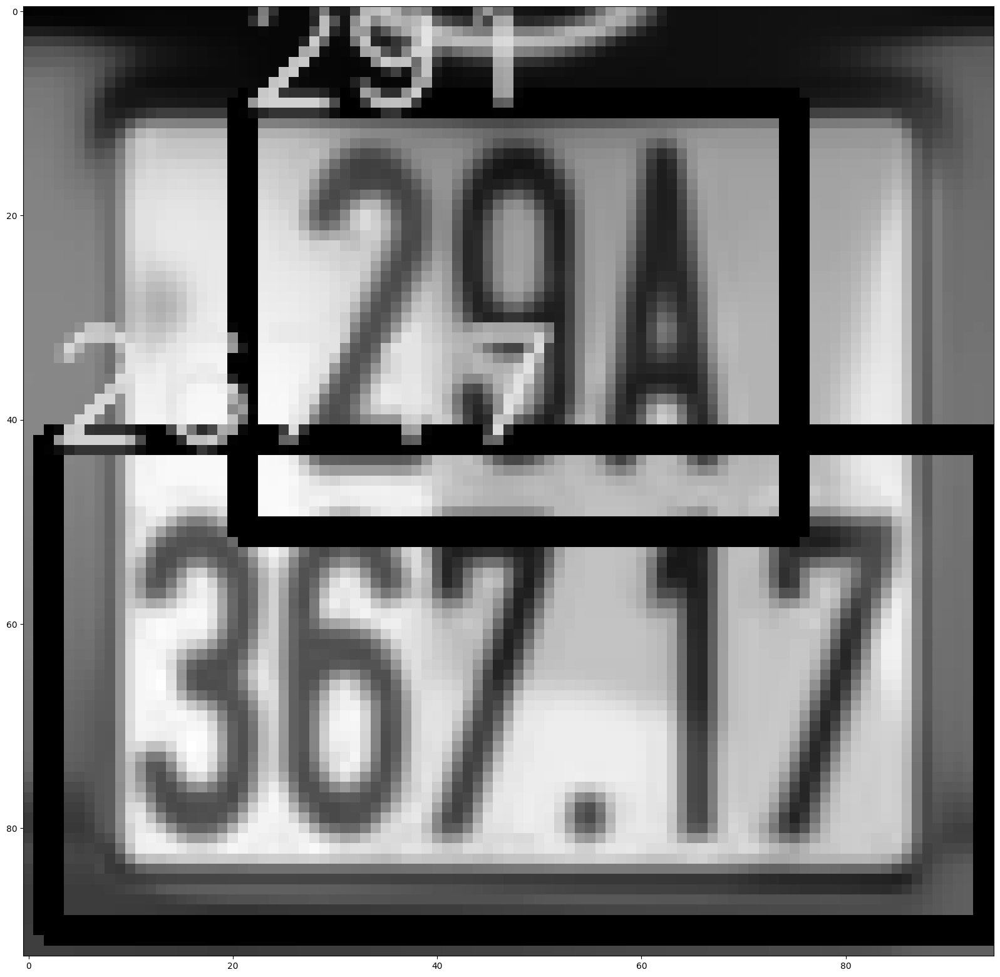

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29A 015.19
Character Error Rate: 0.00
Accuracy: 1.00


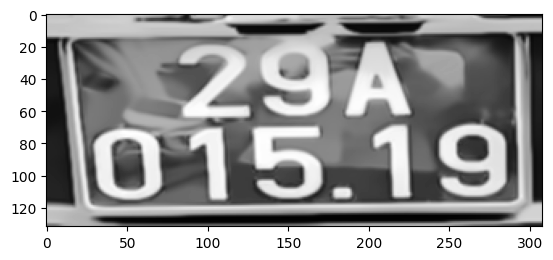

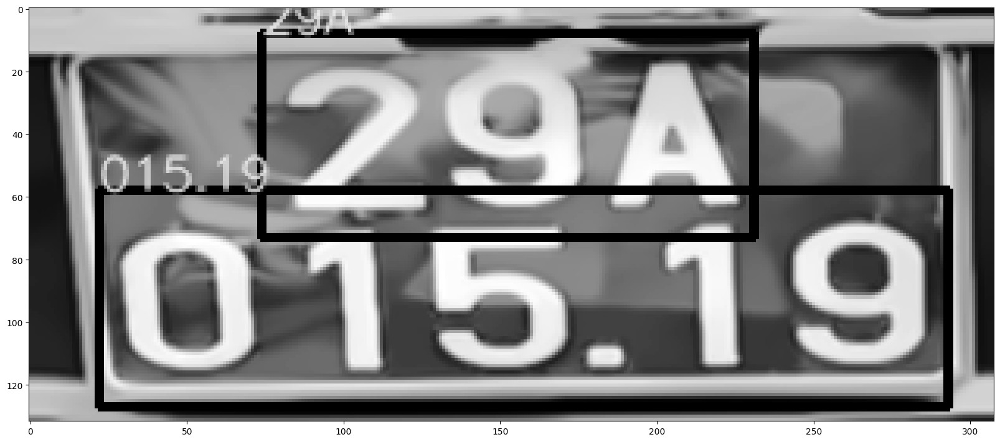

Using CPU. Note: This module is much faster with a GPU.


License plate number: 29-EZ 673.90


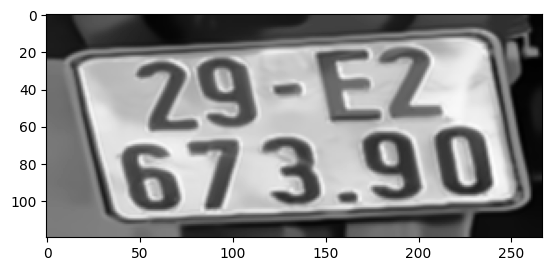

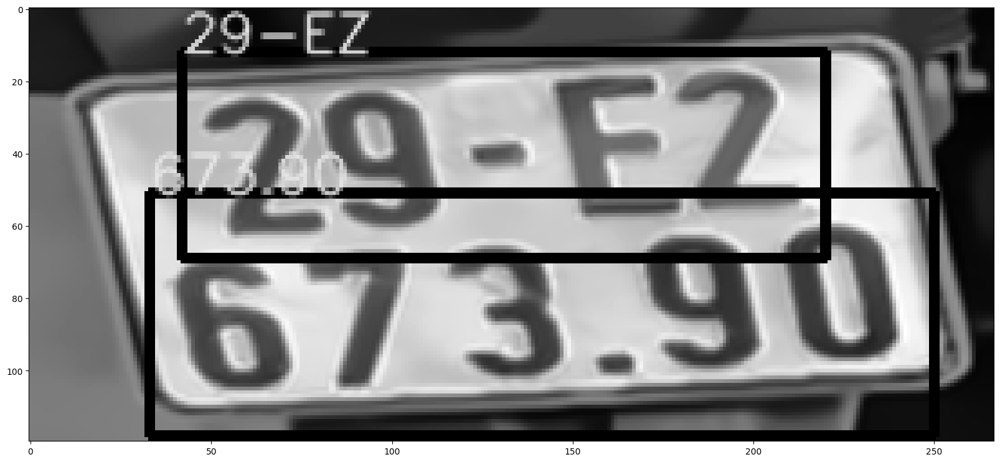

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F-987.25]
Character Error Rate: 0.20
Accuracy: 0.80


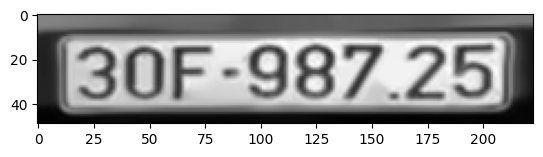

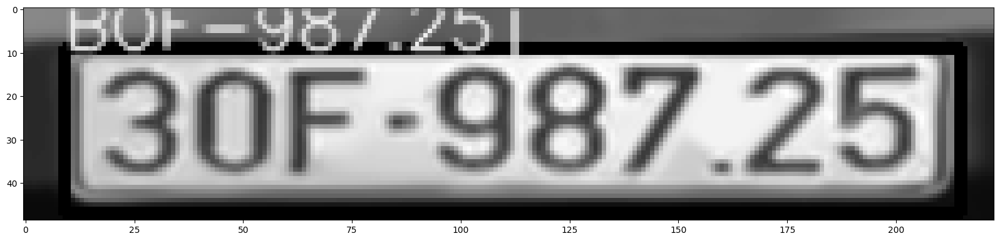

Using CPU. Note: This module is much faster with a GPU.


License plate number: D0K 000.72


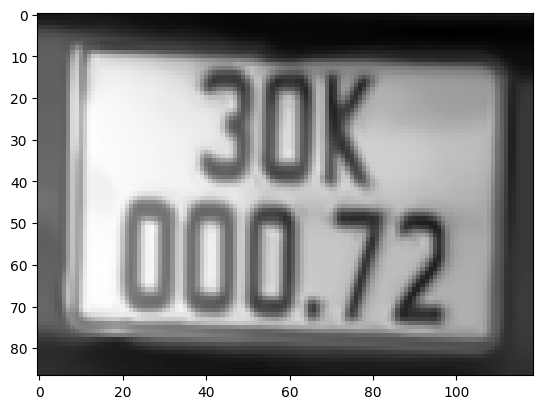

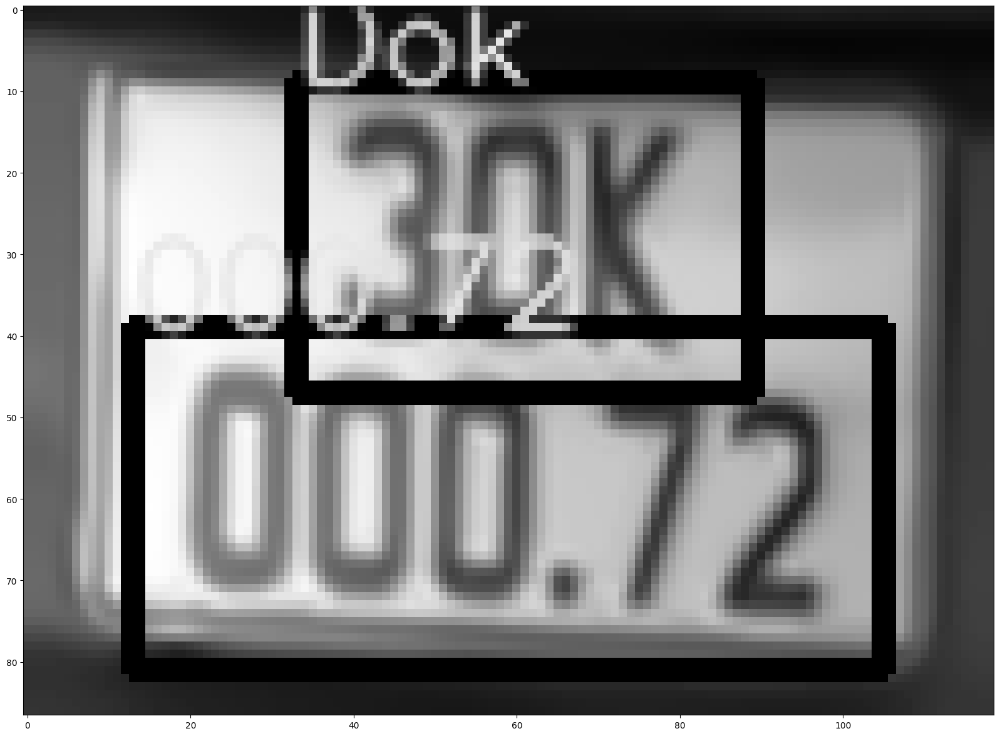

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 791.83


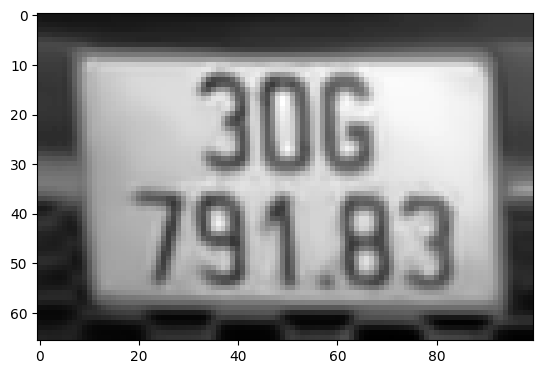

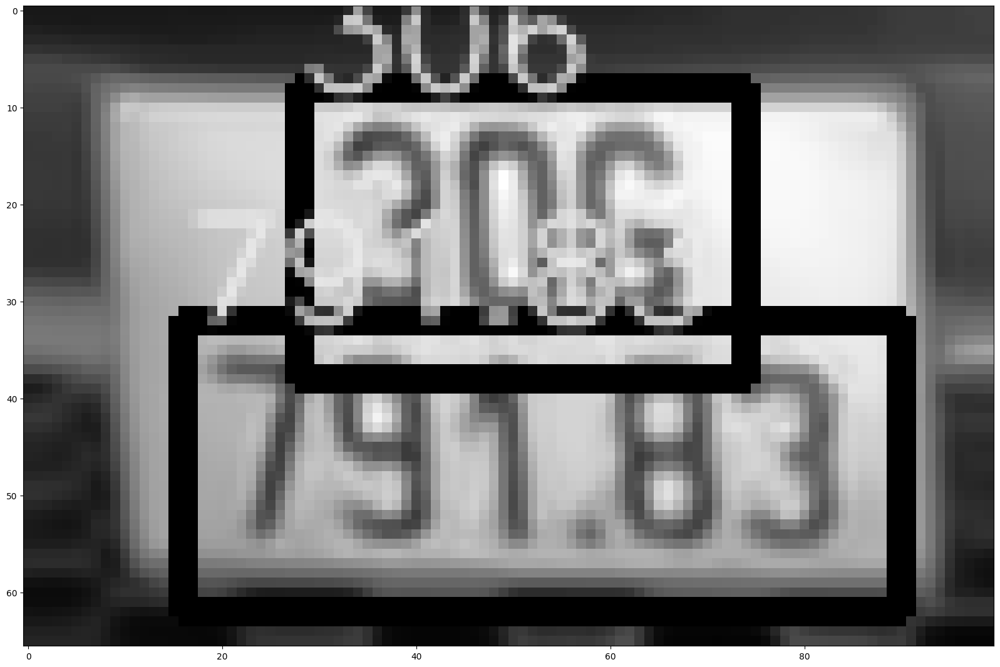

Using CPU. Note: This module is much faster with a GPU.


License plate number: 291 26717 


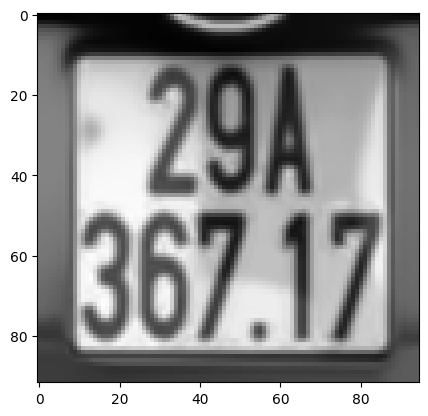

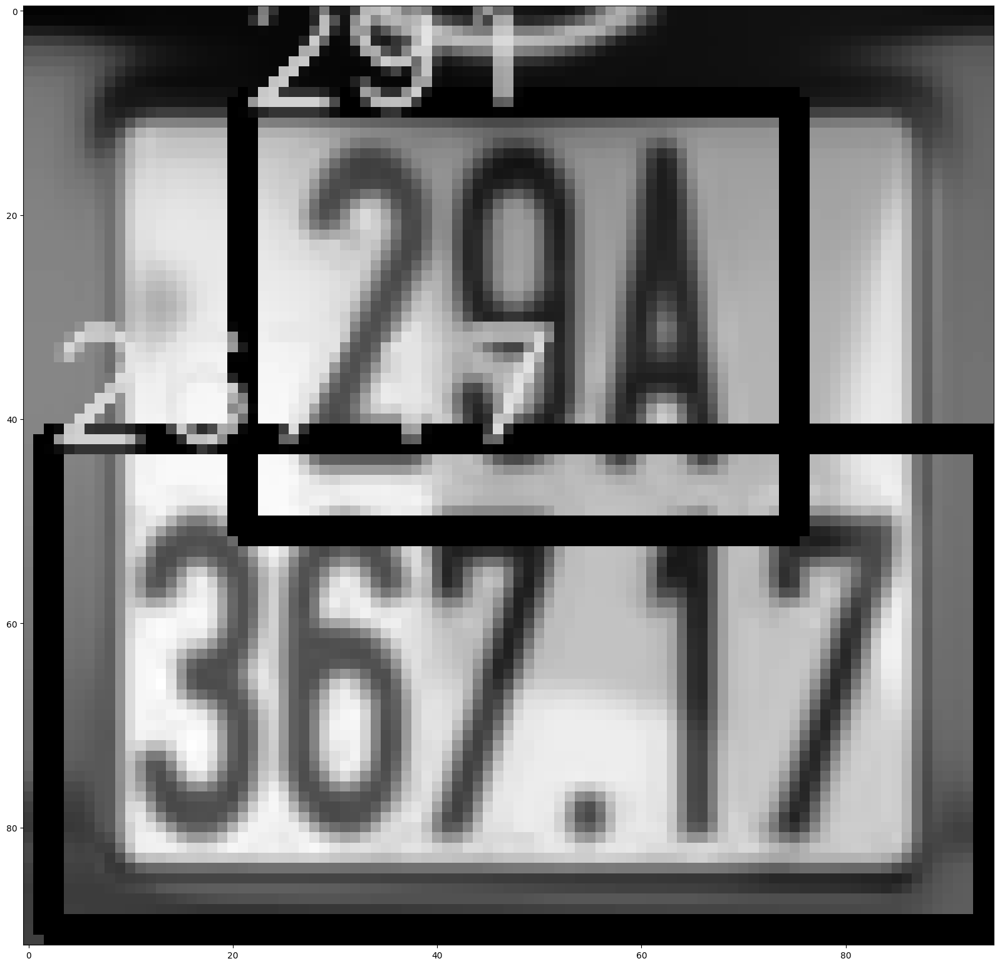

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 645.85


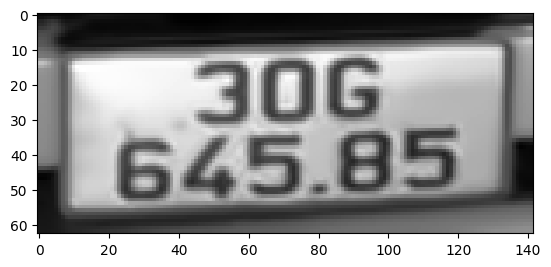

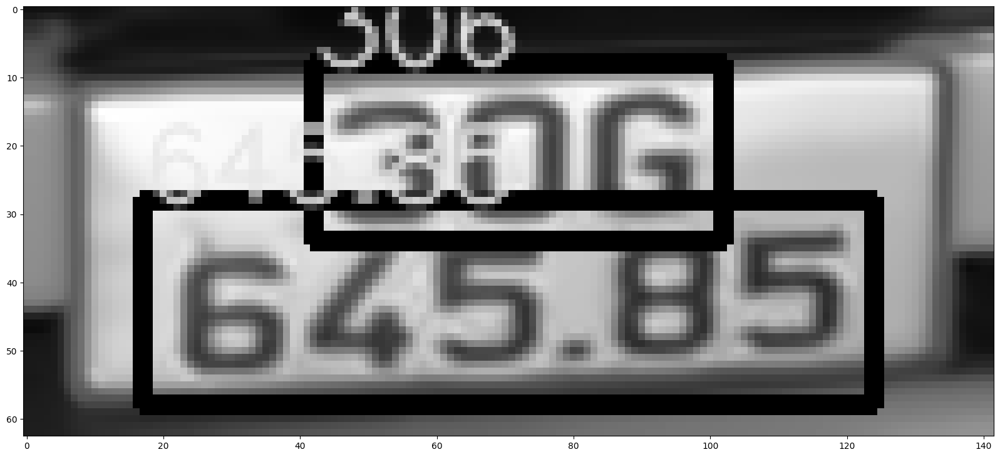

Using CPU. Note: This module is much faster with a GPU.


License plate number: 34-FT 631.59
Character Error Rate: 0.17
Accuracy: 0.83


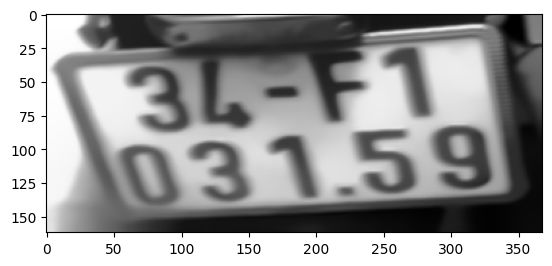

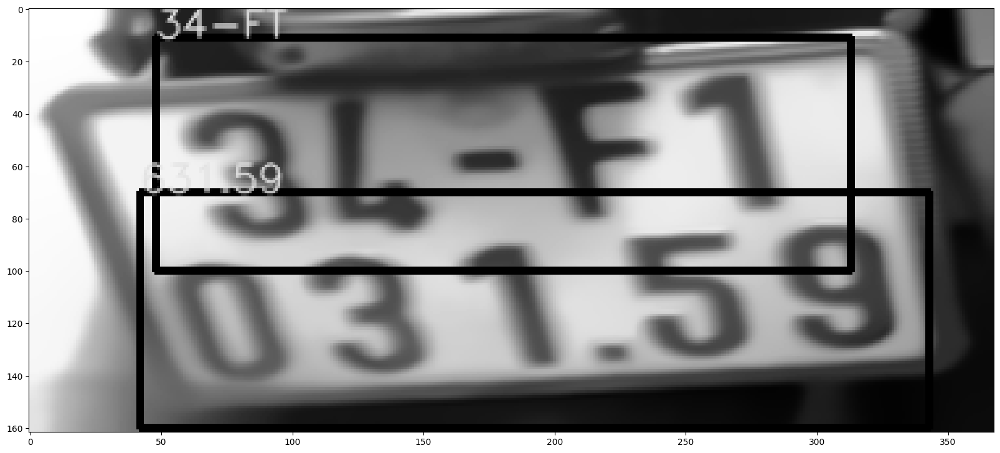

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30F 428.56 


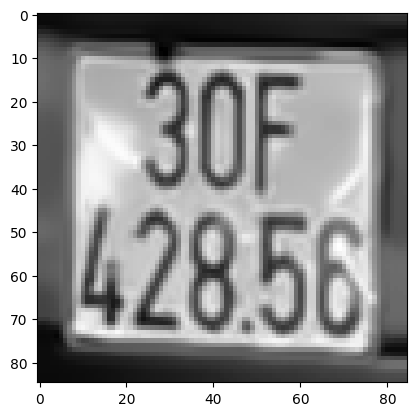

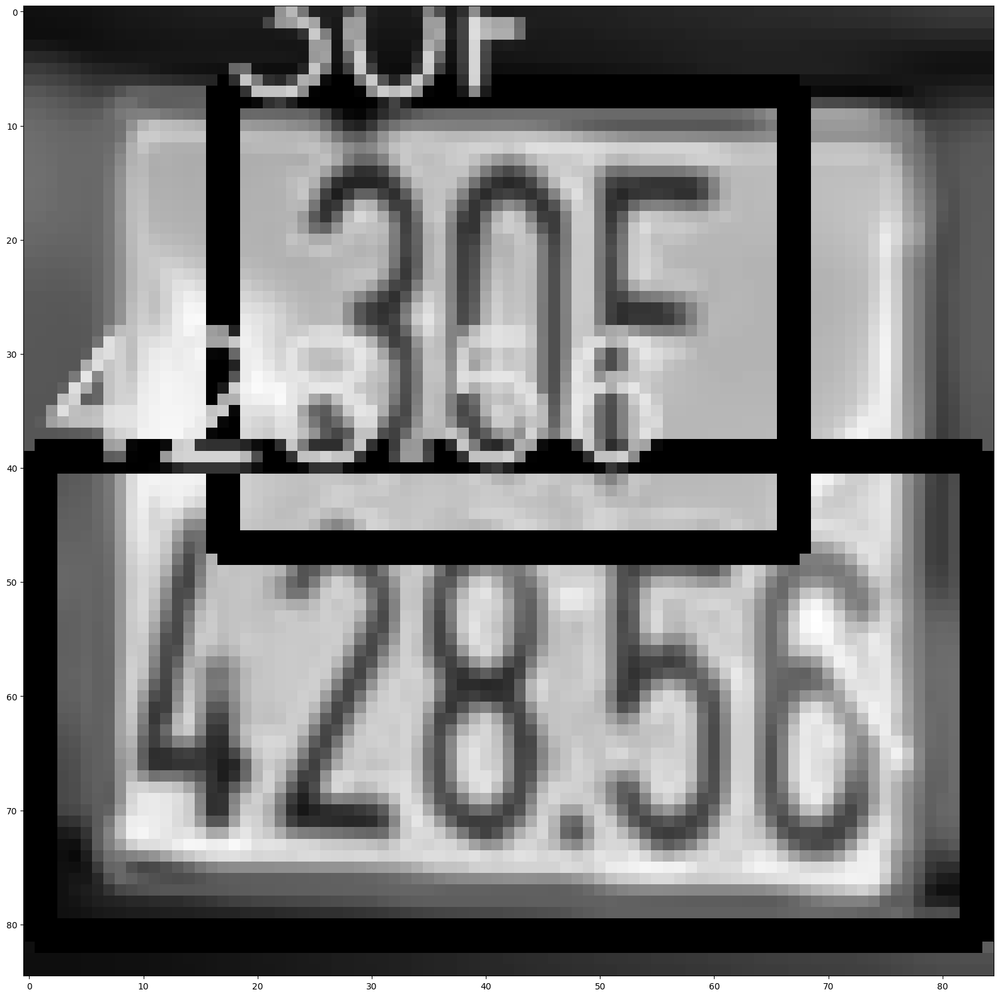

Using CPU. Note: This module is much faster with a GPU.


License plate number: B0F.722.28


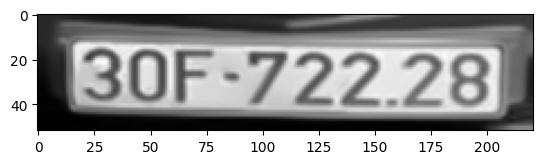

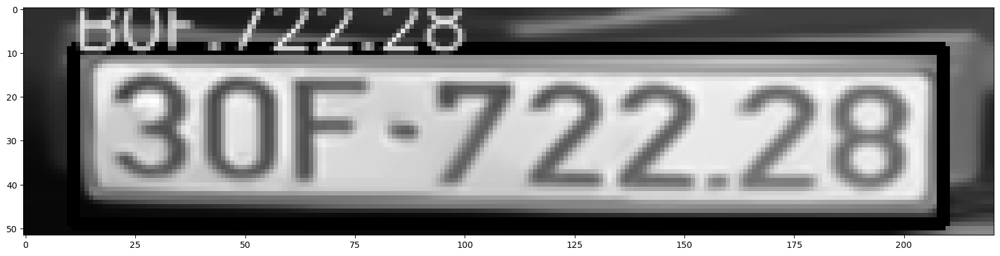

Using CPU. Note: This module is much faster with a GPU.


License plate number: 306 645.85
Character Error Rate: 0.10
Accuracy: 0.90


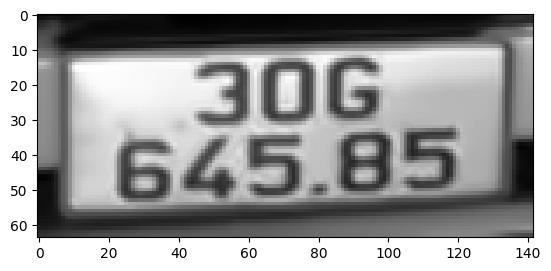

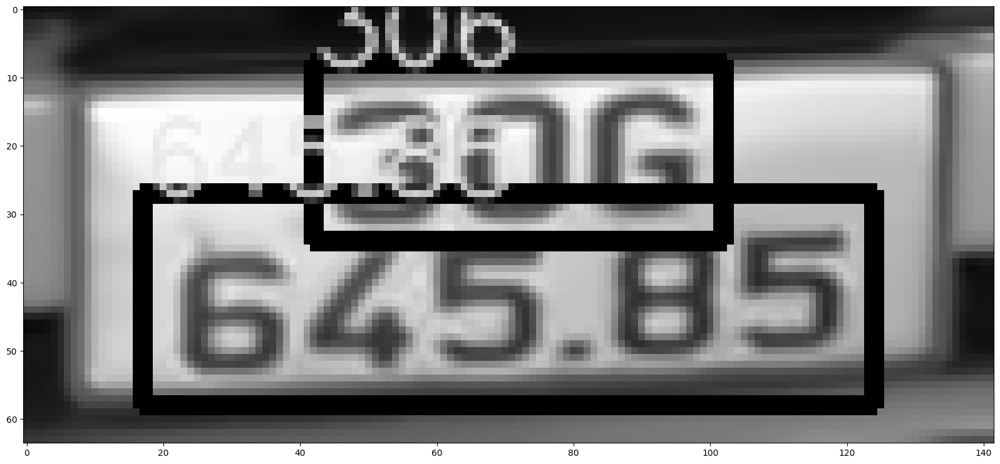

Using CPU. Note: This module is much faster with a GPU.


License plate number: 30F 281.18
Character Error Rate: 0.00
Accuracy: 1.00


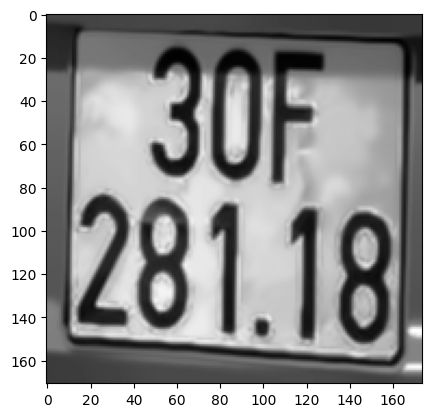

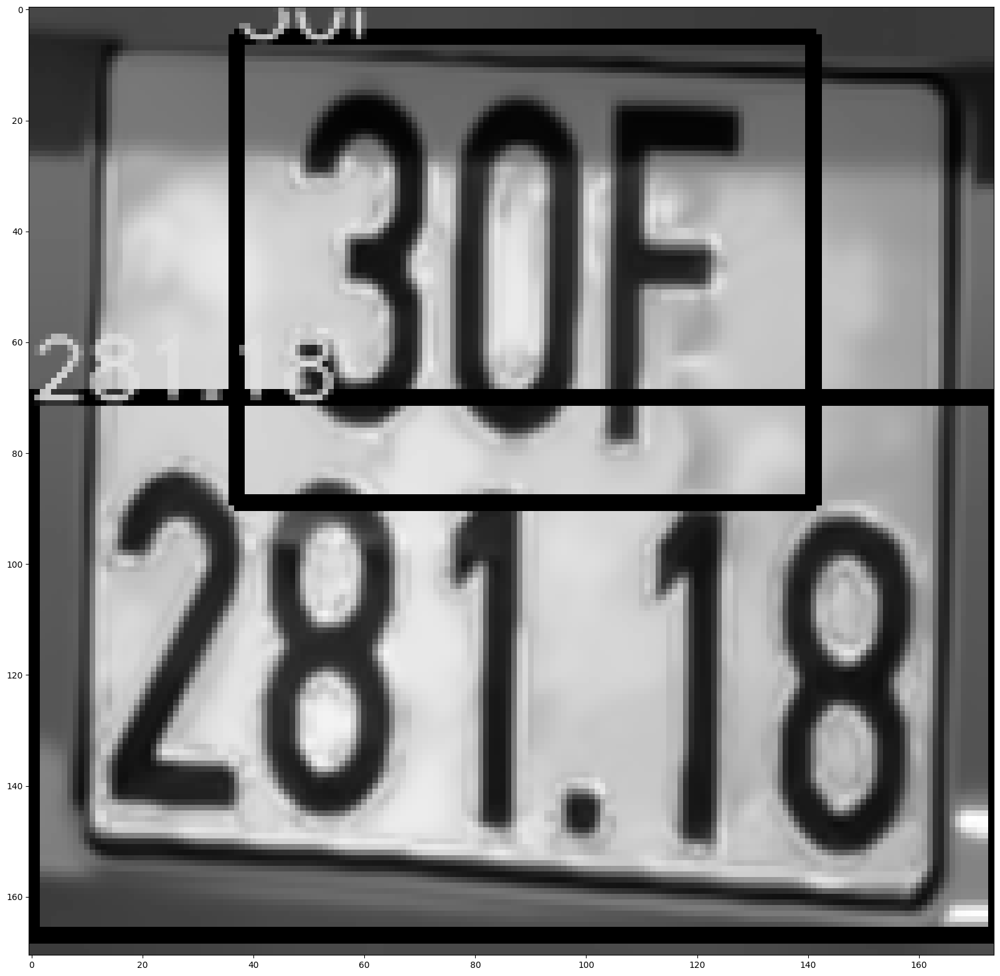

Using CPU. Note: This module is much faster with a GPU.


License plate number: P0H-310.20


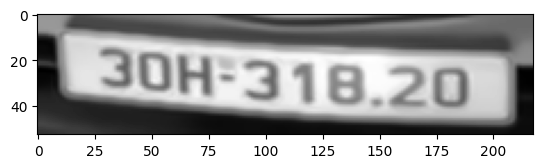

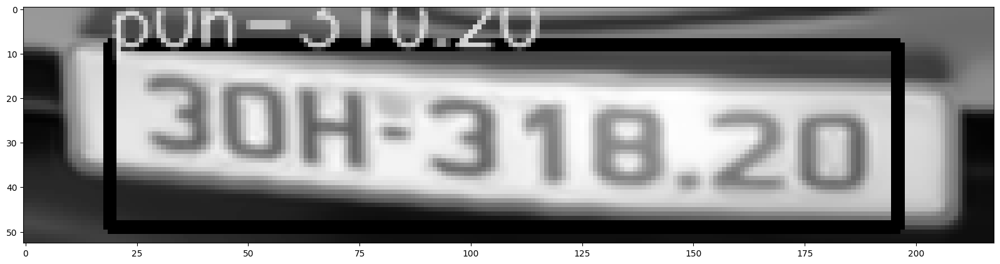

             plate
0    [894- 146.26]
1     23-N1 062.42
2       29A 015.19
3        J0K 15262
4       30-FZ 3499
..             ...
97     30F 428.56 
98      B0F.722.28
99      306 645.85
100     30F 281.18
101     P0H-310.20

[102 rows x 1 columns]
Overall character Error Rate: 0.16
Accuracy: 0.84


In [55]:
# create image path
crop_img_path = "/home/vannguyen/Downloads/LicensePlateDetection-main/runs/detect/inference/crops/license"
# create dataframe to store the data
license_plate_df = pd.DataFrame({'plate': []})

ground_truth = {
    "img-106-_jpg.rf.jpg": "29-L5 613.35",
    "img-114-_jpg.rf.jpg": "29-AB 020.01",
    "img-119-_jpg.rf.jpg": "23-M1 062.42",
    "img-126-_jpg.rf.jpg": "30-F2 3499",
    "img-130-_jpg.rf.jpg": "29-E2 627.23",
    "img-137-_jpg.rf.jpg": "29-L5 382.57",
    "img-140-_jpg.rf.jpg": "29-E2 673.90",
    "img-18-_jpg.rf.jpg": "34-B4 387.04",
    "img-180-_jpg.rf.jpg": "30A-981.30",
    "img-198-_jpg.rf.jpg": "30K-209.22",
    "img-207-_jpg.rf.jpg": "30K 152.62",
    "img-210-_jpg.rf.jpg": "30F-987.25",
    "img-216-_jpg.rf.jpg": "30F-369.35",
    "img-22-_jpg.rf.jpg": "29-S6 036.17",
    "img-235-_jpg.rf.jpg": "30H 475.05",
    "img-244-_jpg.rf.jpg": "30E-466.22",
    "img-245-_jpg.rf.jpg": "30F-057.36",
    "img-246-_jpg.rf.jpg": "30G 645.85",
    "img-250-_jpg.rf.jpg": "30G 505.41",
    "img-251-_jpg.rf.jpg": "30F-722.28",
    "img-275-_jpg.rf.jpg": "30H 692.38",
    "img-277-_jpg.rf.jpg": "89A-146.26",
    "img-289-_jpg.rf.jpg": "30G 129.36",
    "img-302-_jpg.rf.jpg": "30H-791.74",
    "img-356-_jpg.rf.jpg": "30F 428.56",
    "img-364-_jpg.rf.jpg": "30A-394.86",
    "img-371-_jpg.rf.jpg": "30G 791.83",
    "img-387-_jpg.rf.jpg": "30A 523.85",
    "img-430-_jpg.rf.jpg": "29A 367.17",
    "img-434-_jpg.rf.jpg": "30F 281.18",
    "img-446-_jpg.rf.jpg": "29A 015.19",
    "img-484-_jpg.rf.jpg": "30G 125.82",
    "img-492-_jpg.rf.jpg": "30E-478.75",
    "img-493-_jpg.rf.jpg": "30K 488.16",
    "img-497-_jpg.rf.jpg": "30K-006.06",
    "img-51-_jpg.rf.jpg": "30G 997.94",
    "img-518-_jpg.rf.jpg": "30K 046.69",
    "img-523-_jpg.rf.jpg": "30F-930.02",
    "img-525-_jpg.rf.jpg": "30G-665.22",
    "img-53-_jpg.rf.jpg": "30G 243.54",
    "img-544-_jpg.rf.jpg": "30H-301.46",
    "img-63-_jpg.rf.jpg": "30A 098.83",
    "img-7-_jpg.rf.jpg": "34-F1 031.59",
    "img-99-_jpg.rf.jpg": "29-AB 027.70"
}

overall_accuracy = 0
overall_cer = 0

number_img = 0
# loop through the images in the folder and process them one by one
for images in os.listdir(crop_img_path):
    
    
    # check if the image are belong to these format
    if (images.endswith(".png") 
        or images.endswith(".jpg")
        or images.endswith(".jpeg")):

        # read the image
        img_path = os.path.join(crop_img_path, images)
        img = cv2.imread(img_path)
        #convert to grayscale image
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        #improve contrast
        img = cv2.equalizeHist(img)
        #remove blur
        img = cv2.GaussianBlur(img, (3, 3), 0)
        
        # remove noise
        img = cv2.fastNlMeansDenoising(img, None, 12, 7, 21)
        plt.imshow(img,cmap='gray')


        # use easyocr to read the text
        reader = easyocr.Reader(['en'], gpu = False)
        text = reader.readtext(img)        

        # extract text from the result output: list [bounding box, text, confidence]
        if len(text) > 2:
            license_text = (text[0][1] + "-" + text[1][1] + " " + text[2][1]).upper()
            license_text = license_text.replace('O','0')
            print(f"License plate number: {license_text}")
        elif len(text) > 1:
            license_text = (text[0][1] + " " + text[1][1]).upper()
            license_text = license_text.replace('O','0')
            print(f"License plate number: {license_text}")
        elif len(text) == 1:
            license_text = (text[0][1]).upper()
            license_text = license_text.replace('O','0')
            print(f"License plate number: {license_text}")
        else:
            print("No text detected")
        #use jiwer to calculate accuracy
        if images in ground_truth:
            number_img += 1
            reference_text = ground_truth[images]
            cer = jiwer.cer(reference_text, license_text)
            print(f"Character Error Rate: {cer:.2f}")

            
    
            accuracy = 1 - cer
            print(f"Accuracy: {accuracy:.2f}")
    
            overall_accuracy += accuracy
            overall_cer += cer
        

        else:
            print(f"Warning: Ground truth not found for image '{images}'. Skipping CER/accuracy calculation.")
        

        # add new data into dataframe
        new_df = pd.DataFrame({'plate': [license_text]})
        license_plate_df = pd.concat([license_plate_df, new_df], ignore_index = True)

        #draw the bounding box and text
        for detection in text:
            top_left = tuple([int(val) for val in detection[0][0]])
            bottom_right = tuple([int(val) for val in detection[0][2]])
            text = detection[1]
            font = cv2.FONT_HERSHEY_SIMPLEX
            img = cv2.rectangle(img, top_left, bottom_right, (0,255,0), 2)
            img = cv2.putText(img, text, top_left, font, 0.5, (225,0,0), 1, cv2.LINE_AA)
        
        # plot the image 
        plt.figure(figsize = (20,20))
        plt.imshow(img,cmap='gray')
        plt.show()
# print out the dataframe
print(license_plate_df)
license_plate_df.to_csv("license_plate.csv", index = True)


#calculate overall cer
overall_cer = overall_cer/number_img
print(f"Overall character Error Rate: {overall_cer:.2f}")


#calculate overall accuracy
overall_accuracy = overall_accuracy/number_img
print(f"Accuracy: {overall_accuracy:.2f}")



* 3 main components of EasyOCR: feature extraction, sequence labeling, and decoding

* Feature extraction: analyze the text region and extract relevant featuress --> Using Resnet(Residual Network)

* Sequence Labeling: Using LSTM to predict the character

The LSTM network processes this sequence one by one, analyzing the features of each section along with the context of surrounding features.

By considering both individual features and their context, the LSTM network progressively assigns a label (predicted character) to each element in the sequence.

* Decoding: the sequence of labels (predicted characters) is decoded to give you the actual recognized text


# Image processing and PyTesseract

In [53]:

from PIL import Image, ImageEnhance
import PIL
import pytesseract
from pytesseract import Output
import cv2
import numpy as np
import cv2

In [54]:
import pytesseract
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'


In [56]:
# create dataframe to store the data
license_plate_df = pd.DataFrame({'plate': []})

ground_truth = {
    "img-106-_jpg.rf.jpg": "29-L5 613.35",
    "img-114-_jpg.rf.jpg": "29-AB 020.01",
    "img-119-_jpg.rf.jpg": "23-M1 062.42",
    "img-126-_jpg.rf.jpg": "30-F2 3499",
    "img-130-_jpg.rf.jpg": "29-E2 627.23",
    "img-137-_jpg.rf.jpg": "29-L5 382.57",
    "img-140-_jpg.rf.jpg": "29-E2 673.90",
    "img-18-_jpg.rf.jpg": "34-B4 387.04",
    "img-180-_jpg.rf.jpg": "30A-981.30",
    "img-198-_jpg.rf.jpg": "30K-209.22",
    "img-207-_jpg.rf.jpg": "30K 152.62",
    "img-210-_jpg.rf.jpg": "30F-987.25",
    "img-216-_jpg.rf.jpg": "30F-369.35",
    "img-22-_jpg.rf.jpg": "29-S6 036.17",
    "img-235-_jpg.rf.jpg": "30H 475.05",
    "img-244-_jpg.rf.jpg": "30E-466.22",
    "img-245-_jpg.rf.jpg": "30F-057.36",
    "img-246-_jpg.rf.jpg": "30G 645.85",
    "img-250-_jpg.rf.jpg": "30G 505.41",
    "img-251-_jpg.rf.jpg": "30F-722.28",
    "img-275-_jpg.rf.jpg": "30H 692.38",
    "img-277-_jpg.rf.jpg": "89A-146.26",
    "img-289-_jpg.rf.jpg": "30G 129.36",
    "img-302-_jpg.rf.jpg": "30H-791.74",
    "img-356-_jpg.rf.jpg": "30F 428.56",
    "img-364-_jpg.rf.jpg": "30A-394.86",
    "img-371-_jpg.rf.jpg": "30G 791.83",
    "img-387-_jpg.rf.jpg": "30A 523.85",
    "img-395-_jpg.rf.jpg": "30H-071.87",
    "img-430-_jpg.rf.jpg": "29A 367.17",
    "img-434-_jpg.rf.jpg": "30F 281.18",
    "img-446-_jpg.rf.jpg": "29A 015.19",
    "img-484-_jpg.rf.jpg": "30G 125.82",
    "img-492-_jpg.rf.jpg": "30E-478.75",
    "img-493-_jpg.rf.jpg": "30K 488.16",
    "img-497-_jpg.rf.jpg": "30K-006.06",
    "img-51-_jpg.rf.jpg": "30G 997.94",
    "img-518-_jpg.rf.jpg": "30K 046.69",
    "img-523-_jpg.rf.jpg": "30F-930.02",
    "img-525-_jpg.rf.jpg": "30G-665.22",
    "img-53-_jpg.rf.jpg": "30G 243.54",
    "img-544-_jpg.rf.jpg": "30H-301.46",
    "img-63-_jpg.rf.jpg": "30A 098.83",
    "img-7-_jpg.rf.jpg": "34-F1 031.59",
    "img-99-_jpg.rf.jpg": "29-AB 027.70"
}

overall_cer2 = 0
overall_accuracy2 = 0
overall_wer2 = 0
number_img2 = 0
overall_exact_match_accuracy2 = 0

# Loop through images in the folder
for images in os.listdir(crop_img_path):
    
    # Skip files not in ground_truth
    if images not in ground_truth:
        continue



    if images.endswith((".png", ".jpg", ".jpeg")):
        img_path = os.path.join(crop_img_path, images)
        img = cv2.imread(img_path)

        if img is None:
            print(f"Warning: Could not read image {images}. Skipping.")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.equalizeHist(img)
        img = cv2.GaussianBlur(img, (3, 3), 0)
        img = cv2.fastNlMeansDenoising(img, None, 14, 7, 21)

        # Use Tesseract for OCR
        text = pytesseract.image_to_string(img, config='--oem 3 --psm 6')
        license_text = text.strip().upper().replace('O', '0')

        print(f"License plate number: {license_text}")

        actual_text = ground_truth[images]
        if not isinstance(actual_text, str):
            print(f"Invalid ground truth for {images}, skipping CER.")
        else:
            number_img2 += 1
            cer = jiwer.cer(actual_text, license_text)
            accuracy = 1 - cer
           
            
            
            print(f"Character Error Rate: {cer:.2f}")
            print(f"Accuracy: {accuracy:.2f}")
            

            overall_cer2 += cer
            overall_accuracy2 += accuracy
            

            # Add to dataframe
            license_plate_df = pd.concat([license_plate_df, pd.DataFrame({'plate': [license_text]})], ignore_index=True)

# Print and save dataframe
print(license_plate_df)
license_plate_df.to_csv("license_plate2.csv", index=True)

# calculate overal cer and accuracy
overall_cer2 = overall_cer2 / number_img2
print(f"Overall Character Error Rate: {overall_cer2:.2f}")
overall_accuracy2 = overall_accuracy2 / number_img2
print(f"Accuracy: {overall_accuracy2:.2f}")

      

License plate number: 3-N1 |
& 62.42
Character Error Rate: 0.50
Accuracy: 0.50
License plate number: | 30K -006.06 I
Character Error Rate: 0.50
Accuracy: 0.50
License plate number: I30F-722 28%
Character Error Rate: 0.30
Accuracy: 0.70
License plate number: PERE 4
Character Error Rate: 0.90
Accuracy: 0.10
License plate number: -29-S6
036.17
Character Error Rate: 0.17
Accuracy: 0.83
License plate number: WAZA
Character Error Rate: 1.00
Accuracy: 0.00
License plate number: BIE C0L
Character Error Rate: 0.90
Accuracy: 0.10
License plate number: 30£-465.22
Character Error Rate: 0.20
Accuracy: 0.80
License plate number: 505.41
Character Error Rate: 0.40
Accuracy: 0.60
License plate number: RAL
1027 70)
Character Error Rate: 0.67
Accuracy: 0.33
License plate number: (-AGE*478.75 |
Character Error Rate: 0.70
Accuracy: 0.30
License plate number: [ 30K. |
488.16
Character Error Rate: 0.50
Accuracy: 0.50
License plate number: 306-665.22
Character Error Rate: 0.10
Accuracy: 0.90
License plate num

# Model Evaluation

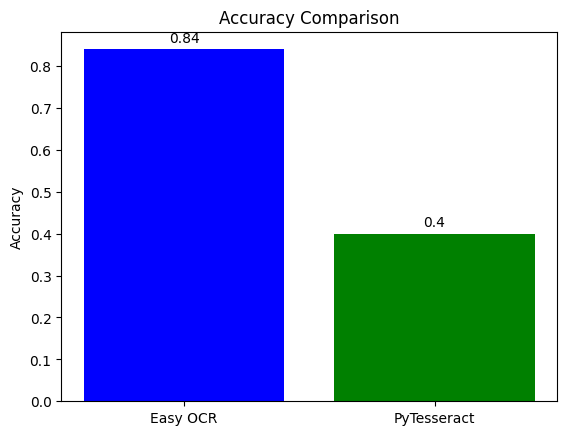

In [48]:
data = [0.84, 0.4]
categories = ['Easy OCR', 'PyTesseract']  # Adjust category labels if needed

# Create a bar chart
plt.bar(categories, data, color=['blue', 'green'])
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')

# Add data values on top of each bar
for bar_index, value in enumerate(data):
    plt.text(bar_index, value + 0.01, str(value), ha='center', va='bottom')  # Adjust offset as needed

plt.grid(axis='y', linestyle='None', alpha=1)
plt.show()

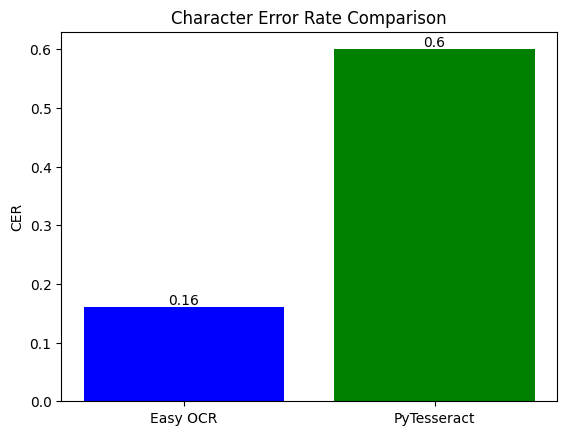

In [47]:
data = [0.16, 0.6]
categories = ['Easy OCR', 'PyTesseract']  # Adjust category labels if needed

# Create a bar chart
plt.bar(categories, data, color=['blue', 'green'])
plt.ylabel('CER')
plt.title('Character Error Rate Comparison')

# Add data values on top of each bar
for bar_index, value in enumerate(data):
    plt.text(bar_index, value, str(value), ha='center', va='bottom')  # Adjust offset as needed

plt.grid(axis='y', linestyle='None', alpha=1)
plt.show()

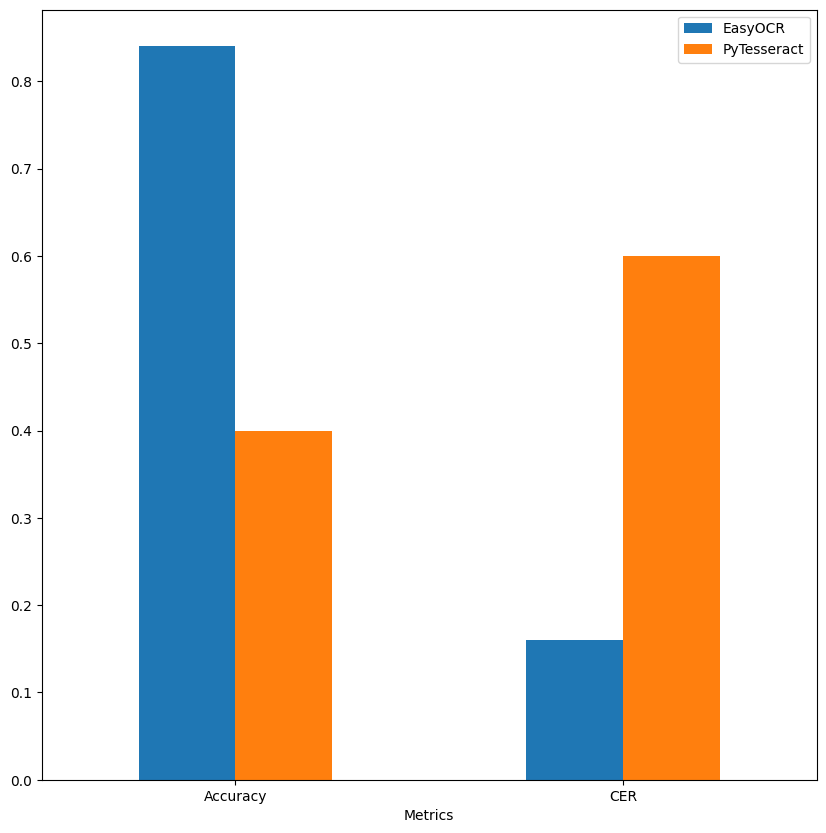

In [57]:

import pandas as pd
import matplotlib.pyplot as plt
 
# Data to be plotted
data = [["Accuracy", 0.84, 0.4],
        ["CER", 0.16, 0.6]]
 
# Form DataFrame from data
df = pd.DataFrame(data, columns=["Metrics", "EasyOCR", "PyTesseract"])
 
# Plot unstacked multiple columns such as population and year from DataFrame
df.plot(x="Metrics", y=["EasyOCR", "PyTesseract"],
        kind="bar", figsize=(10, 10))
# add data value on top of each bar


plt.xticks(rotation=0)
# Display plot
plt.show()
